# Extract data from Tagtog

## Importing the necessary elements

In [ ]:
import os
import re
import json
import random
import requests
from datetime import datetime
import numpy as np


import pandas as pd
import json
import csv
from copy import deepcopy
from bs4 import BeautifulSoup
import seaborn as sns
import matplotlib.pyplot as plt
pd.set_option('display.max_colwidth', None)

In [ ]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import ComplementNB
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from skmultilearn.problem_transform import BinaryRelevance
from skmultilearn.problem_transform import ClassifierChain
from skmultilearn.problem_transform import LabelPowerset
from skmultilearn.ensemble import RakelD
from skmultilearn.ensemble import LabelSpacePartitioningClassifier
from skmultilearn.cluster import NetworkXLabelGraphClusterer
from skmultilearn.cluster import LabelCooccurrenceGraphBuilder
from skmultilearn.ensemble import MajorityVotingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC




from nltk import word_tokenize          
from nltk.stem import WordNetLemmatizer 
from nltk.stem.snowball import SnowballStemmer
from nltk.corpus import stopwords

from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression

from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot

import nltk
nltk.download('punkt')
nltk.download('wordnet')
nltk.download('stopwords')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


True

In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')

## Extractic the data

In [ ]:
API_URL = "https://www.tagtog.net/-api/documents/v1"

PROJECT, PROJECT_OWNER, PASSWORD = (
    "MitreMatrix",
    "readerbench",
    "Fs8rHCzd2$Lh#G7a^9Js",
)
USERNAME = 'octavian-grigorescu'

AUTH = requests.auth.HTTPBasicAuth(username=USERNAME, password=PASSWORD)

PROJECT_MEMBERS = [
    # "master",  # master version of a doc, not a project member
    "octavian-grigorescu",
    "andreeanica",
    "CipStanila",
    "ioanabranescu0601",
    "joanna14",
]

In [ ]:
JSON_MAP = {
    "m_17":"10_LateralMovement",
    "m_7":"ImpactScore",
    "m_18":"11_Collection",
    "m_13":"06_PrivilegeEscalation",
    "m_8":"01_Reconnaissance",
    "m_10":"03_InitialAccess",
    "m_14":"07_DefenseEvasion",
    "m_9":"02_ResourceDevelopment",
    "m_5":"BaseScore",
    "m_21":"14_Impact",
    "m_4":"Vector",
    "m_11":"04_Execution",
    "m_15":"08_CredentialAccess",
    "m_20":"13_Exfiltration",
    "m_6":"ExploitabilityScore",
    "m_19":"12_CommandAndControl",
    "m_16":"09_Discovery",
    "m_12":"05_Persistence"
}

JSON_MAP_REVERSE = {v: k for k, v in JSON_MAP.items()}

CATEGORY = {
    'Reconnaissance': [
                       'Active Scanning',
                       'Gather Victim Host Information', 
                       'Gather Victim Identity Information', 
                       'Gather Victim Network Information', 
                       'Gather Victim Org Information',
                       'Phishing for Information',
                       'Search Closed Sources',
                       'Search Open Technical Databases',
                       'Search Open Websites/Domains','Search Victim-Owned Websites'
    ],
    'Resource Development': [
                             'Acquire Infrastructure',
                             'Compromise Accounts',
                             'Compromise Infrastructure',
                             'Develop Capabilities',
                             'Establish Accounts',
                             'Obtain Capabilities',
                             'Stage Capabilities'  
    ],
    'Initial Access': [
                       'Drive-by Compromise',
                       'Exploit Public-Facing Application',
                       'External Remote Services',
                       'Hardware Additions',
                       'Phishing',
                       'Replication Through Removable Media',
                       'Supply Chain Compromise',
                       'Trusted Relationship',
                       'Valid Accounts'
    ],
    'Execution': [
                  'Command and Scripting Interpreter',
                  'Container Administration Command',
                  'Deploy Container',
                  'Exploitation for Client Execution',
                  'Inter-Process Communication',
                  'Native API',
                  'Scheduled Task/Job',
                  'Shared Modules',
                  'Software Deployment Tools',
                  'System Services',
                  'User Execution',
                  'Windows Management Instrumentation'
    ],
    'Persistence': [
                    'Account Manipulation',
                    'BITS Jobs',
                    'Boot or Logon Autostart Execution',
                    'Boot or Logon Initialization Scripts',
                    'Browser Extensions',
                    'Compromise Client Software Binary',
                    'Create Account',
                    'Create or Modify System Process',
                    'Event Triggered Execution',
                    'External Remote Services',
                    'Hijack Execution Flow',
                    'Implant Internal Image',
                    'Modify Authentication Process'
                    'Office Application Startup',
                    'Pre-OS Boot',
                    'Scheduled Task/Job',
                    'Server Software Component',
                    'Traffic Signaling',
                    'Valid Accounts'
    ],
    'Privilege Escalation': [
                             'Abuse Elevation Control Mechanism',
                             'Access Token Manipulation',
                             'Boot or Logon Autostart Execution',
                             'Boot or Logon Initialization Scripts',
                             'Create or Modify System Process',
                             'Domain Policy Modification',
                             'Escape to Host',
                             'Event Triggered Execution',
                             'Exploitation for Privilege Escalation',
                             'Hijack Execution Flow',
                             'Process Injectio',
                             'Scheduled Task/Job',
                             'Valid Accounts'
    ],
    'Defense Evasion': [
                        'Abuse Elevation Control Mechanism',
                        'Access Token Manipulation',
                        'BITS Jobs',
                        'Build Image on Host',
                        'Debugger Evasion',
                        'Deobfuscate/Decode Files or Information',
                        'Deploy Container',
                        'Direct Volume Access',
                        'Domain Policy Modification',
                        'Execution Guardrails',
                        'Exploitation for Defense Evasion',
                        'File and Directory Permissions Modification',
                        'Hide Artifacts',
                        'Hijack Execution Flow',
                        'Impair Defenses',
                        'Indicator Removal on Host',
                        'Indirect Command Execution',
                        'Masquerading',
                        'Modify Authentication Process',
                        'Modify Cloud Compute Infrastructure',
                        'Modify Registry',
                        'Modify System Image',
                        'Network Boundary Bridging',
                        'Obfuscated Files or Information',
                        'Plist File Modification',
                        'Pre-OS Boot',
                        'Process Injection',
                        'Reflective Code Loading',
                        'Rogue Domain Controller',
                        'Rootkit',
                        'Subvert Trust Controls',
                        'System Binary Proxy Execution',
                        'System Script Proxy Execution',
                        'Template Injection',
                        'Traffic Signaling',
                        'Trusted Developer Utilities Proxy Execution',
                        'Unused/Unsupported Cloud Regions',
                        'Use Alternate Authentication Material',
                        'Valid Accounts',
                        'Virtualization/Sandbox Evasion',
                        'Weaken Encryption',
                        'XSL Script Processing'
    ],
    'Credential Access': [
                          'Adversary-in-the-Middle',
                          'Brute Force',
                          'Credentials from Password Stores',
                          'Exploitation for Credential Access',
                          'Forced Authentication',
                          'Forge Web Credentials',
                          'Input Capture',
                          'Modify Authentication Process',
                          'Multi-Factor Authentication Interception',
                          'Multi-Factor Authentication Request Generation',
                          'Network Sniffing',
                          'OS Credential Dumping',
                          'Steal Application Access Token',
                          'Steal or Forge Kerberos Tickets',
                          'Steal Web Session Cookie',
                          'Unsecured Credentials',
    ],
    'Discovery': [
                  'Account Discovery',
                  'Application Window Discovery',
                  'Browser Bookmark Discovery',
                  'Cloud Infrastructure Discovery',
                  'Cloud Service Dashboard',
                  'Cloud Service Discovery',
                  'Cloud Storage Object Discovery',
                  'Container and Resource Discovery',
                  'Debugger Evasion',
                  'Domain Trust Discovery',
                  'File and Directory Discovery',
                  'Group Policy Discovery',
                  'Network Service Discovery',
                  'Network Share Discovery',
                  'Network Sniffing',
                  'Password Policy Discovery',
                  'Peripheral Device Discovery',
                  'Permission Groups Discovery',
                  'Process Discovery',
                  'Query Registry',
                  'Remote System Discovery',
                  'Software Discovery',
                  'System Information Discovery',
                  'System Location Discovery',
                  'System Network Configuration Discovery',
                  'System Network Connections Discovery',
                  'System Owner/User Discovery',
                  'System Service Discovery',
                  'System Time Discovery',
                  'Virtualization/Sandbox Evasion'
    ],
    'Lateral Movement': [
                         'Exploitation of Remote Services',
                         'Internal Spearphishing',
                         'Lateral Tool Transfer',
                         'Remote Service Session Hijacking',
                         'Remote Services',
                         'Replication Through Removable Media',
                         'Software Deployment Tools',
                         'Taint Shared Content',
                         'Use Alternate Authentication Material'
    ],
    'Collection': [
                   'Adversary-in-the-Middle',
                   'Archive Collected Data',
                   'Audio Capture',
                   'Automated Collection',
                   'Browser Session Hijacking',
                   'Clipboard Data',
                   'Data from Cloud Storage Object',
                   'Data from Configuration Repository',
                   'Data from Information Repositories',
                   'Data from Local System',
                   'Data from Network Shared Drive',
                   'Data from Removable Media',
                   'Data Staged',
                   'Email Collection',
                   'Input Capture', 
                   'Screen Capture',
                   'Video Capture'
    ],
    'Command and Control': [
                            'Application Layer Protocol',
                            'Communication Through Removable Media',
                            'Data Encoding',
                            'Data Obfuscation',
                            'Dynamic Resolution',
                            'Encrypted Channel', 
                            'Fallback Channels',
                            'Ingress Tool Transfer',
                            'Multi-Stage Channels',
                            'Non-Application Layer Protocol',
                            'Non-Standard Port',
                            'Protocol Tunneling',
                            'Proxy',
                            'Remote Access Software',
                            'Traffic Signaling',
                            'Web Service'
    ],
    'Exfiltration': [
                     'Automated Exfiltration', 
                     'Data Transfer Size Limits', 
                     'Exfiltration Over Alternative Protocol',
                     'Exfiltration Over C2 Channel', 
                     'Exfiltration Over Other Network Medium', 
                     'Exfiltration Over Physical Medium', 
                     'Exfiltration Over Web Service', 
                     'Scheduled Transfer', 
                     'Transfer Data to Cloud Account'
    ],
    'Impact': [
               'Account Access Removal',
               'Data Destruction',
               'Data Encrypted for Impact',
               'Data Manipulation',
               'Defacement',
               'Disk Wipe',
               'Endpoint Denial of Service',
               'Firmware Corruption',
               'Inhibit System Recovery',
               'Network Denial of Service',
               'Resource Hijacking',
               'Service Stop',
               'System Shutdown/Reboot'
    ]
}


TECHNIQUES = set()

for tactic in CATEGORY.keys():
  for technique in CATEGORY[tactic]:
    TECHNIQUES.add(technique)

In [ ]:
len(TECHNIQUES)

192

In [ ]:
def load_data_from_tagtog():
  X = pd.DataFrame(columns=('CVE', 'Text'))
  Y = pd.DataFrame(columns=TECHNIQUES)


  params = {"owner": "readerbench", "project": "MitreMatrix", "search": "*", "output":"csv"}
  response = requests.get(API_URL, params=params, auth=AUTH)

  lines = response.text.splitlines()
  reader = csv.reader(lines, delimiter=',')
  next(reader, None) # skip header

  for doc in reader:
    id = doc[0]
    
    params = {"owner": "readerbench", "project": "MitreMatrix", 'ids':id, "output": "plain.html"}
    response = requests.get(API_URL, params=params, auth=AUTH)

    soup = BeautifulSoup(response.text, 'html.parser')
    
    cve_id = soup.html.attrs['data-origid'].split('.')[0]
    cve_content = soup.find(id='s1v1')
    
    new_row = {'CVE':cve_id, 'Text':cve_content }
    X = X.append(new_row, ignore_index=True)

    params = {"owner": "readerbench", "project": "MitreMatrix", 'ids':id, "output": "ann.json"}
    response = requests.get(API_URL, params=params, auth=AUTH)

    ann = json.loads(response.text)

    techniques_labels = {}
    
    for tactic in ann['metas'].keys():
      if JSON_MAP[tactic] in ['ImpactScore', 'BaseScore', 'ExploitabilityScore', 'Vector']:
        continue
      for technique in ann['metas'][tactic]['value'].split(','):
        technique = technique.strip(" ")
      
        if technique not in TECHNIQUES:
          continue
        else:
          techniques_labels[technique] = 1
    
    Y = Y.append(techniques_labels, ignore_index=True)

  Y.fillna(0, inplace=True)

  return (X, Y)
  



In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X, Y) = load_data_from_file('X4.csv', 'Y5.csv')

In [ ]:
X_train = X[:int(0.8 * len(X))]
Y_train = Y[:int(0.8 * len(X))]

X_test = X[int(0.8 * len(X)):]
Y_test = Y[int(0.8 * len(X)):]

## Analyze the data

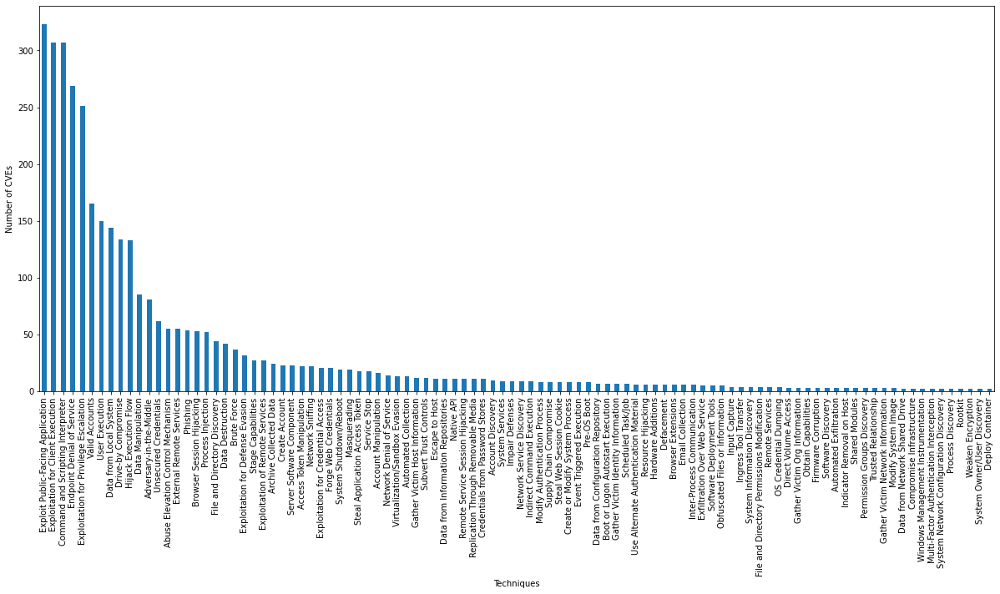

In [ ]:
Y_count = Y.apply(np.sum, axis=0)
ax = Y_count.sort_values(ascending=False)[:100].plot.bar(x='lab', y='val', rot=0)
ax.set_xlabel("Techniques")
ax.set_ylabel("Number of CVEs")
plt.xticks(rotation=90)
fig = plt.gcf()

fig.set_size_inches(20.5, 8.5)

# Format the data

## Imports

In [ ]:
!pip install -U scikit-learn
!pip install scikit-multilearn
!pip install spacy
!python -m spacy download en_core_web_sm
!pip install textattack
!python -m pip install tensorflow_text
!conda install -c conda-forge cudatoolkit=11.2 cudnn=8.1.0
!export LD_LIBRARY_PATH=$LD_LIBRARY_PATH:$CONDA_PREFIX/lib/
!pip install tensorflow==2.7.0
!pip install keras==2.4.3
!pip install tensorflow-text
!pip install --upgrade numpy


In [ ]:
import pandas as pd
import numpy as np

import os
import re
import json
import random
import requests
from datetime import datetime
import json
import csv
from copy import deepcopy
import seaborn as sns
import matplotlib.pyplot as plt
import seaborn as sns
from skmultilearn.model_selection import iterative_train_test_split

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train, y_train) = load_data_from_file('X_train.csv', 'y_train.csv')
(X_train_extended, y_train_extended) = load_data_from_file('final_extended_X_train.csv', 'final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')
pd.set_option('display.max_colwidth', None)

## Format the data

In [ ]:
def keep_relevant_techniques(Y, threshold):
  Y_count = Y.apply(np.sum, axis=0)
  columns_to_keep = Y_count[Y_count >= threshold].index
  return Y[columns_to_keep]

def remove_irrelevant_CVE(X, Y):
  is_CVE_used = Y.apply(lambda row: np.bitwise_or.reduce(row.values), axis = 1)
  indexes_to_keep = list(is_CVE_used[is_CVE_used == 1].index)
  X_final = X.loc[indexes_to_keep]
  Y_final = Y.loc[indexes_to_keep]

  X_final.reset_index(inplace=True, drop=True)
  Y_final.reset_index(inplace=True, drop=True)

  return (X_final, Y_final)

def filter_input_data(X, Y, threshold):
  return remove_irrelevant_CVE(X, keep_relevant_techniques(Y, threshold))



In [ ]:
(X, Y) = filter_input_data(X, Y, 20)


## Split the data

In [ ]:
X_train_arr, y_train_arr, X_test_arr, y_test_arr = iterative_train_test_split(X.to_numpy(), Y.values, test_size = 0.2)


In [ ]:
X_train = pd.DataFrame(X_train_arr, columns=['Name', 'Text'])
X_test = pd.DataFrame(X_test_arr, columns=['Name', 'Text'])
y_train = pd.DataFrame(y_train_arr, columns=Y.columns)
y_test = pd.DataFrame(y_test_arr, columns=Y.columns)

In [ ]:
def save_the_splitted_data_to_csv(X_train, X_test, y_train, y_test):
  X_train.to_csv('X_train.csv', index=False)
  X_test.to_csv('X_test.csv', index=False)
  y_train.to_csv('y_train.csv', index=False)
  y_test.to_csv('y_test.csv', index=False)

## Analyse the data

In [ ]:
def plot_labels_count(Y):
  Y_count = Y.apply(np.sum, axis=0)
  ax = Y_count.sort_values(ascending=False).plot.bar(x='lab', y='val', rot=0)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)
  fig = plt.gcf()

  fig.set_size_inches(20.5, 8.5)

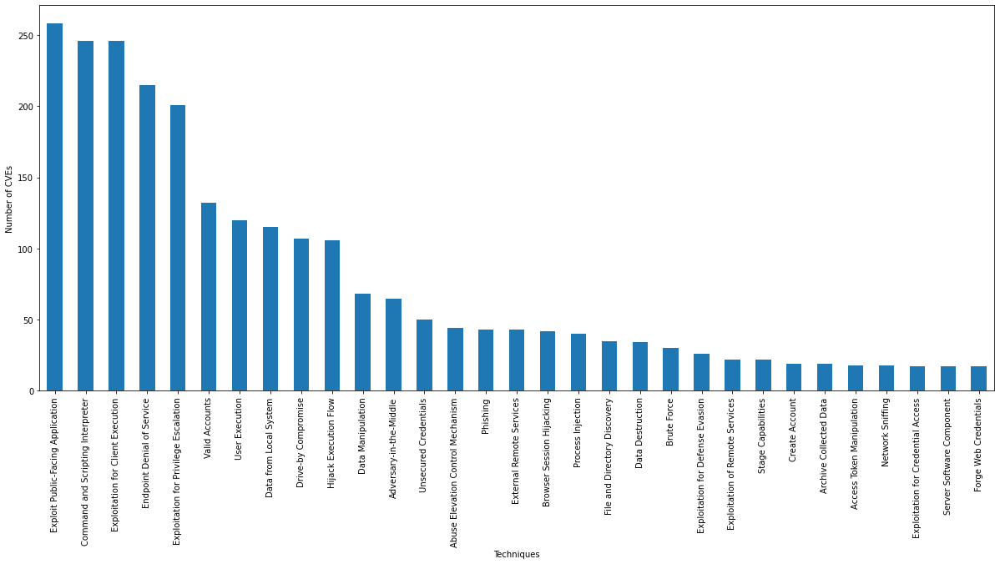

In [ ]:
plot_labels_count(y_train)

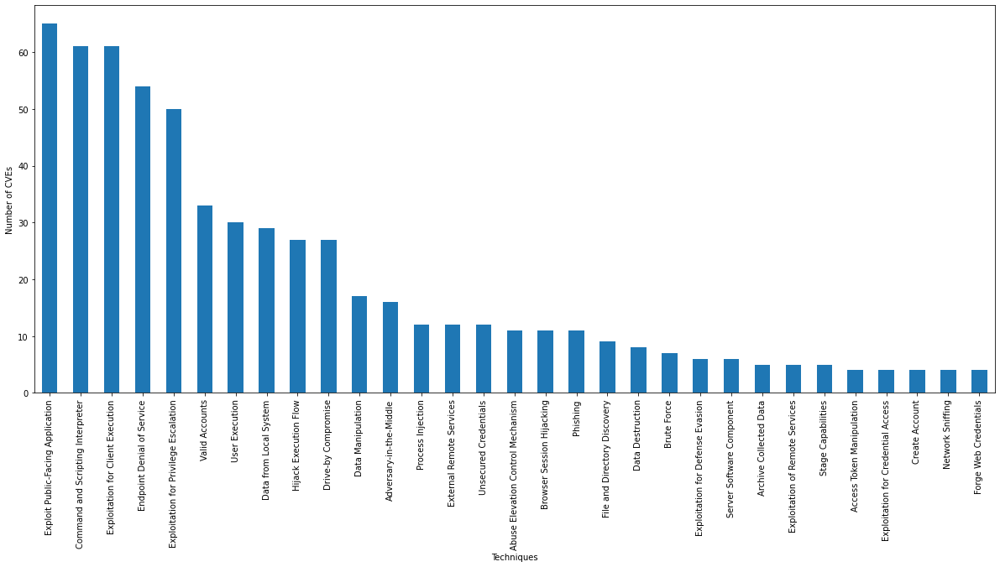

In [ ]:
plot_labels_count(y_test)

# Augument the data

In [ ]:
import tensorflow as tf
from textattack.augmentation import EmbeddingAugmenter
from textattack.augmentation import WordNetAugmenter
from textattack.augmentation import CLAREAugmenter
from textattack.augmentation import EasyDataAugmenter

In [ ]:
def get_text_from_X_y(X_examples, y_examples):
  def f(index):
    targeted_CVE = y_examples[y_examples[index] == 1].index
    return [(X_examples.iloc[target], y_examples.iloc[target], target) for target in targeted_CVE]
  return f

def get_only_representative_text(X_train, y_train):
  nr_tech_per_CVE = y_train.apply(np.sum, axis = 1)

  def get_representative_CVE(col):
    representative_index = list(col[col == 1].index)
    representative_index = list(filter(lambda ind : nr_tech_per_CVE[ind] == 1, representative_index))
    return representative_index
  
  representative_CVE_list = y_train.apply(get_representative_CVE, axis = 0)
  def f(index):
    targeted_CVE = representative_CVE_list[index]
    return [(X_train.iloc[target], y_train.iloc[target], target) for target in targeted_CVE]
  return f

def augument_existing_data(X_train, y_train, get_base_text, skip_name = None, skip_X = None, skip_y = None):
  if skip_name is None:
    new_y_train = y_train
    new_X_train = X_train
  else:
    new_y_train = skip_y
    new_X_train = skip_X

  Y_count = y_train.apply(np.sum, axis=0)
  sorted_Y = Y_count.sort_values(ascending=False)
  max_value = None
  continue_skipping = True
  if skip_name is None:
    continue_skipping = False

  for index in sorted_Y.index:
    print(index)
    if max_value is None:
      max_value = sorted_Y[index]
    else:
      if skip_name == index:
        continue_skipping = False
      if not continue_skipping:
        new_X_train.to_csv('extended_X_train_' + index + '.csv', index=False)
        new_y_train.to_csv('extended_y_train_' + index + '.csv', index=False)
      else:
        continue

      current_value = sorted_Y[index]
      if max_value / current_value >= 2:
        targeted_CVE = get_base_text(index)
        
        if len(targeted_CVE) > 0:
          multiple = int((max_value - current_value)  / len(targeted_CVE))
        else:
          multiple = 0
          continue
        if multiple > 10:
          multiple = 10

        aug = EasyDataAugmenter(transformations_per_example=multiple)

        for target in targeted_CVE:
          print(target[2])
          augumented_text_for_CVE = aug.augment(target[0]['Text'])
          cnt = 0
          for text in augumented_text_for_CVE:
            new_row_X = {'Name': target[0]['Name'] + "_augumented_" + str(cnt), 'Text':text}
            new_X_train = new_X_train.append(new_row_X, ignore_index=True)
            new_y_train = new_y_train.append(target[1], ignore_index=True)
            cnt += 1
        
  return (new_X_train, new_y_train)



In [ ]:
X_examples = pd.DataFrame(columns=X_train.columns)
y_examples = pd.DataFrame(columns=y_train.columns)

def parse_techniques_example(row):
  new_row_X = {'Name':"example_" + str(row.name), 'Text': row['Description']}
  new_row_y = {row['Technique']:1}
  global X_examples, y_examples

  X_examples = X_examples.append(new_row_X, ignore_index=True)
  y_examples = y_examples.append(new_row_y, ignore_index=True)

y_examples.fillna(0, inplace=True)
y_examples = y_examples.astype(int)

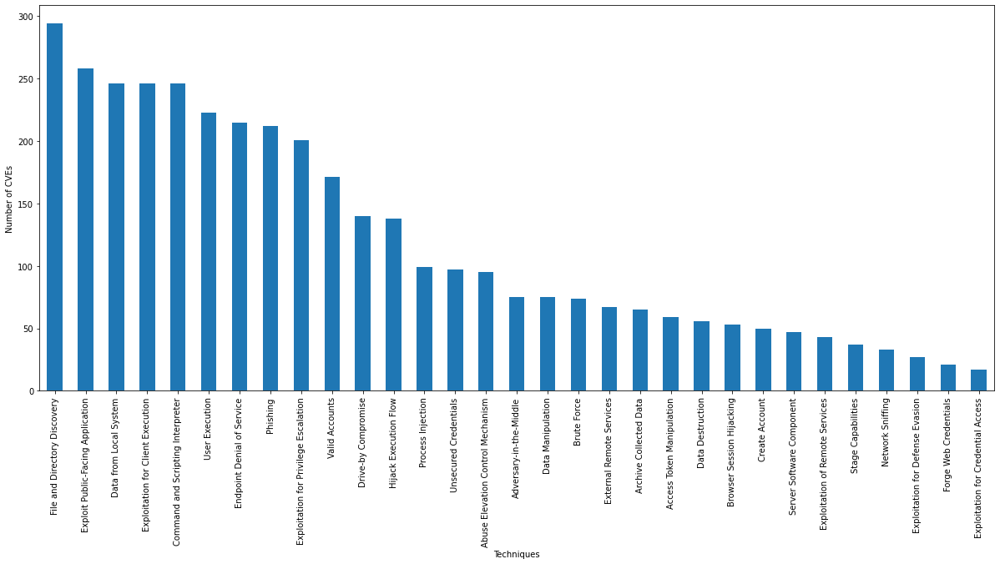

In [ ]:
final_X_train  = X_train.append(X_examples, ignore_index=True)
final_y_train  = y_train.append(y_examples, ignore_index=True)
plot_labels_count(final_y_train)

In [ ]:
(augumented_X_train, augumented_y_train) = augument_existing_data(final_X_train, final_y_train, get_text_from_X_y(X_examples, y_examples))

In [ ]:
(phising_X, phishing_y) = load_data_from_file('extended_X_train_Phishing.csv', 'extended_y_train_Phishing.csv')
(augumented_X_train, augumented_y_train) = augument_existing_data(X_train, 
                                                                  y_train, 
                                                                  get_only_representative_text(X_train, y_train),
                                                                  'Phishing',
                                                                  phising_X,
                                                                  phishing_y)

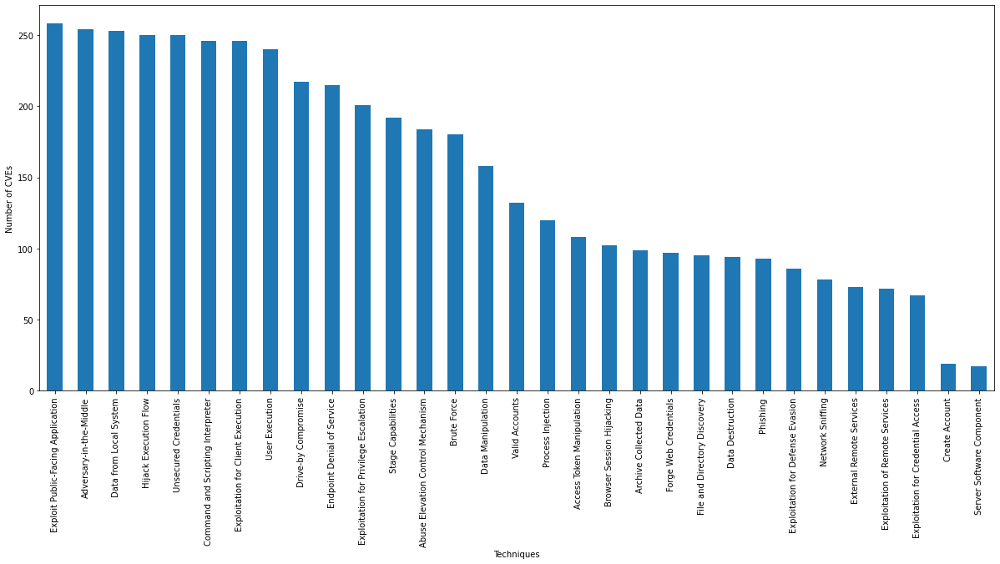

In [ ]:
plot_labels_count(augumented_y_train)

In [ ]:
augumented_X_train.to_csv('final_extended_X_train.csv', index=False)
augumented_y_train.to_csv('final_extended_y_train.csv', index=False)

# Classical Machine Learning

## Imports

In [ ]:
!pip install -U scikit-learn
!pip install scikit-multilearn

from skmultilearn.model_selection import iterative_train_test_split

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.pipeline import Pipeline
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import ComplementNB
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import f1_score, accuracy_score, recall_score, precision_score
from skmultilearn.problem_transform import BinaryRelevance
from skmultilearn.problem_transform import ClassifierChain
from skmultilearn.problem_transform import LabelPowerset
from skmultilearn.ensemble import RakelD
from skmultilearn.ensemble import LabelSpacePartitioningClassifier
from skmultilearn.cluster import NetworkXLabelGraphClusterer
from skmultilearn.cluster import LabelCooccurrenceGraphBuilder
from skmultilearn.ensemble import MajorityVotingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC


from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression

from sklearn.tree import DecisionTreeRegressor
from matplotlib import pyplot



from sklearn.metrics import multilabel_confusion_matrix

from sklearn.metrics import hamming_loss



## Auxiliary functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and token.is_alpha ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title('Seaborn Confusion Matrix with labels\n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [ ]:
def plot_grid_search(cv_results, name_param_1, name_param_2, score_m, limit=None):
    results_df = pd.DataFrame(cv_results)
    results_df = results_df.assign(
        param1=results_df["params"].apply(lambda x: x[name_param_1])
    )
    results_df = results_df.assign(
        param2=results_df["params"].apply(lambda x: x[name_param_2])
    )
    plot = sns.lineplot(data=results_df, x="param1", y=score_m, hue="param2")
    plot.set(xlabel=name_param_1, ylabel=score_m)
    plot.legend(title=name_param_2)
    if limit is not None:
      plot.set_xlim(left=0, right=limit)


def plot_grid_search3D(cv_results, name_param_1, name_param_2, name_param_3, score_m, limit=None):
    results_df = pd.DataFrame(cv_results)
    results_df = results_df.assign(
        param1=results_df["params"].apply(lambda x: x[name_param_1])
    )
    results_df = results_df.assign(
        param2=results_df["params"].apply(lambda x: x[name_param_2])
    )
    results_df = results_df.assign(
        param3=results_df["params"].apply(lambda x: x[name_param_3])
    )

    fig = plt.figure(figsize=(6,6))
    ax = Axes3D(fig)
    fig.add_axes(ax)

    # get colormap from seaborn
    cmap = ListedColormap(sns.color_palette("hls", 8))

    # plot
    sc = ax.scatter(xs=results_df['param1'], ys=results_df['param2'], zs=results_df[score_m], s=40, c=results_df['param3'], marker='o', cmap=cmap, alpha=1)
    ax.set_xlabel(name_param_1)
    ax.set_ylabel(name_param_2)
    ax.set_zlabel("Accuracy")

    # legend
    plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)

## Naive Bayes Label PowerSet

In [ ]:
text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       
                       lowercase = True,
                       max_df = 0.7,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', LabelPowerset(classifier=MultinomialNB())),
])

text_clf.fit(X_train['Text'], y_train.values)
prediction = text_clf.predict(X_test['Text'])

In [ ]:
print(accuracy_score(y_test.values, prediction))

0.11356466876971609


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Client Execution,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Exploit Public-Facing Application,User Execution,Drive-by Compromise,Exploitation of Remote Services,Stage Capabilities,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.592,0.516667,0.469565,0.405797,0.3,0.288462,0.285714,0.242424,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


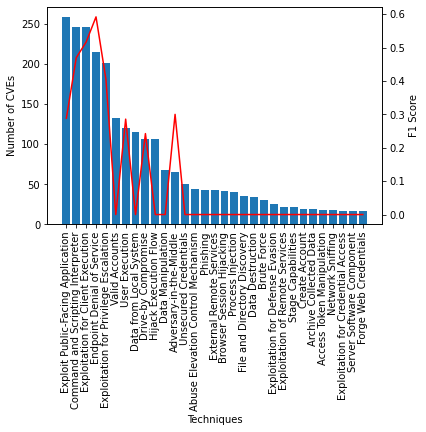

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction, y_train,  y_test.columns)

In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,User Execution,Adversary-in-the-Middle,Drive-by Compromise,Exploitation for Client Execution,Endpoint Denial of Service,Command and Scripting Interpreter,Exploit Public-Facing Application,Exploitation for Privilege Escalation,Exploitation of Remote Services,Stage Capabilities,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,1.0,0.75,0.666667,0.525424,0.521127,0.5,0.384615,0.318182,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Exploitation for Client Execution,Command and Scripting Interpreter,Exploit Public-Facing Application,Adversary-in-the-Middle,User Execution,Drive-by Compromise,Exploitation of Remote Services,Stage Capabilities,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.685185,0.56,0.508197,0.442623,0.230769,0.1875,0.166667,0.148148,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.24768013625718546


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.31409964497891896


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.2459016393442623


In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction)

Process Injection


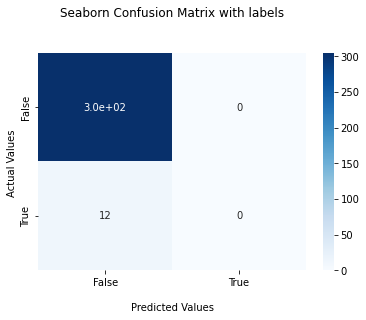

In [ ]:
print(y_test.columns[0])
print_confusion_matrix(conf_matrix[0])

Access Token Manipulation


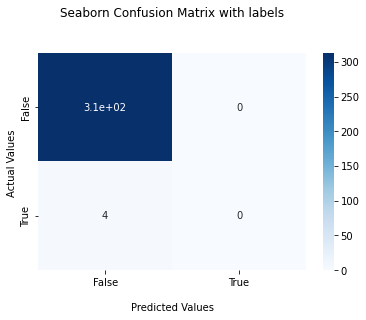

In [ ]:
print(y_test.columns[1])
print_confusion_matrix(conf_matrix[1])

Hijack Execution Flow


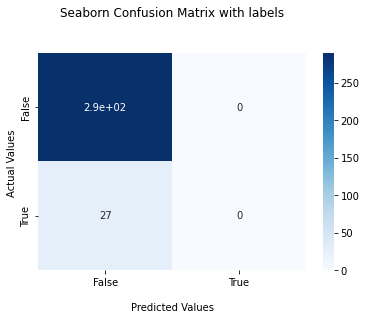

In [ ]:
print(y_test.columns[2])
print_confusion_matrix(conf_matrix[2])

Data from Local System


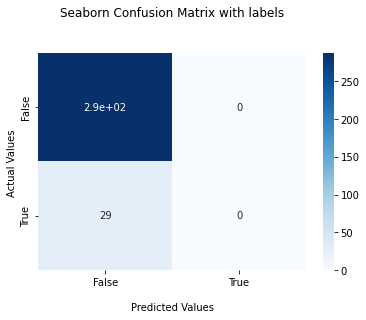

In [ ]:
print(y_test.columns[3])
print_confusion_matrix(conf_matrix[3])

External Remote Services


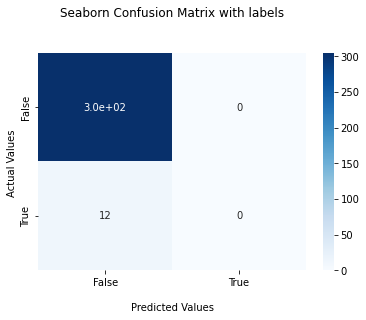

In [ ]:
print(y_test.columns[4])
print_confusion_matrix(conf_matrix[4])

Data Manipulation


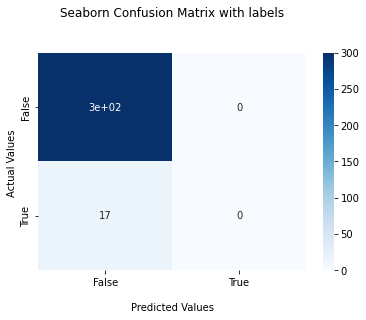

In [ ]:
print(y_test.columns[5])
print_confusion_matrix(conf_matrix[5])

Network Sniffing


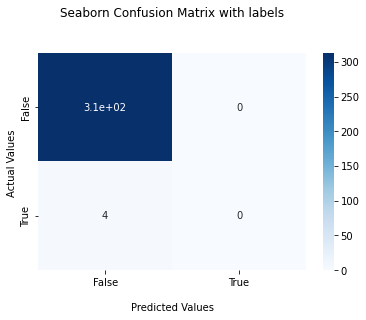

In [ ]:
print(y_test.columns[6])
print_confusion_matrix(conf_matrix[6])

Exploitation for Privilege Escalation


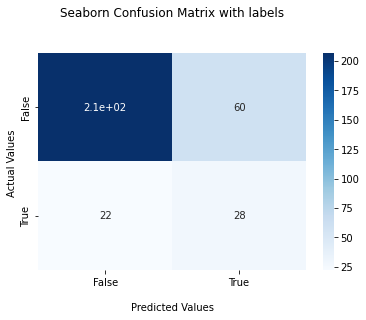

In [ ]:
print(y_test.columns[7])
print_confusion_matrix(conf_matrix[7])

Phishing


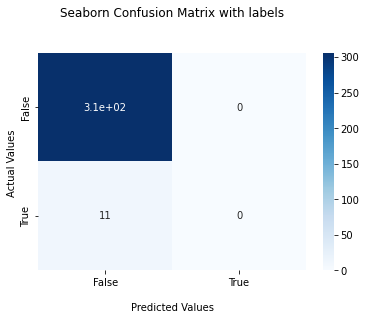

In [ ]:
i = 9
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Server Software Component


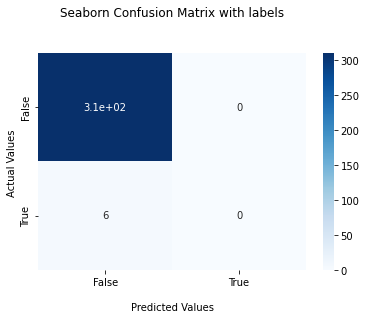

In [ ]:
i = 10
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Archive Collected Data


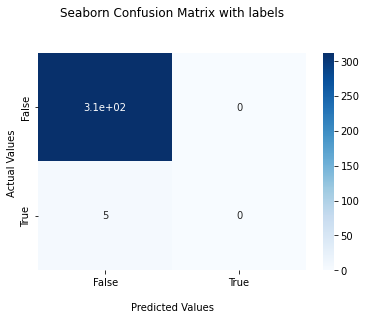

In [ ]:
i = 11
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Data Destruction


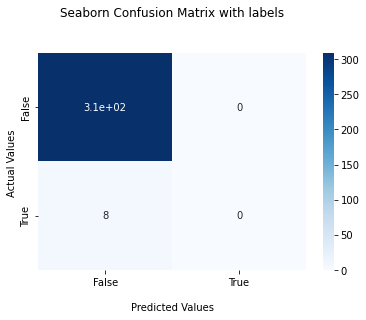

In [ ]:
i = 12
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Browser Session Hijacking


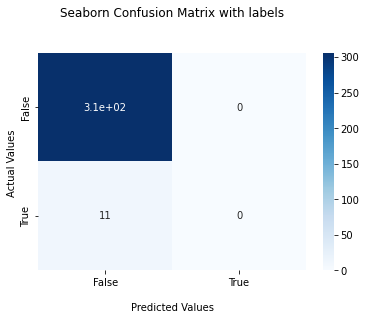

In [ ]:
i = 13
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Exploitation for Credential Access


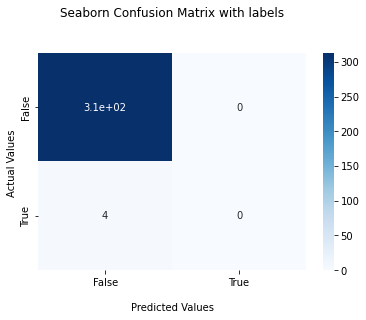

In [ ]:
i = 14
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Abuse Elevation Control Mechanism


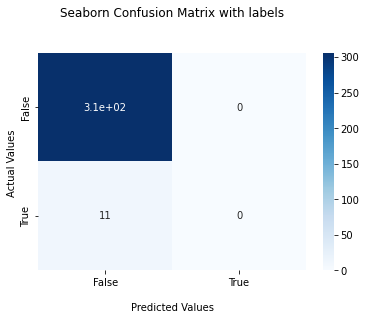

In [ ]:
i = 15
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Adversary-in-the-Middle


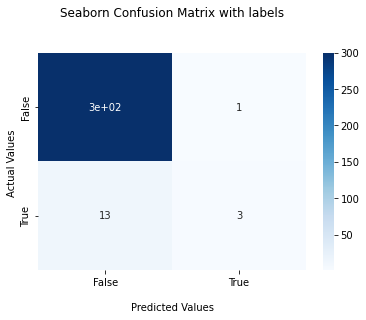

In [ ]:
i = 16
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

User Execution


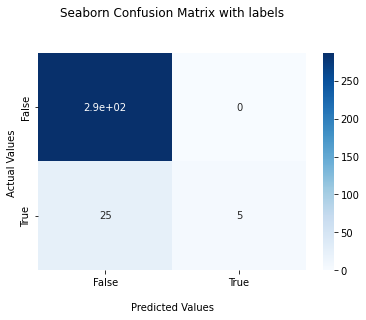

In [ ]:
i = 17
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Unsecured Credentials


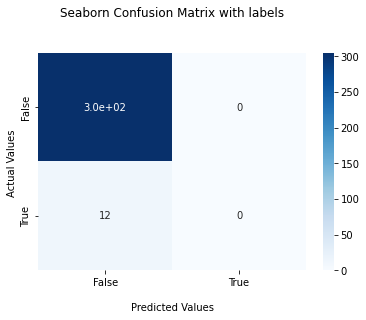

In [ ]:
i = 18
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Brute Force


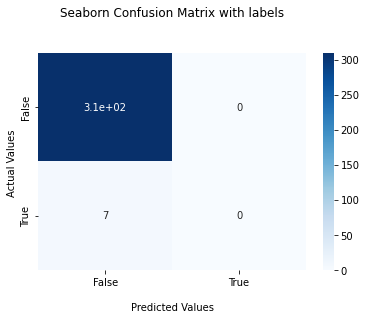

In [ ]:
i = 19
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

File and Directory Discovery


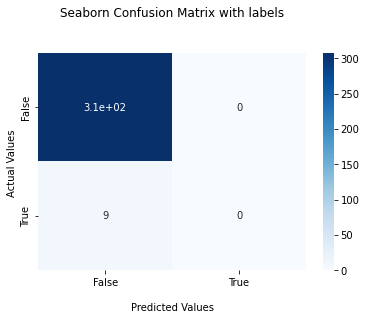

In [ ]:
i = 20
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Valid Accounts


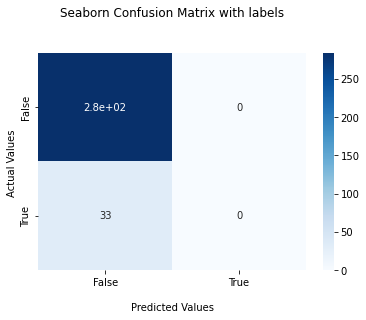

In [ ]:
i = 21
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Exploitation for Defense Evasion


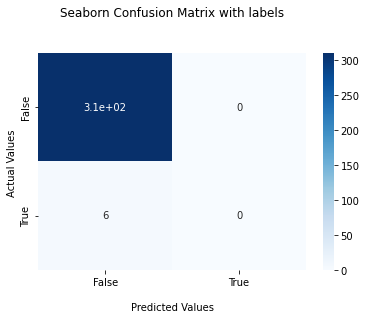

In [ ]:
i = 22
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Create Account


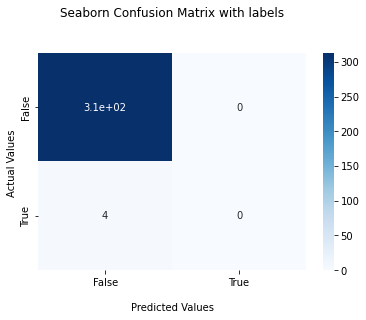

In [ ]:
i = 23
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Endpoint Denial of Service


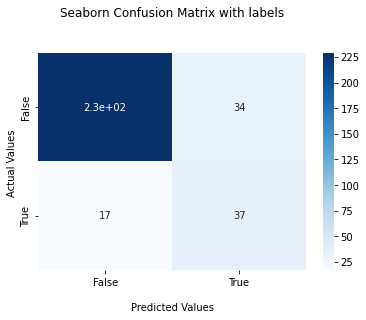

In [ ]:
i = 24
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Drive-by Compromise


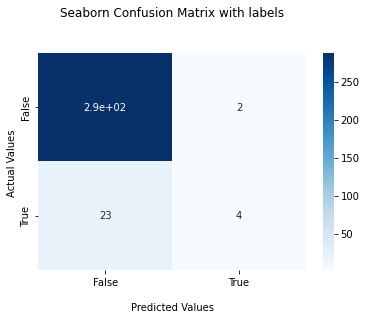

In [ ]:
i = 25
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Exploitation for Client Execution


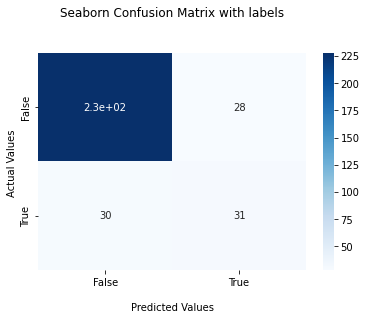

In [ ]:
i = 26
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Exploitation of Remote Services


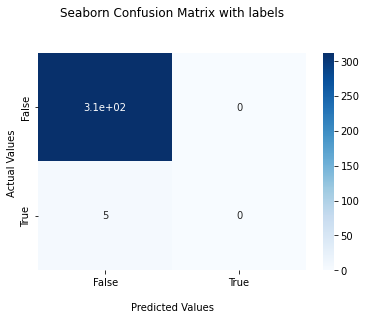

In [ ]:
i = 27
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Stage Capabilities


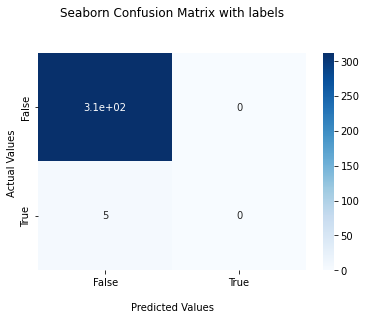

In [ ]:
i = 28
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Exploit Public-Facing Application


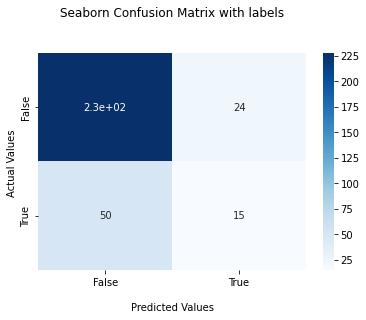

In [ ]:
i = 29
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

Forge Web Credentials


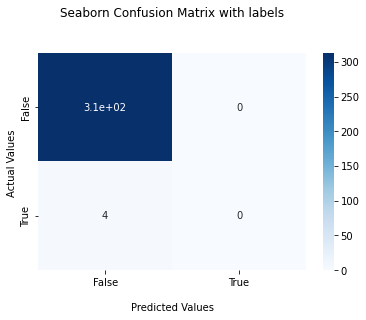

In [ ]:
i = 30
print(y_test.columns[i])
print_confusion_matrix(conf_matrix[i])

## Naive Bayes OneVsRestClassifier 

Normal

In [ ]:
text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       
                       lowercase = True,
                       max_df = 0.7,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', OneVsRestClassifier(MultinomialNB())),
])

text_clf.fit(X_train['Text'], y_train.values)
prediction = text_clf.predict(X_test['Text'])

In [ ]:
print(accuracy_score(y_test.values, prediction))

0.03785488958990536


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,Exploit Public-Facing Application,Drive-by Compromise,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.487179,0.341463,0.277778,0.222222,0.145455,0.114286,0.088235,0.071429,0.064516,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


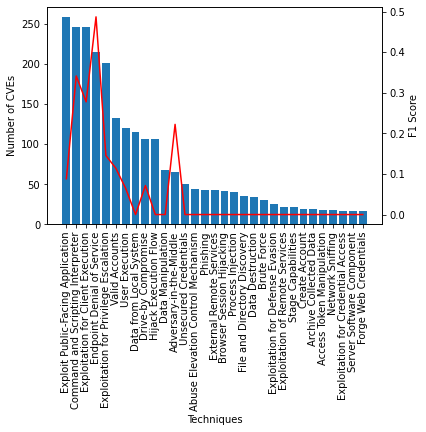

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction, y_train,  y_test.columns)

In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Adversary-in-the-Middle,User Execution,Exploit Public-Facing Application,Valid Accounts,Drive-by Compromise,Exploitation for Client Execution,Exploitation for Privilege Escalation,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,1.0,1.0,1.0,1.0,1.0,0.909091,0.8,0.791667,0.666667,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,Exploit Public-Facing Application,Drive-by Compromise,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.351852,0.229508,0.163934,0.125,0.08,0.060606,0.046154,0.037037,0.033333,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.14472207518314312


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.09180327868852459


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.5735593641331347


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction)

## Naive Bayes Binary Relevance

Normal

In [ ]:
text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       
                       lowercase = True,
                       max_df = 0.7,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', BinaryRelevance(classifier=MultinomialNB())),
])

text_clf.fit(X_train['Text'], y_train.values)
prediction = text_clf.predict(X_test['Text'])

In [ ]:
print(accuracy_score(y_test.values, prediction))

0.03785488958990536


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,Exploit Public-Facing Application,Drive-by Compromise,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.487179,0.341463,0.277778,0.222222,0.145455,0.114286,0.088235,0.071429,0.064516,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


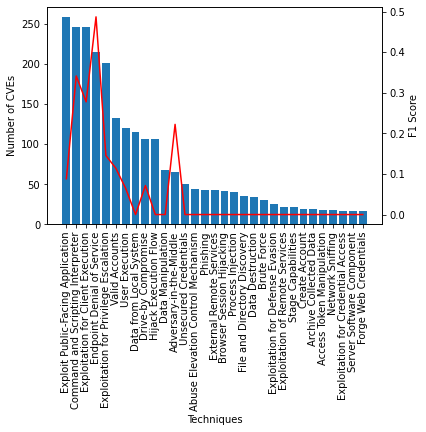

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction, y_train,  y_test.columns)

In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Adversary-in-the-Middle,User Execution,Exploit Public-Facing Application,Valid Accounts,Drive-by Compromise,Exploitation for Client Execution,Exploitation for Privilege Escalation,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,1.0,1.0,1.0,1.0,1.0,0.909091,0.8,0.791667,0.666667,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,Exploit Public-Facing Application,Drive-by Compromise,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.351852,0.229508,0.163934,0.125,0.08,0.060606,0.046154,0.037037,0.033333,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))


0.14472207518314312


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.09180327868852459


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.5735593641331347


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction)

## Naive Bayes Classifier Chain


In [ ]:
text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       
                       lowercase = True,
                       max_df = 0.7,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', ClassifierChain(classifier=MultinomialNB())),
])

text_clf.fit(X_train['Text'], y_train.values)
prediction = text_clf.predict(X_test['Text'])

In [ ]:
print(accuracy_score(y_test.values, prediction))

0.06309148264984227


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Drive-by Compromise,Exploit Public-Facing Application,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.597701,0.422222,0.337662,0.25,0.222222,0.222222,0.210526,0.166667,0.064516,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


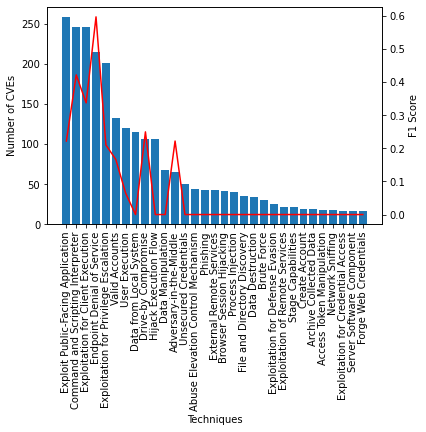

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction, y_train,  y_test.columns)

In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Adversary-in-the-Middle,Valid Accounts,User Execution,Exploitation for Privilege Escalation,Exploitation for Client Execution,Drive-by Compromise,Endpoint Denial of Service,Command and Scripting Interpreter,Exploit Public-Facing Application,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,1.0,1.0,1.0,0.857143,0.8125,0.8,0.787879,0.655172,0.5625,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Drive-by Compromise,Exploit Public-Facing Application,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Valid Accounts,User Execution,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.481481,0.311475,0.213115,0.148148,0.138462,0.125,0.12,0.090909,0.033333,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.19891904898748375


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.5116280567934045


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.1360655737704918


In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction)

## Naive Bayes RakelD


Normal

In [ ]:
text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       
                       lowercase = True,
                       max_df = 0.7,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', RakelD(base_classifier=MultinomialNB(), labelset_size=3)),
])

text_clf.fit(X_train['Text'], y_train.values)
prediction = text_clf.predict(X_test['Text'])

/usr/local/lib/python3.7/dist-packages/skmultilearn/cluster/random.py:129: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(label_sets)


In [ ]:
print(accuracy_score(y_test.values, prediction))

0.03785488958990536


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,User Execution,Valid Accounts,Exploit Public-Facing Application,Exploitation of Remote Services,Stage Capabilities,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.5,0.390805,0.277778,0.222222,0.178571,0.125,0.114286,0.088235,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


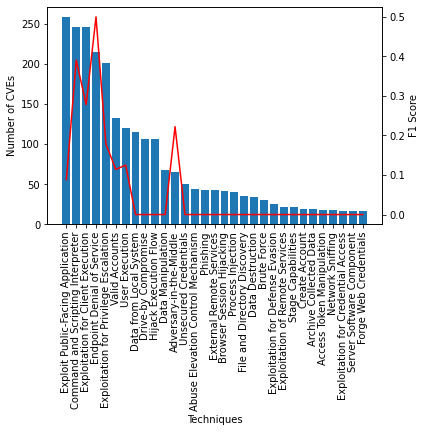

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction, y_train,  y_test.columns)

In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Adversary-in-the-Middle,Exploit Public-Facing Application,Valid Accounts,User Execution,Exploitation for Client Execution,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Drive-by Compromise,Exploitation of Remote Services,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,1.0,1.0,1.0,1.0,0.909091,0.863636,0.833333,0.653846,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,User Execution,Valid Accounts,Exploit Public-Facing Application,Exploitation of Remote Services,Stage Capabilities,...,Data Destruction,Archive Collected Data,Server Software Component,Phishing,Network Sniffing,Data Manipulation,External Remote Services,Data from Local System,Hijack Execution Flow,Forge Web Credentials
0,0.351852,0.278689,0.163934,0.125,0.1,0.066667,0.060606,0.046154,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.15331864684822488


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.5371183461347395


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.09836065573770492


In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction)

## SVC Label Power Set

In [ ]:
C_params = 2.0 ** np.array([-5, 0, 5, 10, 15, 20])

parameters = {
        
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'classifier__C': C_params,
    }


text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       lowercase = True,
                       max_df = 0.5,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', GridSearchCV(LabelPowerset(SVC()), parameters, scoring='f1_weighted')),
])

text_clf.fit(X_train['Text'], y_train.values)

Best F1 Score: 0.3043596269931809
{'classifier__C': 32.0, 'classifier__kernel': 'linear'}


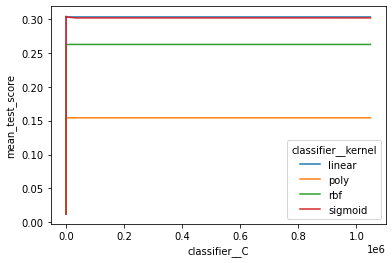

In [ ]:
print("Best F1 Score: " + str(text_clf['clf'].best_score_))
print(text_clf['clf'].best_params_)
plot_grid_search(text_clf['clf'].cv_results_,'classifier__C', 'classifier__kernel', 'mean_test_score')

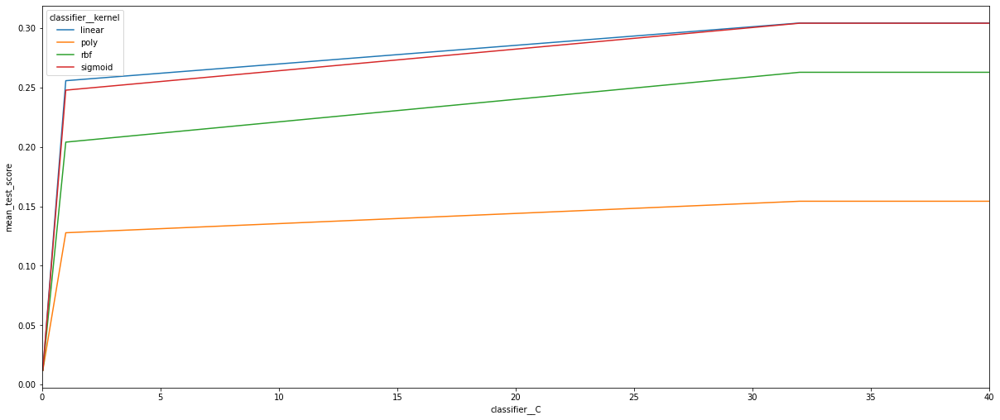

In [ ]:
plot_grid_search(text_clf['clf'].cv_results_,'classifier__C', 'classifier__kernel', 'mean_test_score', 40)
fig = plt.gcf()
fig.set_size_inches(20.5, 8.5)

In [ ]:
prediction = text_clf.predict(X_test['Text'])


In [ ]:
print(accuracy_score(y_test.values, prediction))

0.14826498422712933


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,File and Directory Discovery,Exploitation for Client Execution,Data from Local System,Exploit Public-Facing Application,Adversary-in-the-Middle,Drive-by Compromise,Access Token Manipulation,User Execution,Brute Force,Data Manipulation,Process Injection,Hijack Execution Flow,Archive Collected Data,Valid Accounts,Browser Session Hijacking,Phishing,External Remote Services,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Exploitation for Defense Evasion,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,Forge Web Credentials
0,0.647619,0.64,0.528302,0.528,0.5,0.462963,0.423077,0.421875,0.416667,0.409091,0.333333,0.311111,0.307692,0.285714,0.25,0.235294,0.222222,0.217391,0.153846,0.142857,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Unsecured Credentials,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,File and Directory Discovery,Exploit Public-Facing Application,Exploitation for Client Execution,Data from Local System,Drive-by Compromise,Adversary-in-the-Middle,Brute Force,Access Token Manipulation,User Execution,Archive Collected Data,Data Manipulation,Process Injection,Valid Accounts,Hijack Execution Flow,Browser Session Hijacking,Phishing,External Remote Services,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Exploitation for Defense Evasion,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,Forge Web Credentials
0,0.666667,0.62963,0.56,0.540984,0.444444,0.415385,0.409836,0.37931,0.333333,0.3125,0.285714,0.25,0.233333,0.2,0.176471,0.166667,0.151515,0.148148,0.090909,0.090909,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Data Manipulation,Endpoint Denial of Service,Adversary-in-the-Middle,Unsecured Credentials,Hijack Execution Flow,File and Directory Discovery,Exploitation for Client Execution,Drive-by Compromise,Command and Scripting Interpreter,Access Token Manipulation,Browser Session Hijacking,Process Injection,Exploitation for Privilege Escalation,External Remote Services,Data from Local System,User Execution,Exploit Public-Facing Application,Valid Accounts,Phishing,Brute Force,Archive Collected Data,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Exploitation for Defense Evasion,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,Forge Web Credentials
0,0.75,0.666667,0.625,0.615385,0.571429,0.571429,0.531915,0.529412,0.515625,0.5,0.5,0.5,0.5,0.5,0.478261,0.466667,0.428571,0.384615,0.333333,0.333333,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.37985595675390416


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.3475409836065574


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.467326411279644


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## SVC Label RakelD

In [ ]:
C_params = 2.0 ** np.array([-5, 0, 5, 10, 15, 20])

parameters = {
        
        'base_classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'base_classifier__C': C_params,
    }


text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       lowercase = True,
                       max_df = 0.5,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', GridSearchCV(RakelD(SVC()), parameters, scoring='f1_weighted')),
])

text_clf.fit(X_train['Text'], y_train.values)

/usr/local/lib/python3.7/dist-packages/skmultilearn/cluster/random.py:129: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  return np.array(label_sets)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.7/dist-packages/skmultilearn/cluster/random.py:129: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=o

Pipeline(steps=[('vect',
                 CountVectorizer(max_df=0.5, min_df=10,
                                 tokenizer=<function text_processing at 0x7fcfeb0d5ef0>)),
                ('tfidf', TfidfTransformer()),
                ('clf',
                 GridSearchCV(estimator=RakelD(base_classifier=SVC()),
                              param_grid={'base_classifier__C': array([3.125000e-02, 1.000000e+00, 3.200000e+01, 1.024000e+03,
       3.276800e+04, 1.048576e+06]),
                                          'base_classifier__kernel': ['linear',
                                                                      'poly',
                                                                      'rbf',
                                                                      'sigmoid']},
                              scoring='f1_weighted'))])

Best F1 Score: 0.2928565953295498
{'base_classifier__C': 32.0, 'base_classifier__kernel': 'sigmoid'}


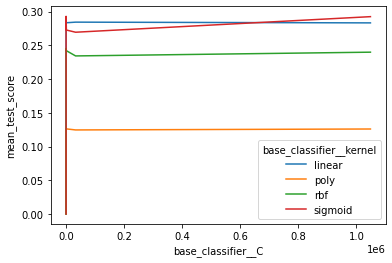

In [ ]:
print("Best F1 Score: " + str(text_clf['clf'].best_score_))
print(text_clf['clf'].best_params_)
plot_grid_search(text_clf['clf'].cv_results_,'base_classifier__C', 'base_classifier__kernel', 'mean_test_score')

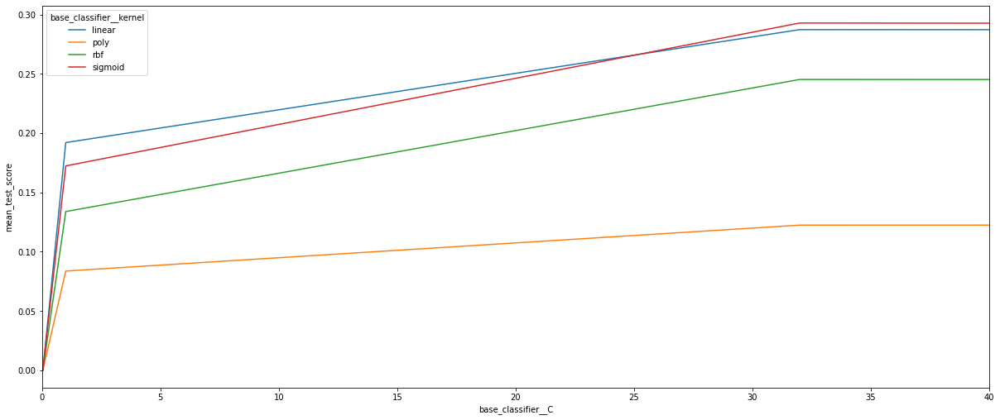

In [ ]:
plot_grid_search(text_clf['clf'].cv_results_,'base_classifier__C', 'base_classifier__kernel', 'mean_test_score', 40)
fig = plt.gcf()
fig.set_size_inches(20.5, 8.5)

In [ ]:
prediction = text_clf.predict(X_test['Text'])


In [ ]:
print(accuracy_score(y_test.values, prediction))

0.050473186119873815


In [ ]:
pd.set_option('display.max_columns', None)
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Valid Accounts,Data from Local System,Exploitation for Privilege Escalation,Drive-by Compromise,File and Directory Discovery,Exploitation for Client Execution,Adversary-in-the-Middle,Unsecured Credentials,User Execution,Exploitation for Defense Evasion,Archive Collected Data,Exploit Public-Facing Application,Server Software Component,Hijack Execution Flow,Network Sniffing,Data Manipulation,Browser Session Hijacking,Data Destruction,Process Injection,Phishing,External Remote Services,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Forge Web Credentials
0,0.718447,0.522523,0.450704,0.436364,0.424779,0.408163,0.375,0.33871,0.32,0.3,0.290323,0.285714,0.285714,0.278689,0.25,0.227273,0.2,0.176471,0.142857,0.117647,0.114286,0.1,0.074074,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Valid Accounts,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Data from Local System,Archive Collected Data,Drive-by Compromise,Exploitation for Client Execution,File and Directory Discovery,Exploitation for Defense Evasion,User Execution,Exploit Public-Facing Application,Unsecured Credentials,Network Sniffing,Adversary-in-the-Middle,Hijack Execution Flow,Browser Session Hijacking,Data Manipulation,Process Injection,Server Software Component,Data Destruction,Phishing,External Remote Services,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Forge Web Credentials
0,0.685185,0.484848,0.48,0.47541,0.413793,0.4,0.37037,0.344262,0.333333,0.333333,0.3,0.261538,0.25,0.25,0.25,0.185185,0.181818,0.176471,0.166667,0.166667,0.125,0.090909,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Endpoint Denial of Service,Command and Scripting Interpreter,Server Software Component,Data from Local System,Drive-by Compromise,Adversary-in-the-Middle,File and Directory Discovery,Valid Accounts,Exploitation for Privilege Escalation,Unsecured Credentials,Exploitation for Client Execution,Exploit Public-Facing Application,Hijack Execution Flow,User Execution,Exploitation for Defense Evasion,Archive Collected Data,Data Manipulation,Network Sniffing,Browser Session Hijacking,Data Destruction,Phishing,Process Injection,External Remote Services,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism,Create Account,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Forge Web Credentials
0,0.755102,0.58,0.5,0.461538,0.454545,0.444444,0.428571,0.421053,0.380952,0.375,0.333333,0.298246,0.294118,0.28125,0.25,0.222222,0.176471,0.166667,0.117647,0.111111,0.111111,0.086957,0.066667,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.3450655518165692


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.3377049180327869


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.36204577415151173


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


## SVC OneVsRestClassifier

In [ ]:
C_params = 2.0 ** np.array([-5, 0, 5, 10, 15, 20])

parameters = {
        
        'estimator__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'estimator__C': C_params,
    }


text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       lowercase = True,
                       max_df = 0.5,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', GridSearchCV(OneVsRestClassifier(SVC()), parameters, scoring='f1_weighted')),
])

text_clf.fit(X_train['Text'], y_train.values)

Best F1 Score: 0.2880884071545245
{'estimator__C': 1024.0, 'estimator__kernel': 'linear'}


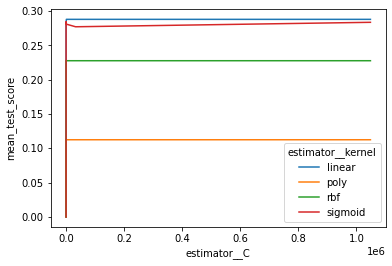

In [ ]:
print("Best F1 Score: " + str(text_clf['clf'].best_score_))
print(text_clf['clf'].best_params_)
plot_grid_search(text_clf['clf'].cv_results_,'estimator__C', 'estimator__kernel', 'mean_test_score')

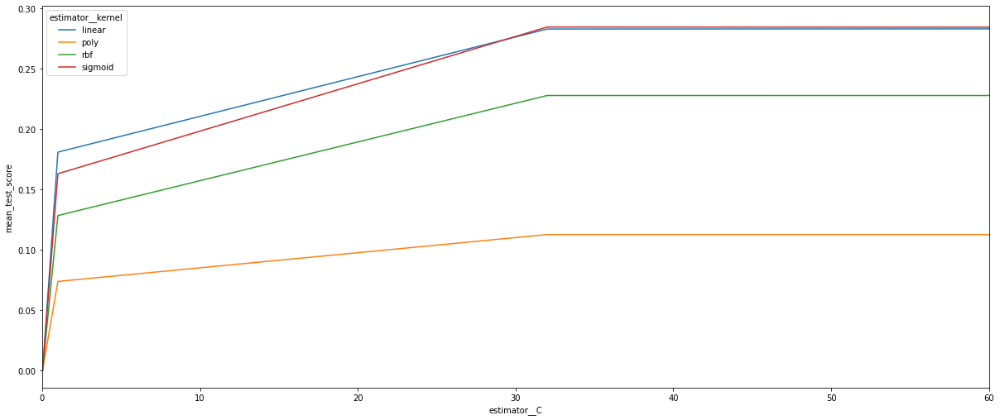

In [ ]:
plot_grid_search(text_clf['clf'].cv_results_,'estimator__C', 'estimator__kernel', 'mean_test_score', 60)
fig = plt.gcf()
fig.set_size_inches(20.5, 8.5)

In [ ]:
prediction = text_clf.predict(X_test['Text'])


In [ ]:
print(accuracy_score(y_test.values, prediction))

0.08201892744479496


In [ ]:
pd.set_option('display.max_columns', None)

print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Adversary-in-the-Middle,File and Directory Discovery,Unsecured Credentials,Exploitation for Privilege Escalation,Forge Web Credentials,Drive-by Compromise,Exploit Public-Facing Application,Valid Accounts,Data Manipulation,Exploitation for Client Execution,User Execution,Hijack Execution Flow,Phishing,Data from Local System,Browser Session Hijacking,Archive Collected Data,External Remote Services,Process Injection,Data Destruction,Brute Force,Access Token Manipulation,Exploitation for Defense Evasion,Create Account,Exploitation for Credential Access,Server Software Component,Exploitation of Remote Services,Stage Capabilities,Network Sniffing,Abuse Elevation Control Mechanism
0,0.530973,0.492063,0.451613,0.444444,0.434783,0.40678,0.4,0.4,0.397059,0.35443,0.311111,0.308824,0.295082,0.27451,0.272727,0.225806,0.222222,0.181818,0.153846,0.148148,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Privilege Escalation,File and Directory Discovery,Drive-by Compromise,Adversary-in-the-Middle,Valid Accounts,Unsecured Credentials,Exploit Public-Facing Application,Data Manipulation,Exploitation for Client Execution,User Execution,Phishing,Hijack Execution Flow,Forge Web Credentials,Data from Local System,Archive Collected Data,Browser Session Hijacking,Process Injection,External Remote Services,Data Destruction,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Exploitation for Defense Evasion,Create Account,Server Software Component,Network Sniffing,Exploitation of Remote Services,Stage Capabilities,Abuse Elevation Control Mechanism
0,0.555556,0.508197,0.48,0.444444,0.444444,0.4375,0.424242,0.416667,0.415385,0.411765,0.344262,0.3,0.272727,0.259259,0.25,0.241379,0.2,0.181818,0.166667,0.166667,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


,Forge Web Credentials,Endpoint Denial of Service,Command and Scripting Interpreter,Adversary-in-the-Middle,Unsecured Credentials,File and Directory Discovery,Exploit Public-Facing Application,Drive-by Compromise,Exploitation for Privilege Escalation,Valid Accounts,Hijack Execution Flow,User Execution,Browser Session Hijacking,Exploitation for Client Execution,Phishing,Data Manipulation,Data from Local System,Archive Collected Data,External Remote Services,Process Injection,Data Destruction,Brute Force,Access Token Manipulation,Exploitation for Defense Evasion,Create Account,Exploitation for Credential Access,Server Software Component,Exploitation of Remote Services,Stage Capabilities,Network Sniffing,Abuse Elevation Control Mechanism
0,1.0,0.508475,0.476923,0.466667,0.454545,0.444444,0.380282,0.363636,0.352941,0.304348,0.291667,0.290323,0.285714,0.28,0.272727,0.25,0.212121,0.166667,0.142857,0.133333,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.3332669643195795


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.3557377049180328


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.3197620400905669


## SVC Label BinaryRelevance

In [ ]:
C_params = 2.0 ** np.array([-5, 0, 5, 10, 15, 20])

parameters = {
        
        'classifier__kernel': ['linear', 'poly', 'rbf', 'sigmoid'],
        'classifier__C': C_params,
    }


text_clf = Pipeline([
                     ('vect', CountVectorizer(tokenizer=text_processing,
                       lowercase = True,
                       max_df = 0.5,
                       min_df = 10)),
                     ('tfidf', TfidfTransformer()),
                     ('clf', GridSearchCV(BinaryRelevance(SVC()), parameters, scoring='f1_weighted')),
])

text_clf.fit(X_train['Text'], y_train.values)

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1580: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no true nor predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, "true nor predicted", "F-score is", len(true_sum))
/usr/local/lib/python3.7/dist-pack

Pipeline(steps=[('vect',
                 CountVectorizer(max_df=0.5, min_df=10,
                                 tokenizer=<function text_processing at 0x7fcfeb0d5ef0>)),
                ('tfidf', TfidfTransformer()),
                ('clf',
                 GridSearchCV(estimator=BinaryRelevance(classifier=SVC(),
                                                        require_dense=[True,
                                                                       True]),
                              param_grid={'classifier__C': array([3.125000e-02, 1.000000e+00, 3.200000e+01, 1.024000e+03,
       3.276800e+04, 1.048576e+06]),
                                          'classifier__kernel': ['linear',
                                                                 'poly', 'rbf',
                                                                 'sigmoid']},
                              scoring='f1_weighted'))])

Best F1 Score: 0.2894592506076779
{'classifier__C': 32.0, 'classifier__kernel': 'sigmoid'}


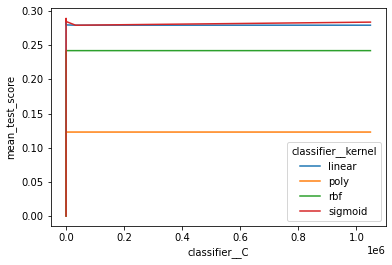

In [ ]:
print("Best F1 Score: " + str(text_clf['clf'].best_score_))
print(text_clf['clf'].best_params_)
plot_grid_search(text_clf['clf'].cv_results_,'classifier__C', 'classifier__kernel', 'mean_test_score')

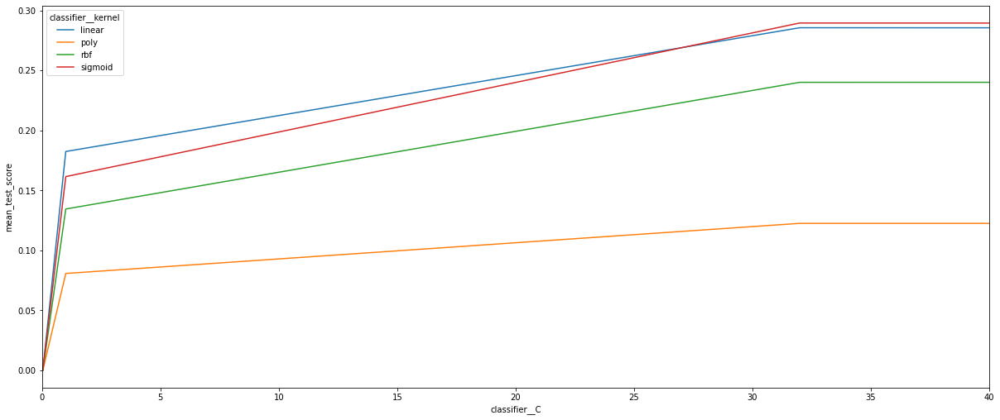

In [ ]:
plot_grid_search(text_clf['clf'].cv_results_,'classifier__C', 'classifier__kernel', 'mean_test_score', 40)
fig = plt.gcf()
fig.set_size_inches(20.5, 8.5)

In [ ]:
prediction = text_clf.predict(X_test['Text'])


In [ ]:
print(accuracy_score(y_test.values, prediction))

0.050473186119873815


In [ ]:
print("F1 Score")
compute_metrics(prediction, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Data from Local System,Drive-by Compromise,Network Sniffing,Valid Accounts,File and Directory Discovery,Data Manipulation,Server Software Component,Forge Web Credentials,Exploitation for Client Execution,Unsecured Credentials,Archive Collected Data,Exploit Public-Facing Application,User Execution,Hijack Execution Flow,Adversary-in-the-Middle,Stage Capabilities,Phishing,Browser Session Hijacking,Access Token Manipulation,Brute Force,Process Injection,Data Destruction,External Remote Services,Create Account,Exploitation for Defense Evasion,Exploitation for Credential Access,Exploitation of Remote Services,Abuse Elevation Control Mechanism
0,0.66055,0.521739,0.485437,0.40625,0.384615,0.363636,0.351351,0.333333,0.333333,0.333333,0.333333,0.321429,0.307692,0.285714,0.265625,0.254545,0.204082,0.1875,0.166667,0.153846,0.153846,0.153846,0.133333,0.114286,0.105263,0.066667,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Data Manipulation,Forge Web Credentials,Network Sniffing,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Data from Local System,File and Directory Discovery,Archive Collected Data,Valid Accounts,Drive-by Compromise,Server Software Component,Unsecured Credentials,Exploitation for Client Execution,Exploit Public-Facing Application,Access Token Manipulation,User Execution,Stage Capabilities,Adversary-in-the-Middle,Hijack Execution Flow,Phishing,Browser Session Hijacking,Process Injection,Brute Force,Data Destruction,External Remote Services,Create Account,Exploitation for Defense Evasion,Exploitation for Credential Access,Exploitation of Remote Services,Abuse Elevation Control Mechanism
0,0.666667,0.529412,0.5,0.5,0.5,0.491803,0.448276,0.444444,0.4,0.393939,0.37037,0.333333,0.333333,0.295082,0.261538,0.25,0.233333,0.2,0.1875,0.185185,0.181818,0.181818,0.166667,0.142857,0.125,0.083333,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(prediction, y_test.values, precision_score, y_test.columns, 31)

Precision Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Drive-by Compromise,Data from Local System,Exploitation for Client Execution,Server Software Component,Valid Accounts,Network Sniffing,Unsecured Credentials,User Execution,Exploit Public-Facing Application,File and Directory Discovery,Forge Web Credentials,Data Manipulation,Hijack Execution Flow,Archive Collected Data,Adversary-in-the-Middle,Stage Capabilities,Browser Session Hijacking,Phishing,Brute Force,Access Token Manipulation,Data Destruction,Process Injection,External Remote Services,Create Account,Exploitation for Defense Evasion,Exploitation of Remote Services,Exploitation for Credential Access,Abuse Elevation Control Mechanism
0,0.654545,0.555556,0.471698,0.4,0.371429,0.352941,0.333333,0.317073,0.285714,0.285714,0.28,0.269841,0.266667,0.25,0.243243,0.227273,0.222222,0.1875,0.142857,0.133333,0.133333,0.125,0.111111,0.090909,0.086957,0.055556,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction, average='weighted'))

0.33754602789899174


In [ ]:
print(recall_score(y_test.values, prediction, average='weighted'))

0.34918032786885245


In [ ]:
print(precision_score(y_test.values, prediction, average='weighted'))

0.33456017410753286


# CNN + Word2Vec


## Imports


In [ ]:
import spacy
nlp = spacy.load('en_core_web_sm')

In [ ]:
!pip install -U scikit-learn
!pip install tensorflow-addons

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.1 MB 5.1 MB/s 


In [ ]:
import numpy as np # linear algebra
from sklearn.metrics import multilabel_confusion_matrix
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from tqdm import tqdm
from sklearn.model_selection import train_test_split
import tensorflow as tf
from keras.models import Sequential
from keras.layers.recurrent import LSTM, GRU,SimpleRNN
from keras.layers.core import Dense, Activation, Dropout
from keras.layers.embeddings import Embedding
from tensorflow.keras.layers import BatchNormalization
from keras.utils import np_utils
from sklearn import preprocessing, decomposition, model_selection, metrics, pipeline
from keras.layers import GlobalMaxPooling1D, Conv1D, MaxPooling1D, Flatten, Bidirectional, SpatialDropout1D
from keras.preprocessing import sequence, text
from keras.callbacks import EarlyStopping
from tensorflow.keras.metrics import BinaryAccuracy

import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
from plotly import graph_objs as go
import plotly.express as ex
import plotly.figure_factory as ff
pd.set_option('display.max_columns', None)

In [ ]:
import keras.backend as K
from keras.layers import Dense, Input, LSTM, SimpleRNN, Embedding, Dropout, SpatialDropout1D, Activation, Conv1D,GRU
from keras.layers import Conv1D, Bidirectional, GlobalMaxPool1D, MaxPooling1D, BatchNormalization, Add, Flatten
from keras.layers import GlobalMaxPooling1D, GlobalAveragePooling1D, concatenate, SpatialDropout1D
from tensorflow.keras.optimizers import Adam
from keras.utils.vis_utils import plot_model

## Import the data

In [ ]:
X_train = pd.read_csv('X_train.csv')
y_train = pd.read_csv('y_train.csv')
X_train_extended = pd.read_csv('final_extended_X_train.csv')
y_train_extended = pd.read_csv('final_extended_y_train.csv')
X_test = pd.read_csv('X_test.csv')
y_test = pd.read_csv('y_test.csv')

## Format Data

In [ ]:
import re,string

def strip_links(text):
    link_regex    = re.compile('((https?):((//)|(\\\\))+([\w\d:#@%/;$()~_?\+-=\\\.&](#!)?)*)', re.DOTALL)
    links         = re.findall(link_regex, text)
    for link in links:
        text = text.replace(link[0], ', ')    
    return text

In [ ]:
X_train['Text']=X_train['Text'].apply(lambda x:strip_links(x))
X_train_extended['Text']=X_train_extended['Text'].apply(lambda x:strip_links(x))
X_test['Text']=X_test['Text'].apply(lambda x:strip_links(x))

In [ ]:
X_train['Text']=X_train['Text'].str.replace("\n",' ')
X_train_extended['Text']=X_train_extended['Text'].str.replace("\n",' ')
X_test['Text']=X_test['Text'].str.replace("\n",' ')

In [ ]:
def remove_punctuations(text):
    for punctuation in string.punctuation:
        text = text.replace(punctuation, '')
    return text

# Apply to the DF series
X_train['Text'] = X_train['Text'].apply(remove_punctuations)
X_train_extended['Text'] = X_train_extended['Text'].apply(remove_punctuations)
X_test['Text'] = X_test['Text'].apply(remove_punctuations)

text_lines = list()
lines = X_train['Text'].values.tolist()

for line in lines:
    doc = nlp(line)
    tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and token.is_alpha]

    text_lines.append(tokens)


text_lines_extended = list()
lines_extended = X_train_extended['Text'].values.tolist()

for line in lines_extended:
    doc = nlp(line)
    tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and token.is_alpha]

    text_lines_extended.append(tokens)


In [ ]:
print(X_train['Text'].apply(lambda x:len(str(x).split())).max())
print(X_train_extended['Text'].apply(lambda x:len(str(x).split())).max())

522
522


In [ ]:
max_features = 5000
maxlen = 500

In [ ]:
token=tf.keras.preprocessing.text.Tokenizer(num_words=max_features)
token.fit_on_texts(text_lines)

token_extended=tf.keras.preprocessing.text.Tokenizer(num_words=max_features)
token_extended.fit_on_texts(text_lines_extended)

In [ ]:
X_train_seq=token.texts_to_sequences(X_train['Text'])
X_train__extended_seq=token.texts_to_sequences(X_train_extended['Text'])

X_test_seq=token.texts_to_sequences(X_test['Text'])

In [ ]:
from keras_preprocessing.sequence import pad_sequences
X_train_pad = pad_sequences(X_train_seq, maxlen=maxlen)
X_train__extended_pad = pad_sequences(X_train__extended_seq, maxlen=maxlen)

X_test_pad = pad_sequences(X_test_seq, maxlen=maxlen)

In [ ]:
word_index = token.word_index
word_extended_index = token_extended.word_index

In [ ]:
print(len(token.word_index))
print(len(token_extended.word_index))




4742
6332


In [ ]:
from gensim.models import Word2Vec, KeyedVectors
# Load pretrained Glove model (in word2vec form)
word2vec_model = KeyedVectors.load_word2vec_format("vulner_embedding.bin", binary=True)
word2vec_extended_model = KeyedVectors.load_word2vec_format("vulner_embedding.bin", binary=True)

In [ ]:
embedding_vector_length = 150

In [ ]:
embedding_matrix = np.zeros((max_features + 1, embedding_vector_length))
embedding_extended_matrix = np.zeros((max_features + 1, embedding_vector_length))

print(embedding_matrix.shape)

(5001, 150)


In [ ]:
for word, i in sorted(token.word_index.items(),key=lambda x:x[1]):
    if i >= (max_features+1):
        break
    if word in word2vec_model:
        embedding_vector = word2vec_model[word]
    embedding_matrix[i] = embedding_vector
    
for word, i in sorted(token_extended.word_index.items(),key=lambda x:x[1]):
    if i >= (max_features+1):
        break
    if word in word2vec_extended_model:
        embedding_extended_vector = word2vec_extended_model[word]
    embedding_extended_matrix[i] = embedding_extended_vector
    

## Auxiliary Functions

In [ ]:
def round_prediction(prediction):
  rounded = []
  for line in prediction:
    new_line = np.round(line)
    rounded.append(new_line)
  return rounded

In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [ ]:
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
config = tf.compat.v1.ConfigProto( device_count = {'GPU': 1 , 'CPU': 56} ) 
sess = tf.compat.v1.Session(config=config) 
K.set_session(sess)

Num GPUs Available:  1


## Define Metrics

In [ ]:
#Import necessary libraries
4# demonstration of calculating metrics for a neural network model using sklearn
from sklearn.datasets import make_circles
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import confusion_matrix


def accuracy(y_true, y_pred):
    '''Calculates the precision, a metric for multi-label classification of
    how many selected items are relevant.
    '''
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def precision(y_true, y_pred):
    '''Calculates the precision, a metric for multi-label classification of
    how many selected items are relevant.
    '''
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision


def recall(y_true, y_pred):
    '''Calculates the recall, a metric for multi-label classification of
    how many relevant items are selected.
    '''
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

  #Customized the evaluation to analyse the model in terms of accuracy and mean value accuracy
def mean_pred(y_true, y_pred):
    return K.mean(y_pred)

def f1(y_true, y_pred):
  y_pred = K.round(y_pred)
  tp = K.sum(K.cast(y_true*y_pred, 'float'), axis=0)
  tn = K.sum(K.cast((1-y_true)*(1-y_pred), 'float'), axis=0)
  fp = K.sum(K.cast((1-y_true)*y_pred, 'float'), axis=0)
  fn = K.sum(K.cast(y_true*(1-y_pred), 'float'), axis=0)

  p = tp / (tp + fp + K.epsilon())
  r = tp / (tp + fn + K.epsilon())

  f1 = 2*p*r / (p+r+K.epsilon())
  #f1 = tf.where(tf.is_nan(f1), tf.zeros_like(f1), f1)
  return K.mean(f1)

def fbeta_score(y_true, y_pred, beta=1):
    '''Calculates the F score, the weighted harmonic mean of precision and recall.
    This is useful for multi-label classification, where input samples can be
    classified as sets of labels. By only using accuracy (precision) a model
    would achieve a perfect score by simply assigning every class to every
    input. In order to avoid this, a metric should penalize incorrect class
    assignments as well (recall). The F-beta score (ranged from 0.0 to 1.0)
    computes this, as a weighted mean of the proportion of correct class
    assignments vs. the proportion of incorrect class assignments.
    With beta = 1, this is equivalent to a F-measure. With beta < 1, assigning
    correct classes becomes more important, and with beta > 1 the metric is
    instead weighted towards penalizing incorrect class assignments.
    '''
    if beta < 0:
        raise ValueError('The lowest choosable beta is zero (only precision).')
        
    # If there are no true positives, fix the F score at 0 like sklearn.
    if K.sum(K.round(K.clip(y_true, 0, 1))) == 0:
        return 0

    p = precision(y_true, y_pred)
    r = recall(y_true, y_pred)
    bb = beta ** 2
    fbeta_score = (1 + bb) * (p * r) / (bb * p + r + K.epsilon())
    return fbeta_score

def auroc(y_true, y_pred):
    auc = tf.metrics.auc(y_true, y_pred)[1]
    K.get_session().run(tf.local_variables_initializer())
    return auc


def fmeasure(y_true, y_pred):
    '''Calculates the f-measure, the harmonic mean of precision and recall.
    '''
    return fbeta_score(y_true, y_pred, beta=1)


fscore = f1score = fmeasure

## CNN

In [ ]:
def Custom_Hamming_Loss(y_true, y_pred):
    return K.mean(y_true*(1-y_pred)+(1-y_true)*y_pred)

#Customized the evaluation to analyse the model in terms of accuracy and mean value accuracy
def mean_pred(y_true, y_pred):
    return K.mean(y_pred)


CNN_Word2Vec_model = Sequential([
    Embedding(input_dim =embedding_matrix.shape[0], 
              input_length=maxlen, 
              output_dim=embedding_matrix.shape[1],
              weights=[embedding_matrix], 
              trainable=False),
    SpatialDropout1D(0.5),
    # ... 100 filters with a kernel size of 4 so that each convolution will consider a window of 4 word embeddings
    Conv1D(filters=100, kernel_size=4, padding='same', activation='relu'),
    #**batch normalization layer** normalizes the activations of the previous layer at each batch, 
    #i.e. applies a transformation that maintains the mean activation close to 0 and the activation standard deviation close to 1. 
    #It will be added after the activation function between a convolutional and a max-pooling layer.
    BatchNormalization(),
    GlobalMaxPool1D(),
    Dense(31, activation = 'sigmoid')
])


In [ ]:
trial = Sequential([
    Embedding(input_dim =embedding_matrix.shape[0], 
              input_length=maxlen, 
              output_dim=embedding_matrix.shape[1],
              weights=[embedding_matrix], 
              trainable=False),
    SpatialDropout1D(0.5),
    # ... 100 filters with a kernel size of 4 so that each convolution will consider a window of 4 word embeddings
    Conv1D(filters=100, kernel_size=4, padding='same', activation='relu'),
    #**batch normalization layer** normalizes the activations of the previous layer at each batch, 
    #i.e. applies a transformation that maintains the mean activation close to 0 and the activation standard deviation close to 1. 
    #It will be added after the activation function between a convolutional and a max-pooling layer.
    BatchNormalization(),
    GlobalMaxPool1D(),
   
    Dense(31, activation = 'sigmoid')
])
trial.compile(loss='binary_crossentropy', 
                           optimizer=Adam(), 
                           metrics=['accuracy', f1])
trial.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 embedding (Embedding)       (None, 500, 150)          750150    
                                                                 
 spatial_dropout1d (SpatialD  (None, 500, 150)         0         
 ropout1D)                                                       
                                                                 
 conv1d (Conv1D)             (None, 500, 100)          60100     
                                                                 
 batch_normalization (BatchN  (None, 500, 100)         400       
 ormalization)                                                   
                                                                 
 global_max_pooling1d (Globa  (None, 100)              0         
 lMaxPooling1D)                                                  
                                                        

In [ ]:
CNN_Word2Vec_model.compile(loss='binary_crossentropy', 
                           optimizer=Adam(), 
                           metrics=['accuracy', f1])
history = CNN_Word2Vec_model.fit(X_train_pad,
                    y_train.values,
                    epochs=100,
                    batch_size=64,          
                    validation_data=(X_test_pad, y_test.values))


Epoch 1/100
22/22 [==============================] - 1s 26ms/step - loss: 1.3620 - accuracy: 0.0341 - f1: 0.0507 - val_loss: 0.5602 - val_accuracy: 0.0158 - val_f1: 0.0393
Epoch 2/100
22/22 [==============================] - 0s 12ms/step - loss: 0.3685 - accuracy: 0.0972 - f1: 0.0383 - val_loss: 0.4509 - val_accuracy: 0.0158 - val_f1: 0.0314
Epoch 3/100
22/22 [==============================] - 0s 12ms/step - loss: 0.2858 - accuracy: 0.1142 - f1: 0.0423 - val_loss: 0.4018 - val_accuracy: 0.0347 - val_f1: 0.0330
Epoch 4/100
22/22 [==============================] - 0s 11ms/step - loss: 0.2450 - accuracy: 0.1395 - f1: 0.0564 - val_loss: 0.3619 - val_accuracy: 0.0536 - val_f1: 0.0368
Epoch 5/100
22/22 [==============================] - 0s 11ms/step - loss: 0.2245 - accuracy: 0.1684 - f1: 0.0552 - val_loss: 0.3302 - val_accuracy: 0.0662 - val_f1: 0.0369
Epoch 6/100
22/22 [==============================] - 0s 11ms/step - loss: 0.2124 - accuracy: 0.1677 - f1: 0.0554 - val_loss: 0.3056 - val_ac

In [ ]:
prediction = CNN_Word2Vec_model.predict(X_test_pad)
prediction_rounded = round_prediction(prediction)

In [ ]:
print(accuracy_score(y_test.values, prediction_rounded))

0.14511041009463724


In [ ]:
print("F1 Score")
compute_metrics(prediction_rounded, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,File and Directory Discovery,Archive Collected Data,Command and Scripting Interpreter,Drive-by Compromise,Exploitation for Client Execution,Adversary-in-the-Middle,User Execution,Stage Capabilities,Exploit Public-Facing Application,Data from Local System,Forge Web Credentials,Valid Accounts,Hijack Execution Flow,Unsecured Credentials,Data Manipulation,Data Destruction,Phishing,Browser Session Hijacking,Create Account,Exploitation of Remote Services,Process Injection,Exploitation for Defense Evasion,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Server Software Component,Network Sniffing,External Remote Services,Abuse Elevation Control Mechanism
0,0.772277,0.648148,0.631579,0.571429,0.569106,0.541667,0.513761,0.428571,0.382979,0.333333,0.326087,0.32,0.285714,0.272727,0.238095,0.222222,0.181818,0.153846,0.142857,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(prediction_rounded, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,File and Directory Discovery,Command and Scripting Interpreter,Drive-by Compromise,Exploitation for Client Execution,Archive Collected Data,Adversary-in-the-Middle,User Execution,Data from Local System,Forge Web Credentials,Exploit Public-Facing Application,Stage Capabilities,Hijack Execution Flow,Valid Accounts,Unsecured Credentials,Data Destruction,Data Manipulation,Browser Session Hijacking,Phishing,Create Account,Exploitation of Remote Services,Process Injection,Exploitation for Defense Evasion,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Server Software Component,Network Sniffing,External Remote Services,Abuse Elevation Control Mechanism
0,0.722222,0.7,0.666667,0.57377,0.481481,0.459016,0.4,0.375,0.3,0.275862,0.25,0.230769,0.2,0.185185,0.181818,0.166667,0.125,0.117647,0.090909,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(prediction_rounded, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Archive Collected Data,Stage Capabilities,Endpoint Denial of Service,Drive-by Compromise,Exploitation for Privilege Escalation,File and Directory Discovery,Exploitation for Client Execution,Command and Scripting Interpreter,Exploit Public-Facing Application,Valid Accounts,User Execution,Adversary-in-the-Middle,Data Manipulation,Data from Local System,Phishing,Unsecured Credentials,Hijack Execution Flow,Forge Web Credentials,Data Destruction,Browser Session Hijacking,Exploitation of Remote Services,Create Account,Process Injection,Exploitation for Defense Evasion,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Server Software Component,Network Sniffing,External Remote Services,Abuse Elevation Control Mechanism
0,1.0,1.0,0.829787,0.619048,0.603448,0.6,0.583333,0.564516,0.555556,0.545455,0.529412,0.5,0.4,0.380952,0.333333,0.333333,0.333333,0.333333,0.2,0.2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, prediction_rounded, average='weighted'))

0.3939781201880394


In [ ]:
print(recall_score(y_test.values, prediction_rounded, average='weighted'))

0.3540983606557377


In [ ]:
print(precision_score(y_test.values, prediction_rounded, average='weighted'))

0.4832050990981881


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


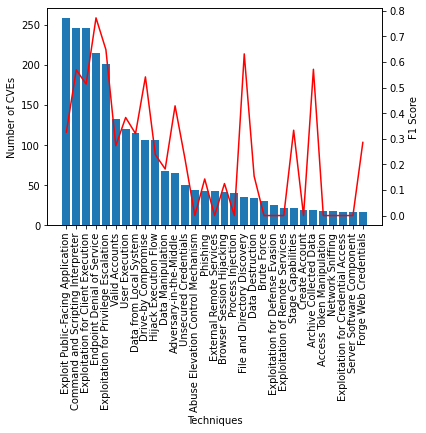

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction_rounded, y_train,  y_test.columns)

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, prediction_rounded)

Process Injection


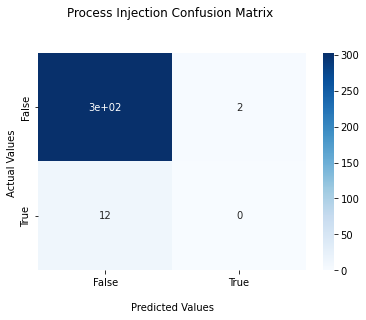

Access Token Manipulation


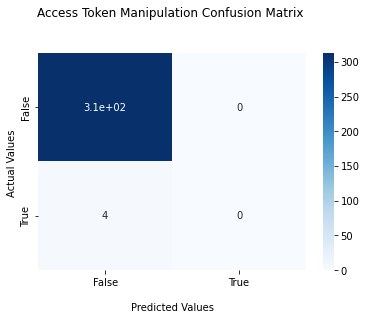

Hijack Execution Flow


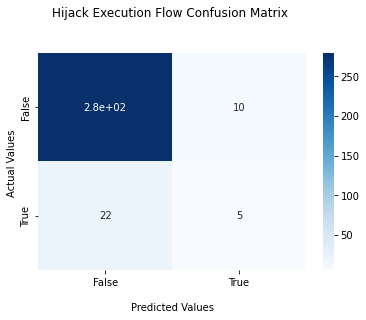

Data from Local System


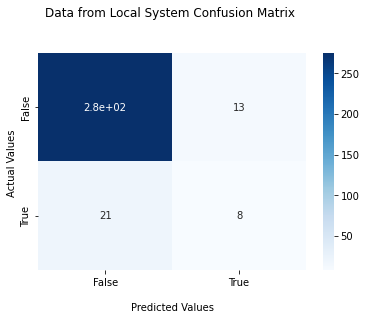

External Remote Services


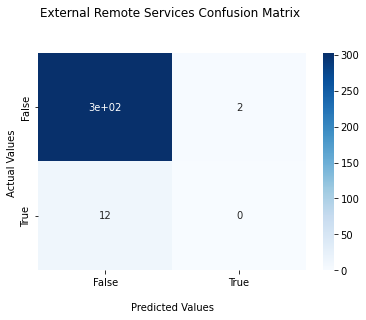

Data Manipulation


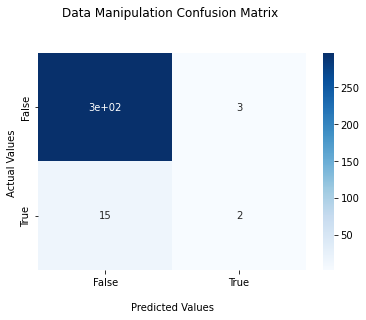

Network Sniffing


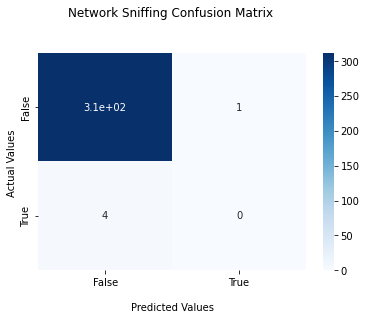

Exploitation for Privilege Escalation


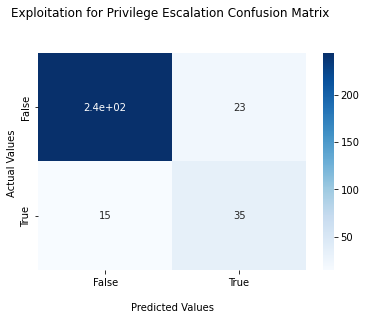

Command and Scripting Interpreter


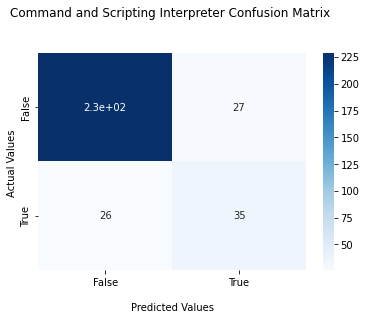

Phishing


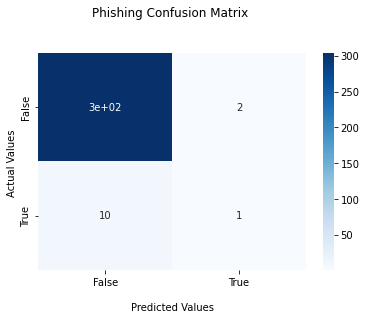

Server Software Component


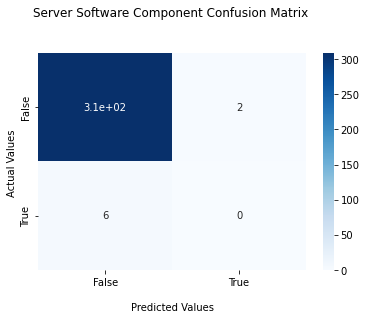

Archive Collected Data


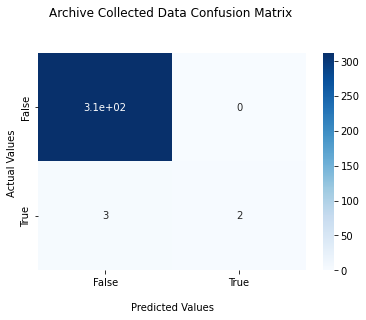

Data Destruction


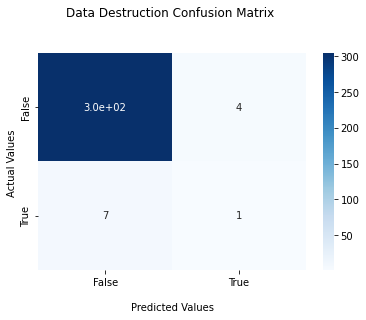

Browser Session Hijacking


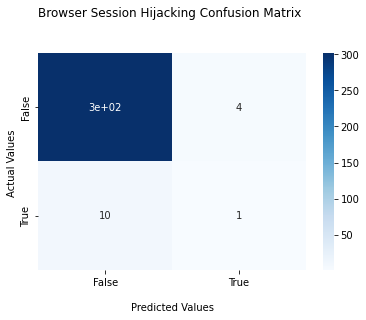

Exploitation for Credential Access


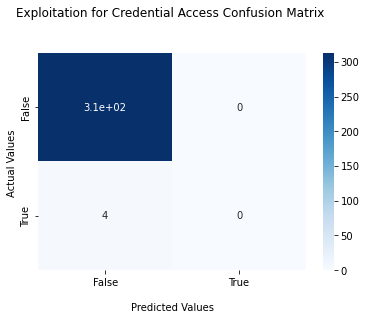

Abuse Elevation Control Mechanism


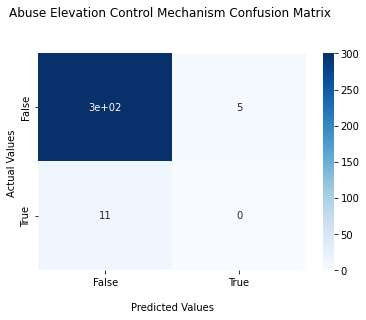

Adversary-in-the-Middle


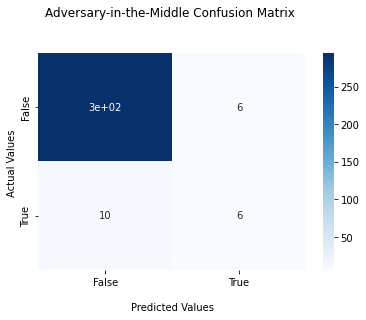

User Execution


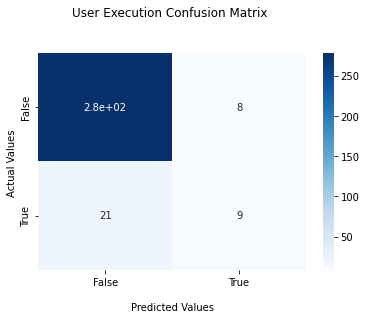

Unsecured Credentials


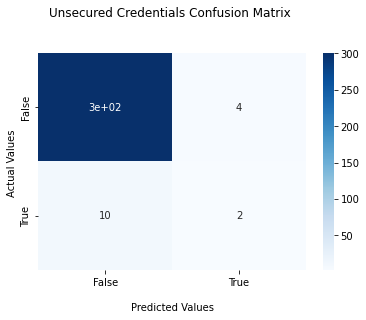

Brute Force


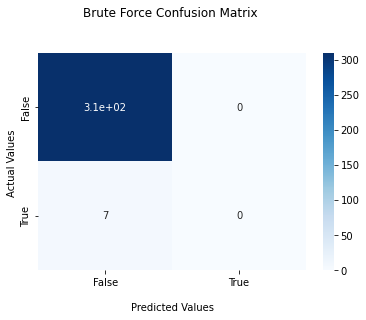

File and Directory Discovery


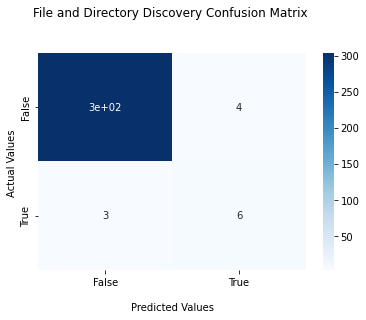

Valid Accounts


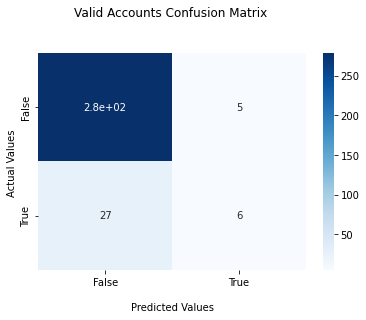

Exploitation for Defense Evasion


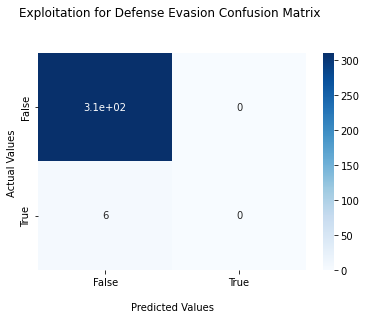

Create Account


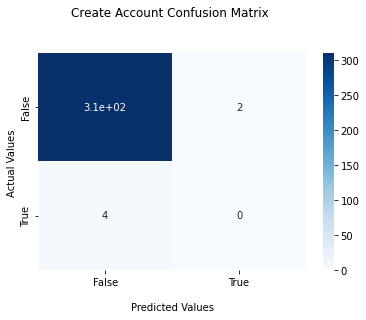

Endpoint Denial of Service


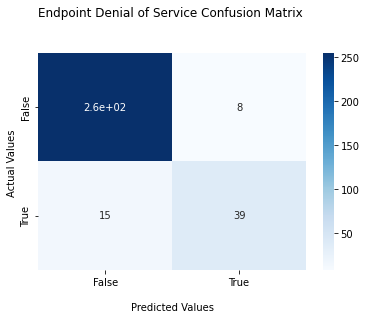

Drive-by Compromise


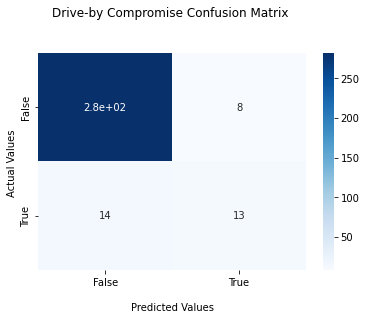

Exploitation for Client Execution


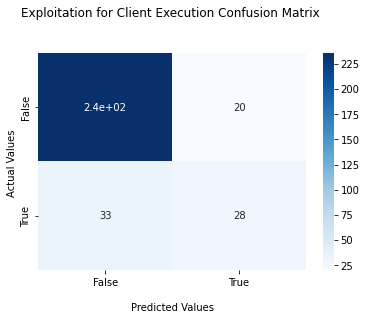

Exploitation of Remote Services


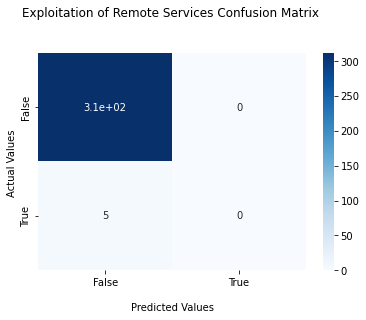

Stage Capabilities


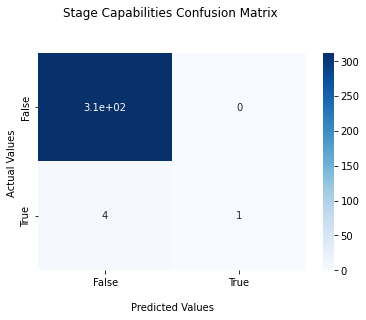

Exploit Public-Facing Application


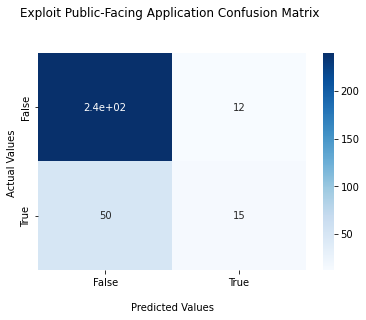

Forge Web Credentials


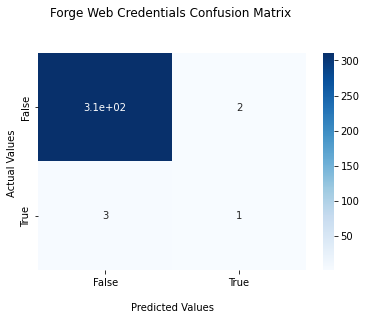

In [ ]:
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

## CNN Extended

In [ ]:
CNN_Word2Vec_extended_model = Sequential([
    Embedding(input_dim =embedding_matrix.shape[0], 
              input_length=maxlen, 
              output_dim=embedding_matrix.shape[1],
              weights=[embedding_matrix], 
              trainable=False),
    SpatialDropout1D(0.5),
    # ... 100 filters with a kernel size of 4 so that each convolution will consider a window of 4 word embeddings
    Conv1D(filters=100, kernel_size=4, padding='same', activation='relu'),
    #**batch normalization layer** normalizes the activations of the previous layer at each batch, 
    #i.e. applies a transformation that maintains the mean activation close to 0 and the activation standard deviation close to 1. 
    #It will be added after the activation function between a convolutional and a max-pooling layer.
    BatchNormalization(),
    GlobalMaxPool1D(),
   
    Dense(31, activation = 'sigmoid')
])


In [ ]:
CNN_Word2Vec_extended_model.compile(loss='binary_crossentropy', 
                           optimizer=Adam(), 
                           metrics=['accuracy', f1])
history_extended = CNN_Word2Vec_extended_model.fit(X_train__extended_pad,
                    y_train_extended.values,
                    epochs=100,
                    batch_size=64,          
                    validation_data=(X_test_pad, y_test.values))


Epoch 1/100
57/57 [==============================] - 17s 275ms/step - loss: 0.6038 - accuracy: 0.0543 - f1: 0.0332 - val_loss: 0.4419 - val_accuracy: 0.0158 - val_f1: 0.0300
Epoch 2/100
57/57 [==============================] - 15s 270ms/step - loss: 0.1970 - accuracy: 0.1496 - f1: 0.0689 - val_loss: 0.3511 - val_accuracy: 0.0473 - val_f1: 0.0258
Epoch 3/100
57/57 [==============================] - 15s 268ms/step - loss: 0.1628 - accuracy: 0.2400 - f1: 0.0882 - val_loss: 0.2935 - val_accuracy: 0.0631 - val_f1: 0.0352
Epoch 4/100
57/57 [==============================] - 15s 269ms/step - loss: 0.1474 - accuracy: 0.3112 - f1: 0.1255 - val_loss: 0.2447 - val_accuracy: 0.0852 - val_f1: 0.0503
Epoch 5/100
57/57 [==============================] - 16s 290ms/step - loss: 0.1371 - accuracy: 0.3799 - f1: 0.1563 - val_loss: 0.2190 - val_accuracy: 0.1230 - val_f1: 0.0591
Epoch 6/100
57/57 [==============================] - 15s 270ms/step - loss: 0.1283 - accuracy: 0.4467 - f1: 0.2005 - val_loss: 0.2

In [ ]:
prediction_extended = CNN_Word2Vec_extended_model.predict(X_test_pad)
prediction_extended_rounded = round_prediction(prediction_extended)

In [ ]:
print(accuracy_score(y_test.values, prediction_extended_rounded))

0.13249211356466878


In [ ]:
print("F1 Score")
compute_metrics(prediction_extended_rounded, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Brute Force,Stage Capabilities,Archive Collected Data,Drive-by Compromise,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Adversary-in-the-Middle,Unsecured Credentials,Exploitation for Client Execution,File and Directory Discovery,User Execution,Data Manipulation,Exploit Public-Facing Application,Data from Local System,Valid Accounts,Hijack Execution Flow,Server Software Component,Phishing,Browser Session Hijacking
0,0.73913,0.6,0.571429,0.571429,0.566667,0.551724,0.504348,0.482759,0.48,0.477876,0.470588,0.44,0.413793,0.40678,0.387097,0.339623,0.324324,0.25,0.142857,0.117647


In [ ]:
print("Recall Score")
compute_metrics(prediction_extended_rounded, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Endpoint Denial of Service,Drive-by Compromise,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,File and Directory Discovery,Exploitation for Client Execution,Adversary-in-the-Middle,Brute Force,Data from Local System,Archive Collected Data,Stage Capabilities,Exploit Public-Facing Application,User Execution,Data Manipulation,Server Software Component,Valid Accounts,Hijack Execution Flow,Browser Session Hijacking,Phishing
0,0.62963,0.62963,0.5,0.48,0.47541,0.444444,0.442623,0.4375,0.428571,0.413793,0.4,0.4,0.369231,0.366667,0.352941,0.333333,0.272727,0.222222,0.090909,0.090909


In [ ]:
print("Precision Score")
compute_metrics(prediction_extended_rounded, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Archive Collected Data,Stage Capabilities,Brute Force,Endpoint Denial of Service,Exploitation for Privilege Escalation,Hijack Execution Flow,User Execution,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,Drive-by Compromise,File and Directory Discovery,Data Manipulation,Unsecured Credentials,Exploit Public-Facing Application,Valid Accounts,Data from Local System,Phishing,Server Software Component,Browser Session Hijacking
0,1.0,1.0,1.0,0.894737,0.648649,0.6,0.55,0.538462,0.537037,0.519231,0.515152,0.5,0.5,0.461538,0.45283,0.45,0.363636,0.333333,0.2,0.166667


In [ ]:
print(f1_score(y_test.values, prediction_extended_rounded, average='weighted'))

0.41593820077247257


In [ ]:
print(recall_score(y_test.values, prediction_extended_rounded, average='weighted'))

In [ ]:
print(precision_score(y_test.values, prediction_extended_rounded, average='weighted'))

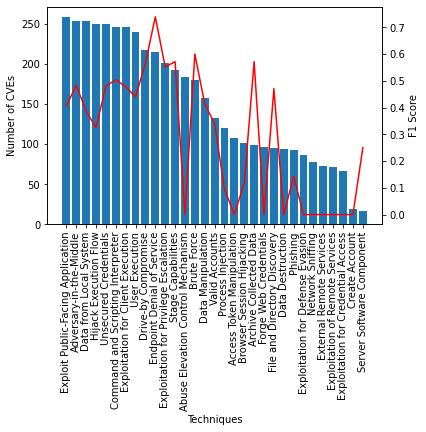

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction_extended_rounded, y_train_extended,  y_test.columns)

In [ ]:
conf_matrix_extended = multilabel_confusion_matrix(y_test.values, prediction_extended_rounded)

Process Injection


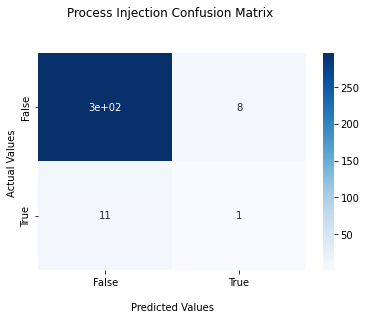

Access Token Manipulation


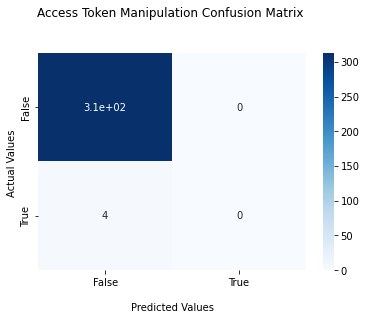

Hijack Execution Flow


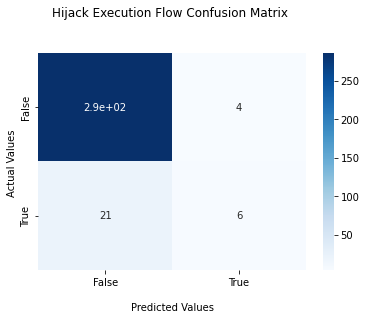

Data from Local System


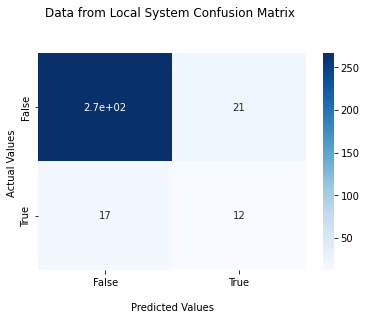

External Remote Services


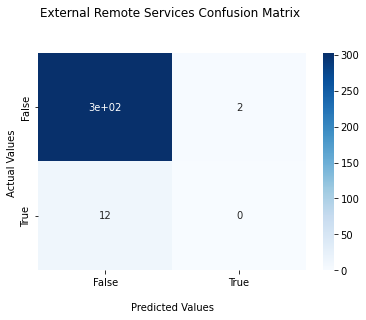

Data Manipulation


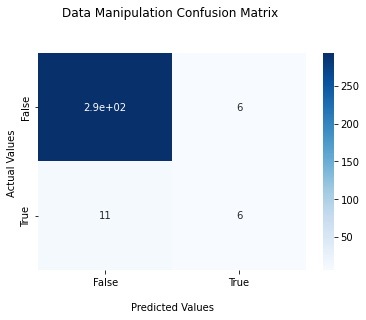

Network Sniffing


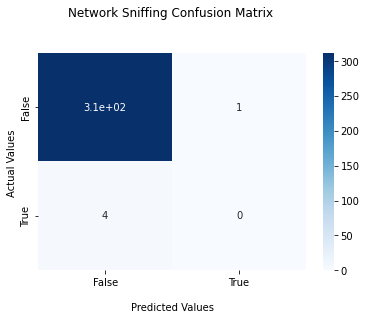

Exploitation for Privilege Escalation


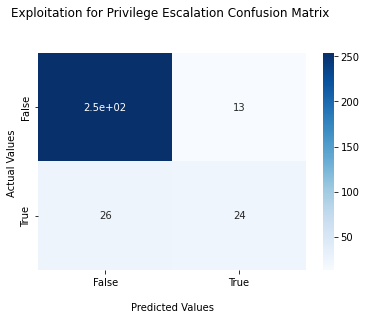

Command and Scripting Interpreter


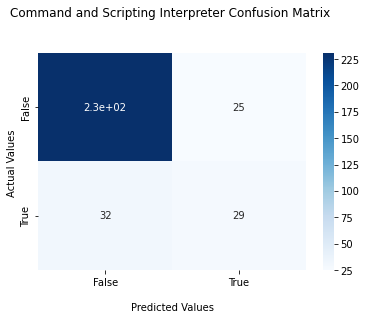

Phishing


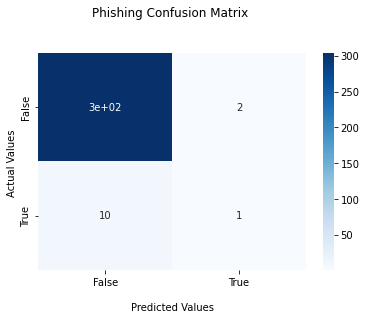

Server Software Component


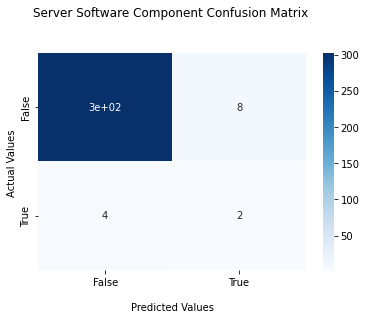

Archive Collected Data


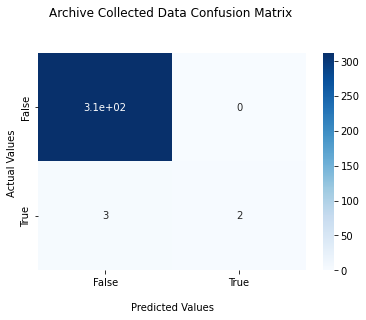

Data Destruction


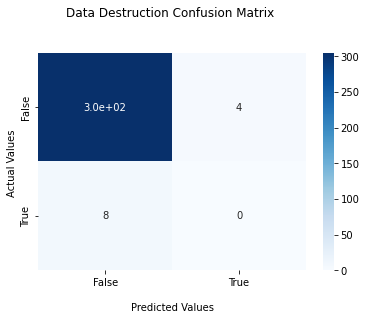

Browser Session Hijacking


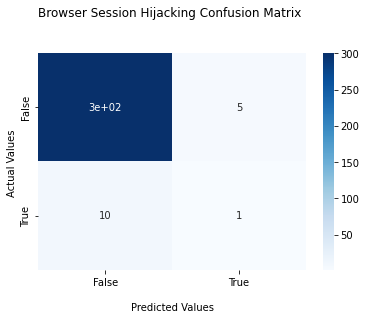

Exploitation for Credential Access


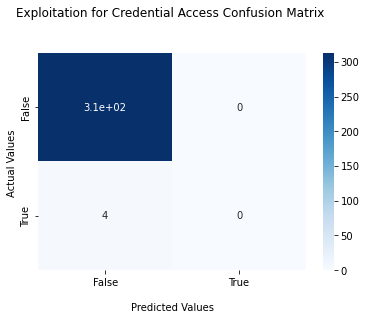

Abuse Elevation Control Mechanism


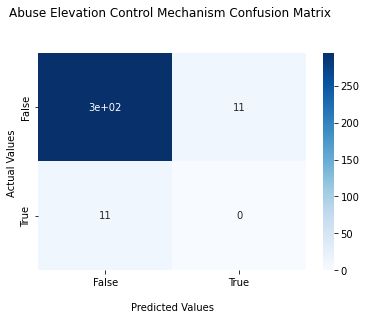

Adversary-in-the-Middle


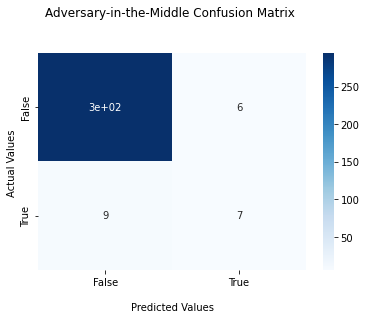

User Execution


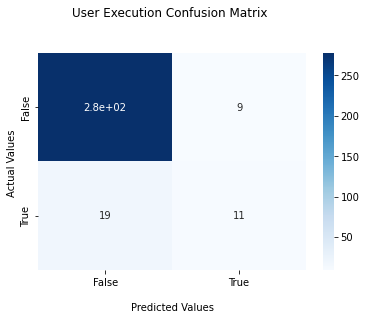

Unsecured Credentials


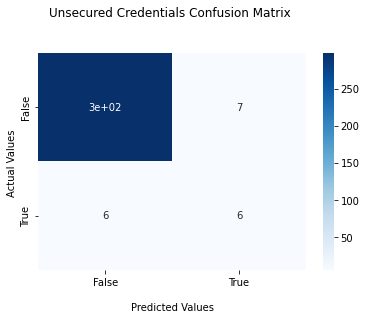

Brute Force


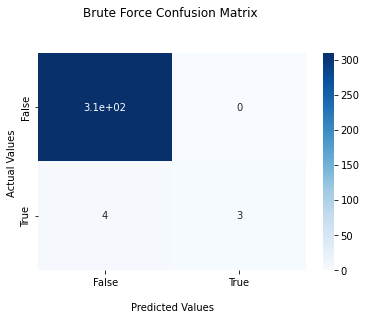

File and Directory Discovery


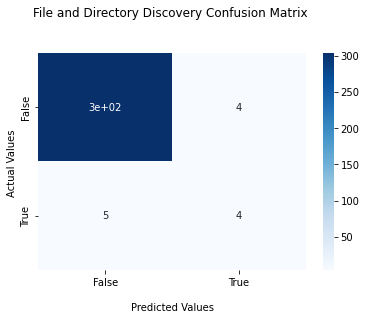

Valid Accounts


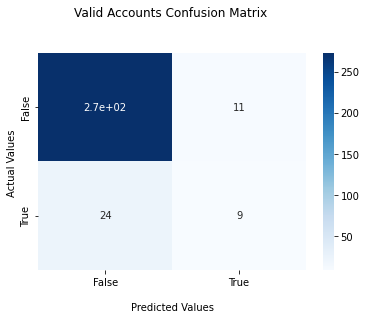

Exploitation for Defense Evasion


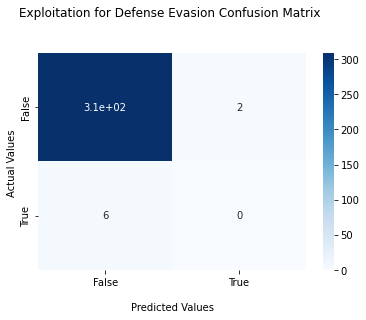

Create Account


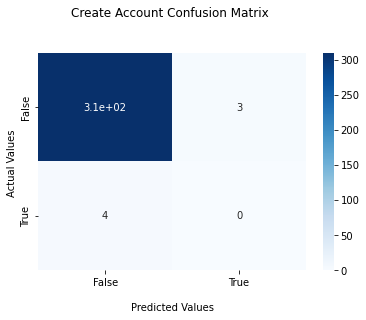

Endpoint Denial of Service


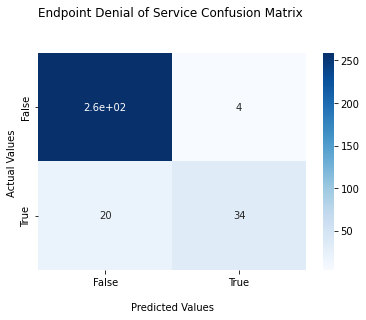

Drive-by Compromise


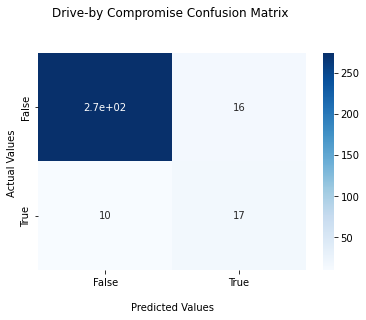

Exploitation for Client Execution


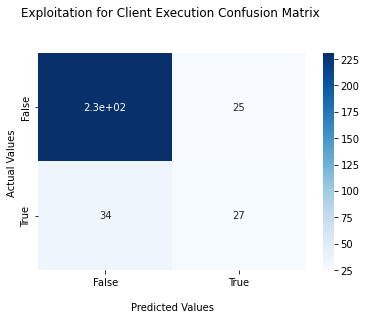

Exploitation of Remote Services


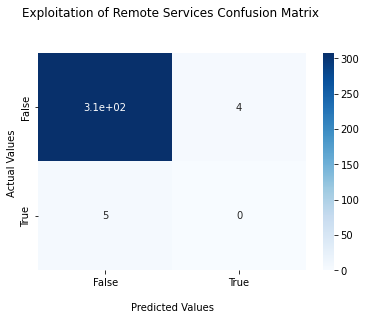

Stage Capabilities


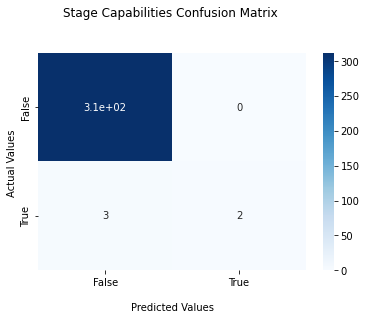

Exploit Public-Facing Application


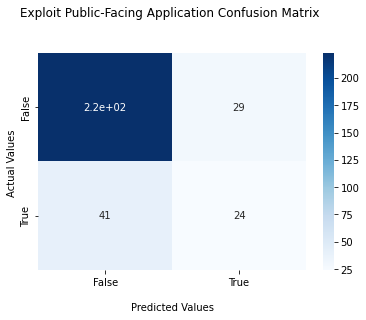

Forge Web Credentials


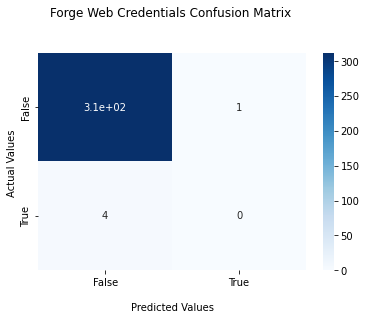

In [ ]:
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix_extended[i], y_test.columns[i])

# 

In [ ]:
CNN_Word2Vec_extended_model = Sequential([
    Embedding(input_dim =embedding_matrix.shape[0], 
              input_length=maxlen, 
              output_dim=embedding_matrix.shape[1],
              weights=[embedding_matrix], 
              trainable=False),
    SpatialDropout1D(0.5),
    # ... 100 filters with a kernel size of 4 so that each convolution will consider a window of 4 word embeddings
    Conv1D(filters=100, kernel_size=4, padding='same', activation='relu'),
    #**batch normalization layer** normalizes the activations of the previous layer at each batch, 
    #i.e. applies a transformation that maintains the mean activation close to 0 and the activation standard deviation close to 1. 
    #It will be added after the activation function between a convolutional and a max-pooling layer.
    BatchNormalization(),
    GlobalMaxPool1D(),
   
    Dense(31, activation = 'sigmoid')
])


In [ ]:
CNN_Word2Vec_extended_model.compile(loss='binary_crossentropy', 
                           optimizer=Adam(), 
                           metrics=['accuracy', f1])
history_extended = CNN_Word2Vec_extended_model.fit(X_train__extended_pad,
                    y_train_extended.values,
                    epochs=100,
                    batch_size=64,          
                    validation_data=(X_test_pad, y_test.values))


Epoch 1/100
57/57 [==============================] - 17s 275ms/step - loss: 0.6038 - accuracy: 0.0543 - f1: 0.0332 - val_loss: 0.4419 - val_accuracy: 0.0158 - val_f1: 0.0300
Epoch 2/100
57/57 [==============================] - 15s 270ms/step - loss: 0.1970 - accuracy: 0.1496 - f1: 0.0689 - val_loss: 0.3511 - val_accuracy: 0.0473 - val_f1: 0.0258
Epoch 3/100
57/57 [==============================] - 15s 268ms/step - loss: 0.1628 - accuracy: 0.2400 - f1: 0.0882 - val_loss: 0.2935 - val_accuracy: 0.0631 - val_f1: 0.0352
Epoch 4/100
57/57 [==============================] - 15s 269ms/step - loss: 0.1474 - accuracy: 0.3112 - f1: 0.1255 - val_loss: 0.2447 - val_accuracy: 0.0852 - val_f1: 0.0503
Epoch 5/100
57/57 [==============================] - 16s 290ms/step - loss: 0.1371 - accuracy: 0.3799 - f1: 0.1563 - val_loss: 0.2190 - val_accuracy: 0.1230 - val_f1: 0.0591
Epoch 6/100
57/57 [==============================] - 15s 270ms/step - loss: 0.1283 - accuracy: 0.4467 - f1: 0.2005 - val_loss: 0.2

In [ ]:
prediction_extended = CNN_Word2Vec_extended_model.predict(X_test_pad)
prediction_extended_rounded = round_prediction(prediction_extended)

In [ ]:
print(accuracy_score(y_test.values, prediction_extended_rounded))

0.13249211356466878


In [ ]:
print("F1 Score")
compute_metrics(prediction_extended_rounded, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Brute Force,Stage Capabilities,Archive Collected Data,Drive-by Compromise,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Adversary-in-the-Middle,Unsecured Credentials,Exploitation for Client Execution,File and Directory Discovery,User Execution,Data Manipulation,Exploit Public-Facing Application,Data from Local System,Valid Accounts,Hijack Execution Flow,Server Software Component,Phishing,Browser Session Hijacking
0,0.73913,0.6,0.571429,0.571429,0.566667,0.551724,0.504348,0.482759,0.48,0.477876,0.470588,0.44,0.413793,0.40678,0.387097,0.339623,0.324324,0.25,0.142857,0.117647


In [ ]:
print("Recall Score")
compute_metrics(prediction_extended_rounded, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Endpoint Denial of Service,Drive-by Compromise,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,File and Directory Discovery,Exploitation for Client Execution,Adversary-in-the-Middle,Brute Force,Data from Local System,Archive Collected Data,Stage Capabilities,Exploit Public-Facing Application,User Execution,Data Manipulation,Server Software Component,Valid Accounts,Hijack Execution Flow,Browser Session Hijacking,Phishing
0,0.62963,0.62963,0.5,0.48,0.47541,0.444444,0.442623,0.4375,0.428571,0.413793,0.4,0.4,0.369231,0.366667,0.352941,0.333333,0.272727,0.222222,0.090909,0.090909


In [ ]:
print("Precision Score")
compute_metrics(prediction_extended_rounded, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Archive Collected Data,Stage Capabilities,Brute Force,Endpoint Denial of Service,Exploitation for Privilege Escalation,Hijack Execution Flow,User Execution,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,Drive-by Compromise,File and Directory Discovery,Data Manipulation,Unsecured Credentials,Exploit Public-Facing Application,Valid Accounts,Data from Local System,Phishing,Server Software Component,Browser Session Hijacking
0,1.0,1.0,1.0,0.894737,0.648649,0.6,0.55,0.538462,0.537037,0.519231,0.515152,0.5,0.5,0.461538,0.45283,0.45,0.363636,0.333333,0.2,0.166667


In [ ]:
print(f1_score(y_test.values, prediction_extended_rounded, average='weighted'))

0.41593820077247257


In [ ]:
print(recall_score(y_test.values, prediction_extended_rounded, average='weighted'))

In [ ]:
print(precision_score(y_test.values, prediction_extended_rounded, average='weighted'))

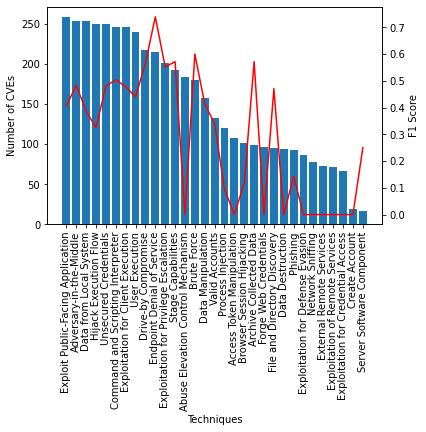

In [ ]:
print_F1_based_on_distribution(y_test.values, prediction_extended_rounded, y_train_extended,  y_test.columns)

In [ ]:
conf_matrix_extended = multilabel_confusion_matrix(y_test.values, prediction_extended_rounded)

Process Injection


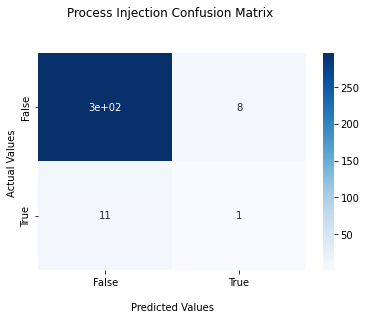

Access Token Manipulation


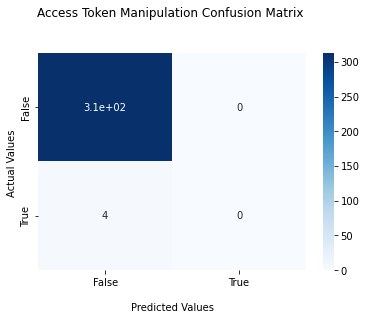

Hijack Execution Flow


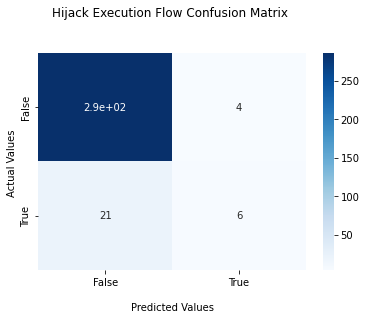

Data from Local System


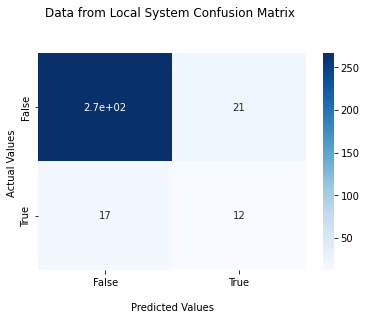

External Remote Services


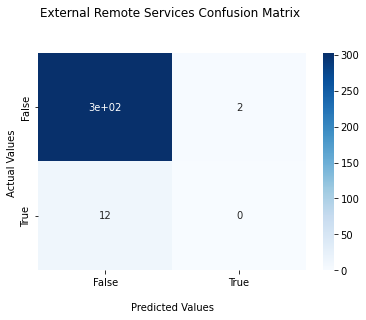

Data Manipulation


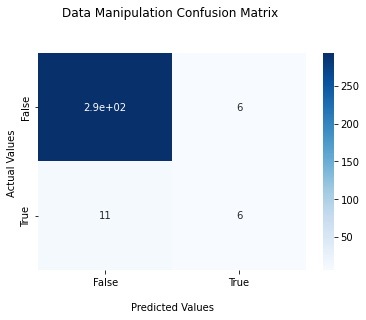

Network Sniffing


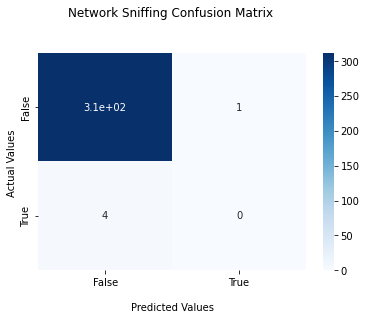

Exploitation for Privilege Escalation


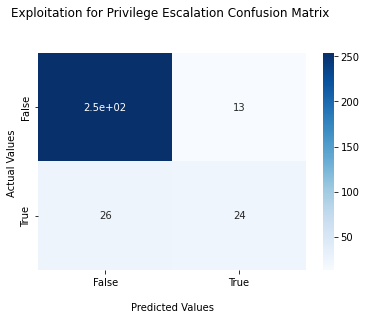

Command and Scripting Interpreter


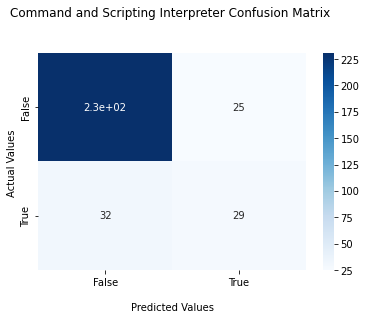

Phishing


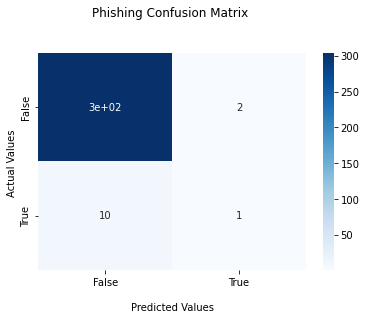

Server Software Component


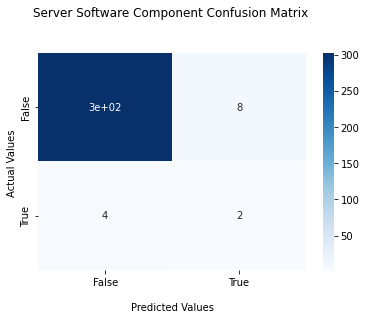

Archive Collected Data


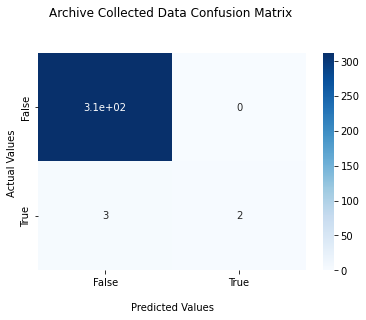

Data Destruction


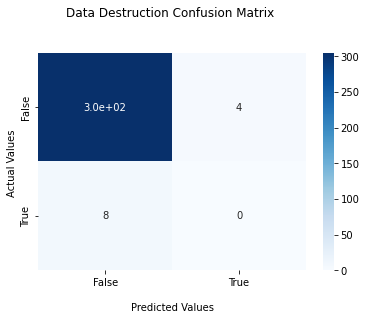

Browser Session Hijacking


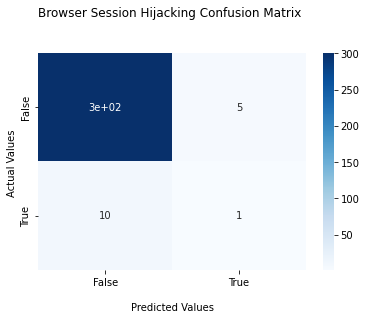

Exploitation for Credential Access


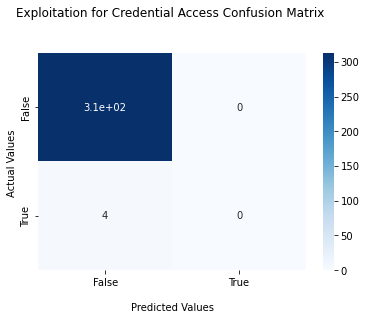

Abuse Elevation Control Mechanism


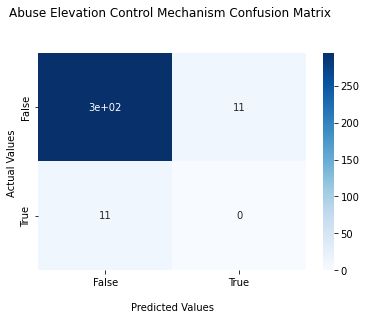

Adversary-in-the-Middle


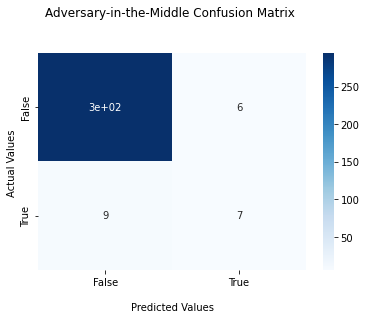

User Execution


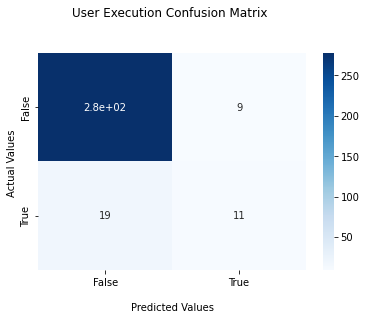

Unsecured Credentials


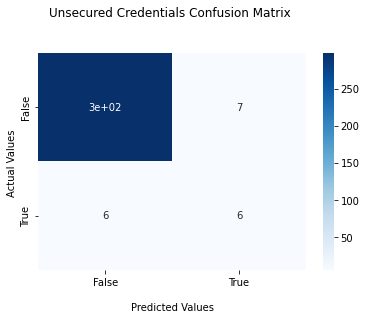

Brute Force


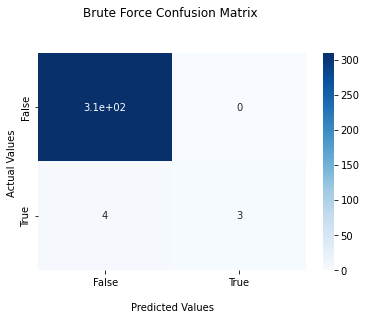

File and Directory Discovery


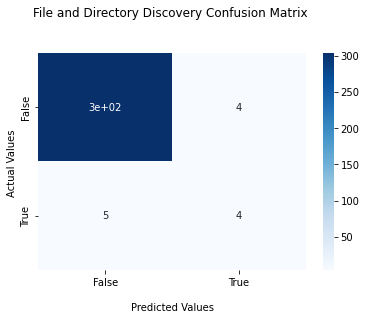

Valid Accounts


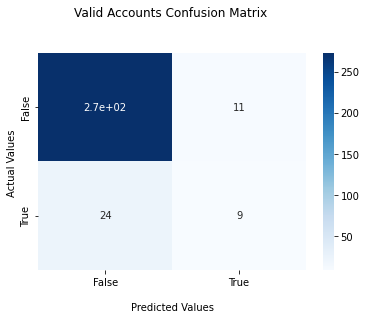

Exploitation for Defense Evasion


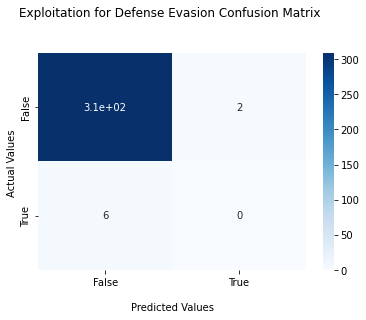

Create Account


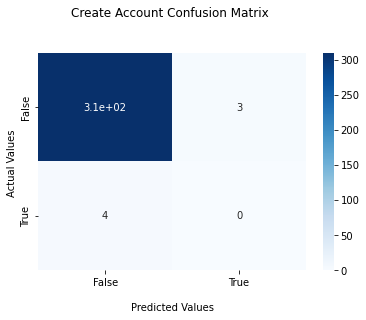

Endpoint Denial of Service


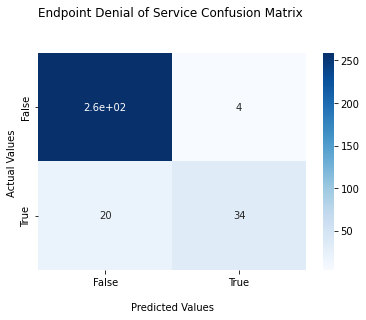

Drive-by Compromise


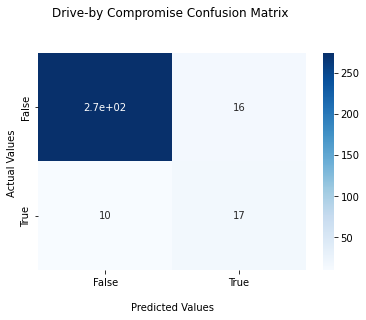

Exploitation for Client Execution


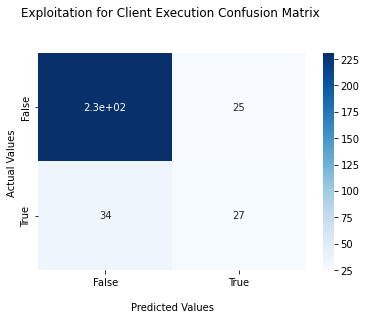

Exploitation of Remote Services


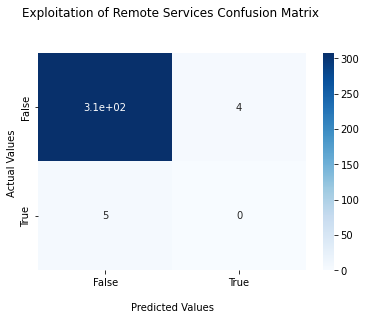

Stage Capabilities


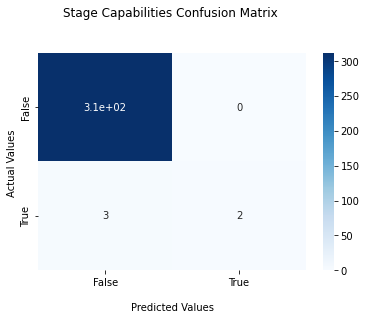

Exploit Public-Facing Application


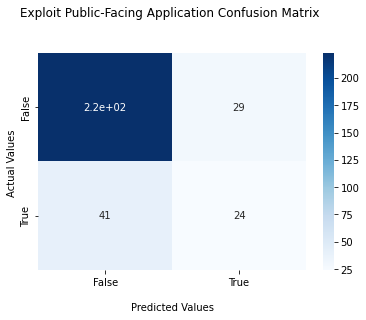

Forge Web Credentials


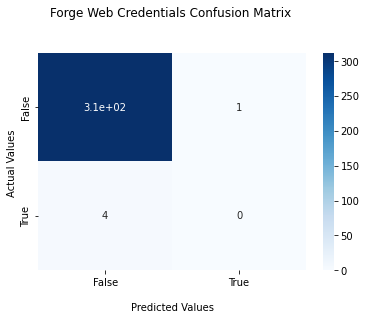

In [ ]:
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix_extended[i], y_test.columns[i])

# Multi-Output BERT

## Imports


In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
#######################################
### -------- Load libraries ------- ###

# Load Huggingface transformers
from transformers import TFBertModel,  BertConfig, BertTokenizerFast
import seaborn as sns

# Then what you need from tensorflow.keras
from tensorflow.keras.layers import Input, Dropout, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.initializers import TruncatedNormal
from tensorflow.keras.losses import CategoricalCrossentropy, BinaryCrossentropy
from tensorflow.keras.metrics import CategoricalAccuracy, BinaryAccuracy
from tensorflow.keras.utils import to_categorical

# And pandas for data import + sklearn because you allways need sklearn
import pandas as pd
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
from sklearn.metrics import f1_score, recall_score, precision_score, accuracy_score, multilabel_confusion_matrix


## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train, y_train) = load_data_from_file('X_train.csv', 'y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')
(X_train_extended, y_train_extended) = load_data_from_file('final_extended_X_train.csv', 'final_extended_y_train.csv')



## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

In [ ]:
pd.set_option('display.max_columns', None)

## Train

In [ ]:
#######################################
### --------- Setup BERT ---------- ###

# Name of the BERT model to use
model_name = 'bert-base-uncased'

# Max length of tokens
max_length = 350

# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)

# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)






Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/511M [00:00<?, ?B/s]

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [ ]:
#######################################
### ------- Build the model ------- ###

# TF Keras documentation: https://www.tensorflow.org/api_docs/python/tf/keras/Model

# Load the MainLayer
bert = transformer_model.layers[0]

# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
# attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
# inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}
inputs = {'input_ids': input_ids}

# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(inputs)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

# Then build your model output
outputs = {}
for col in y_train.columns:
    col_name = col.replace(' ', '')
    new_layer = Dense(units=2, kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name=col_name)(pooled_output)
    outputs[col] = new_layer

# And combine it all in a model object
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel')

# Take a look at the model
model.summary()






Model: "BERT_MultiLabel"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_ids (InputLayer)         [(None, 350)]        0           []                               
                                                                                                  
 bert (TFBertMainLayer)         TFBaseModelOutputWi  109482240   ['input_ids[0][0]']              
                                thPoolingAndCrossAt                                               
                                tentions(last_hidde                                               
                                n_state=(None, 350,                                               
                                 768),                                                            
                                 pooler_output=(Non                                 

In [ ]:
#######################################
### ------- Train the model ------- ###

# Set an optimizer
optimizer = Adam(
    learning_rate=6e-05,
    epsilon=1e-07,
    decay=0.01,
    clipnorm=1.0)

# Set loss and metrics
loss = {}
metric = {}
for col in y_train.columns:
    loss[col] = CategoricalCrossentropy(from_logits = True)
    metric[col] = CategoricalAccuracy ('accuracy')

# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

y = {}
for col in y_train.columns:
    y[col] = to_categorical(y_train[col].values)

# Tokenize the input (takes some time)
x = tokenizer(
    text=X_train['Text'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

# Fit the model
history = model.fit(
    # x={'input_ids': x['input_ids'], 'attention_mask': x['attention_mask']},
    x={'input_ids': x['input_ids']},
    y=y,
    validation_split=0.2,
    batch_size=16,
    epochs=50)




Epoch 1/50
68/68 [==============================] - 88s 893ms/step - loss: 8.1777 - AbuseElevationControlMechanism_loss: 0.2537 - AccessTokenManipulation_loss: 0.1596 - Adversary-in-the-Middle_loss: 0.1851 - ArchiveCollectedData_loss: 0.1398 - BrowserSessionHijacking_loss: 0.2272 - BruteForce_loss: 0.1866 - CommandandScriptingInterpreter_loss: 0.4839 - CreateAccount_loss: 0.1336 - DataDestruction_loss: 0.2065 - DataManipulation_loss: 0.2588 - DatafromLocalSystem_loss: 0.3198 - Drive-byCompromise_loss: 0.3416 - EndpointDenialofService_loss: 0.4710 - ExploitPublic-FacingApplication_loss: 0.5338 - ExploitationforClientExecution_loss: 0.5055 - ExploitationforCredentialAccess_loss: 0.1875 - ExploitationforDefenseEvasion_loss: 0.1490 - ExploitationforPrivilegeEscalation_loss: 0.4812 - ExploitationofRemoteServices_loss: 0.1967 - ExternalRemoteServices_loss: 0.2303 - FileandDirectoryDiscovery_loss: 0.1998 - ForgeWebCredentials_loss: 0.1485 - HijackExecutionFlow_loss: 0.2892 - NetworkSniffing_l

In [ ]:
#######################################
### ----- Evaluate the model ------ ###

import numpy as np
test_x = tokenizer(
    text=X_test['Text'].to_list(),
    add_special_tokens=True,
    pad_to_max_length=True,
    max_length=max_length,
    truncation=True,
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

# Run evaluation
model_eval = model.predict(
    x={'input_ids':test_x['input_ids']},
)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
predicted_y = pd.DataFrame(columns=y_train.columns)
for col in model_eval:
  result = []
  for el in model_eval[col]:
    if el[0] > el[1]:
      result.append(0)
    else:
      result.append(1)
  predicted_y[col] = result

## Test

In [ ]:
print(accuracy_score(y_test.values, predicted_y))

0.10094637223974763


In [ ]:
print("F1 Score")
compute_metrics(predicted_y, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Drive-by Compromise,Data from Local System,Exploit Public-Facing Application,Exploitation for Client Execution,Adversary-in-the-Middle,Valid Accounts,Data Manipulation,Browser Session Hijacking,Hijack Execution Flow,User Execution,Phishing,Unsecured Credentials,Process Injection,Exploitation of Remote Services,Create Account,Stage Capabilities,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,File and Directory Discovery,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.679612,0.632653,0.520325,0.510638,0.423077,0.40367,0.390805,0.380952,0.37931,0.307692,0.3,0.228571,0.210526,0.166667,0.125,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(predicted_y, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Drive-by Compromise,Data from Local System,Exploit Public-Facing Application,Valid Accounts,Exploitation for Client Execution,Browser Session Hijacking,Adversary-in-the-Middle,Data Manipulation,Hijack Execution Flow,User Execution,Phishing,Unsecured Credentials,Process Injection,Exploitation of Remote Services,Create Account,Stage Capabilities,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,File and Directory Discovery,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.648148,0.62,0.52459,0.444444,0.37931,0.338462,0.333333,0.278689,0.272727,0.25,0.235294,0.148148,0.133333,0.090909,0.083333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(predicted_y, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Phishing,Adversary-in-the-Middle,Endpoint Denial of Service,Exploitation for Client Execution,Exploitation for Privilege Escalation,Drive-by Compromise,Command and Scripting Interpreter,Hijack Execution Flow,Exploit Public-Facing Application,User Execution,Data from Local System,Data Manipulation,Valid Accounts,Browser Session Hijacking,Unsecured Credentials,Process Injection,Exploitation of Remote Services,Create Account,Stage Capabilities,Exploitation for Defense Evasion,Abuse Elevation Control Mechanism,File and Directory Discovery,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,1.0,0.8,0.714286,0.653846,0.645833,0.6,0.516129,0.5,0.5,0.5,0.478261,0.444444,0.44,0.333333,0.25,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, predicted_y, average='weighted'))

0.3592940935265929


In [ ]:
print(recall_score(y_test.values, predicted_y, average='weighted'))

0.31475409836065577


In [ ]:
print(precision_score(y_test.values, predicted_y, average='weighted'))

0.4685956869345346


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


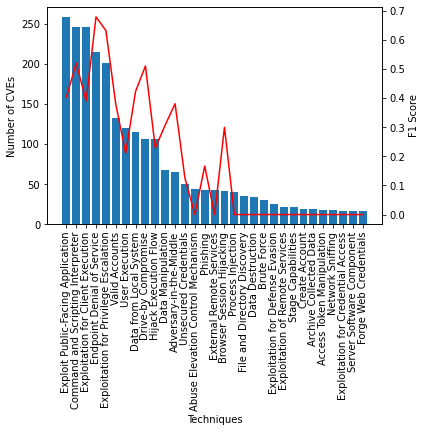

In [ ]:
print_F1_based_on_distribution(y_test.values, predicted_y, y_train,  y_test.columns)

Process Injection


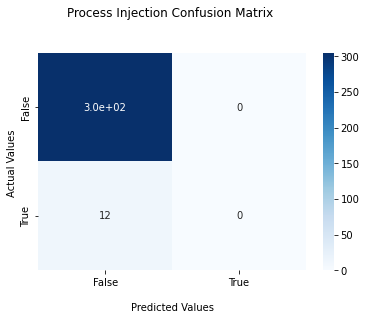

Access Token Manipulation


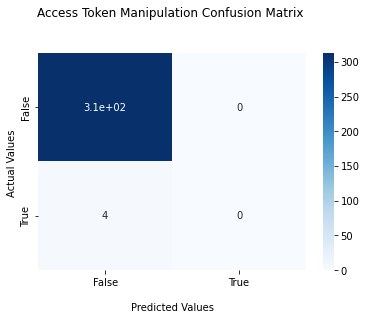

Hijack Execution Flow


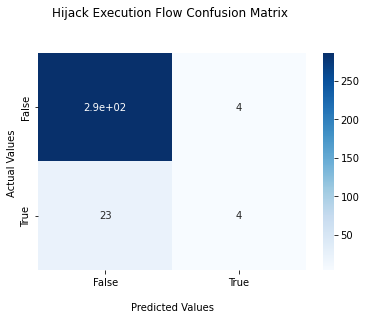

Data from Local System


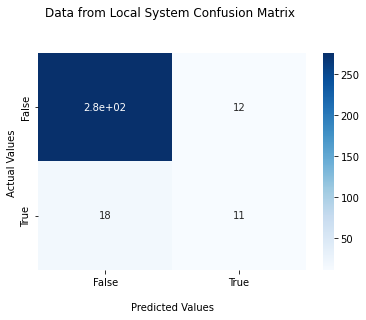

External Remote Services


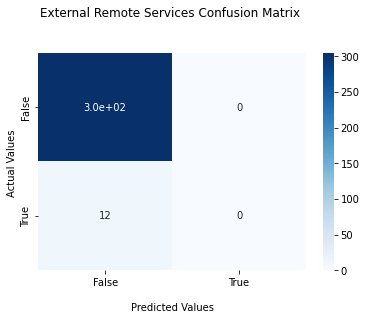

Data Manipulation


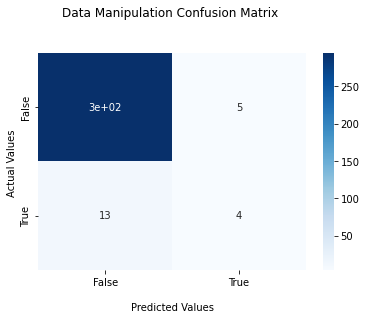

Network Sniffing


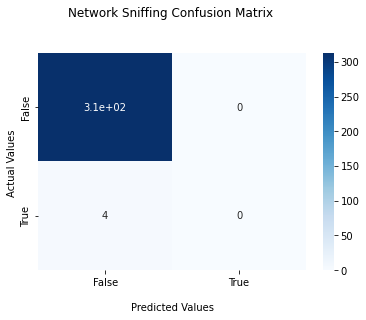

Exploitation for Privilege Escalation


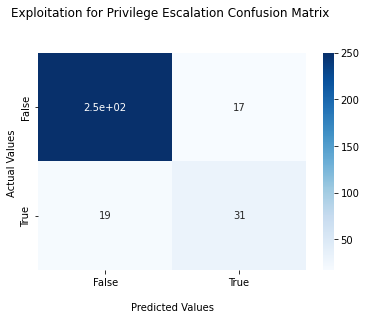

Command and Scripting Interpreter


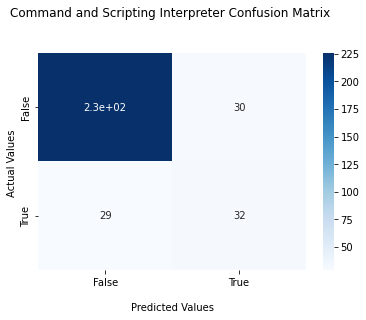

Phishing


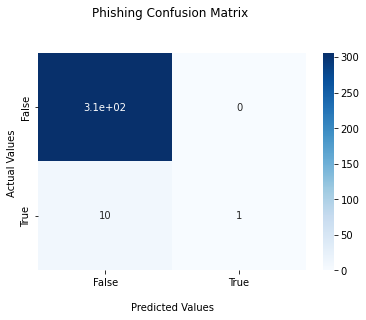

Server Software Component


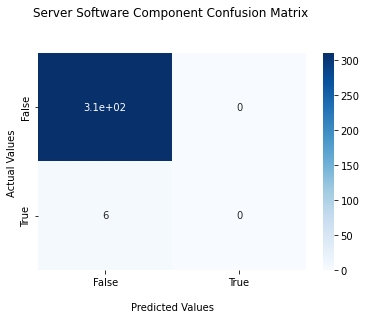

Archive Collected Data


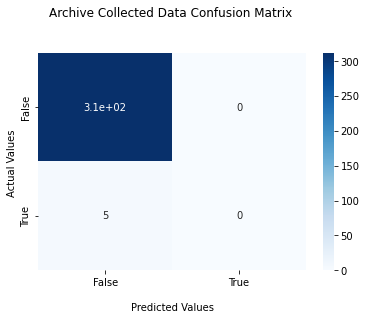

Data Destruction


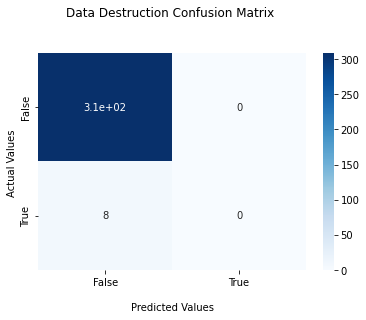

Browser Session Hijacking


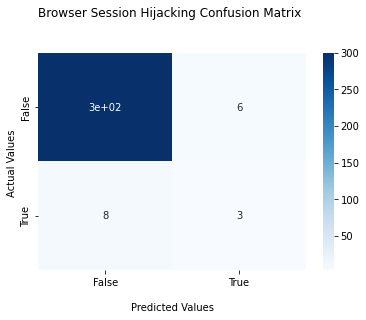

Exploitation for Credential Access


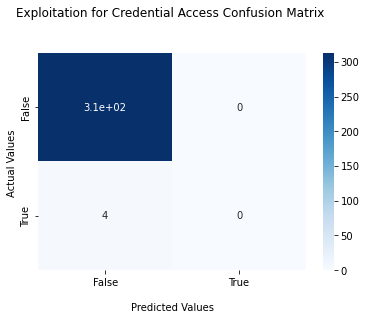

Abuse Elevation Control Mechanism


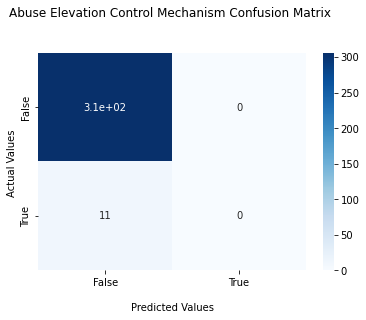

Adversary-in-the-Middle


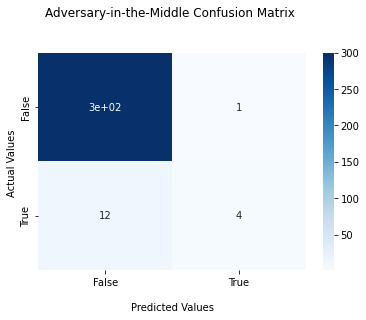

User Execution


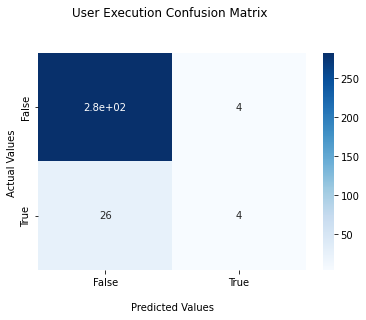

Unsecured Credentials


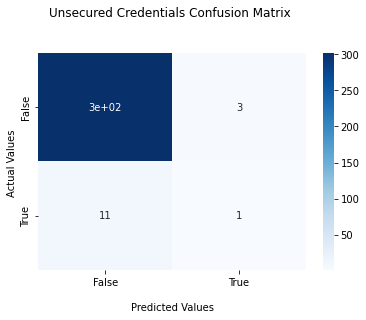

Brute Force


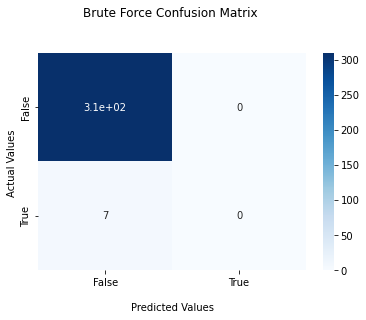

File and Directory Discovery


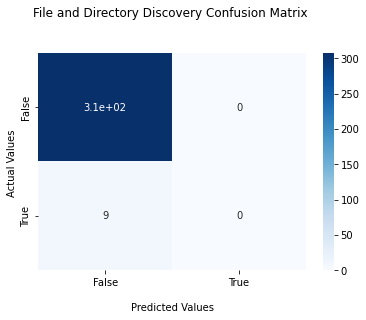

Valid Accounts


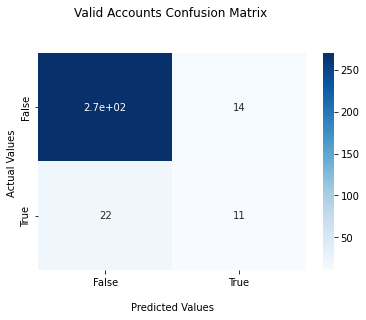

Exploitation for Defense Evasion


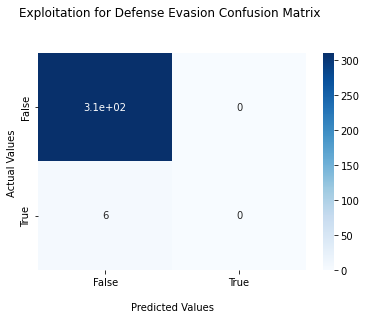

Create Account


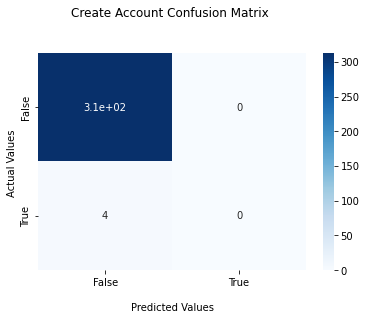

Endpoint Denial of Service


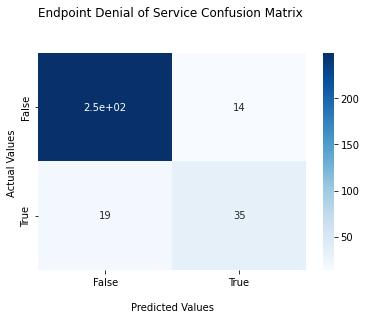

Drive-by Compromise


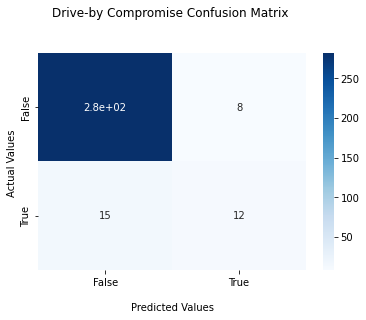

Exploitation for Client Execution


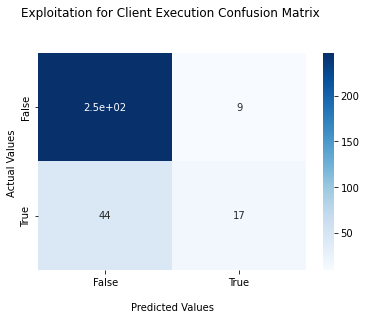

Exploitation of Remote Services


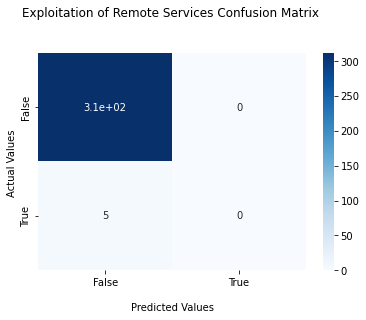

Stage Capabilities


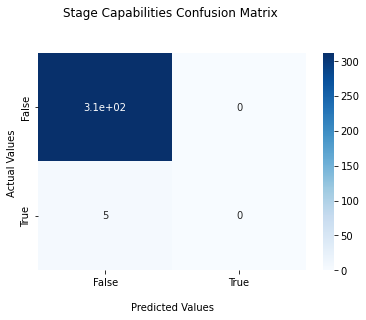

Exploit Public-Facing Application


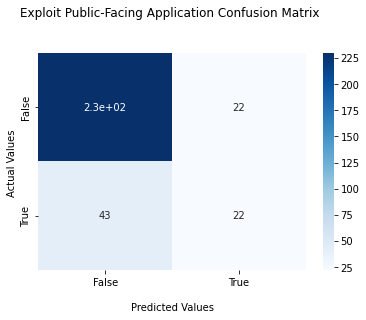

Forge Web Credentials


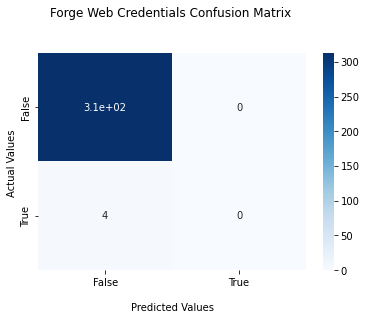

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, predicted_y)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

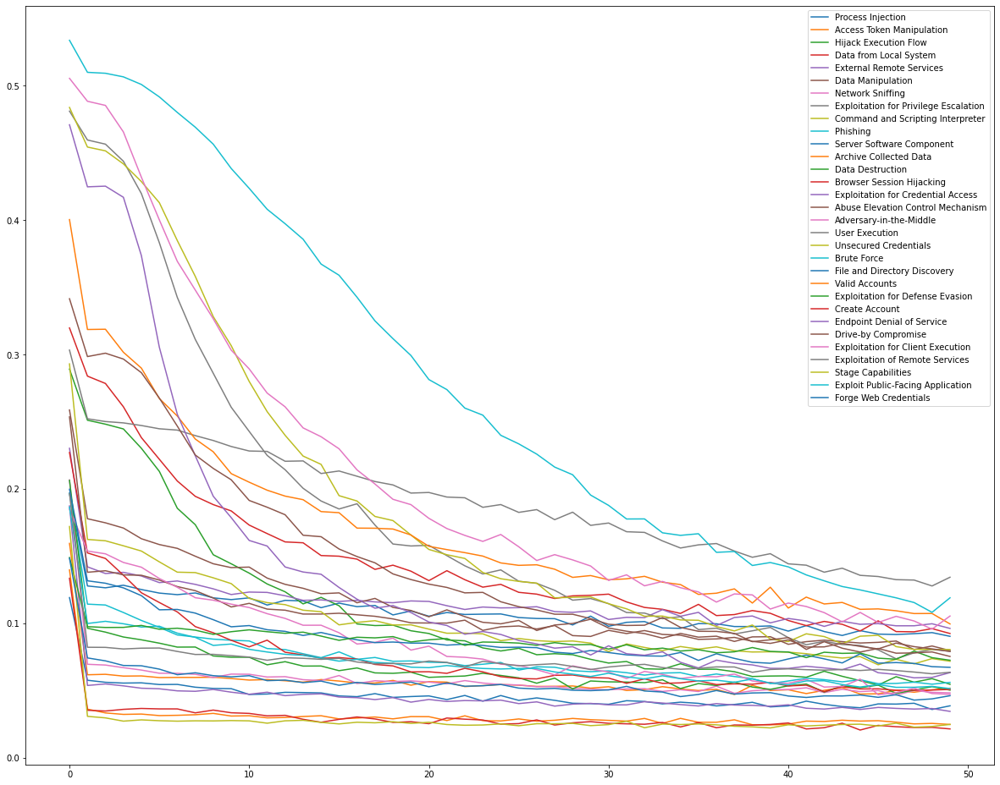

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.show()

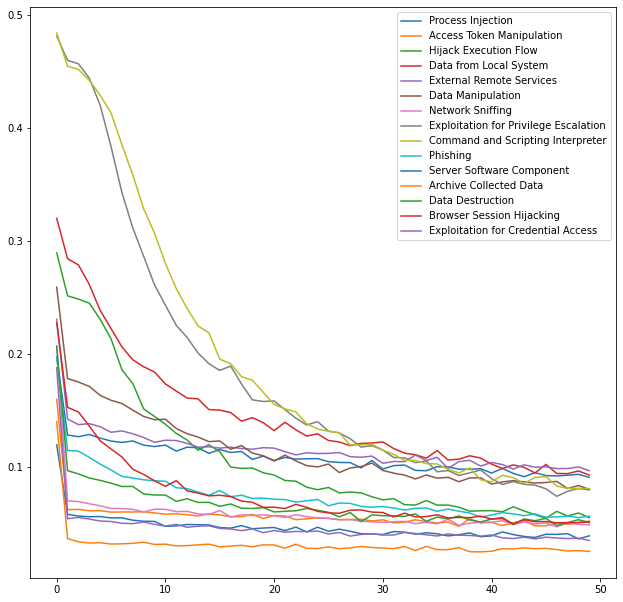

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(0, 15):
  plt.plot(values[i])
plt.legend(legend[:15], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 10.5)
plt.show()

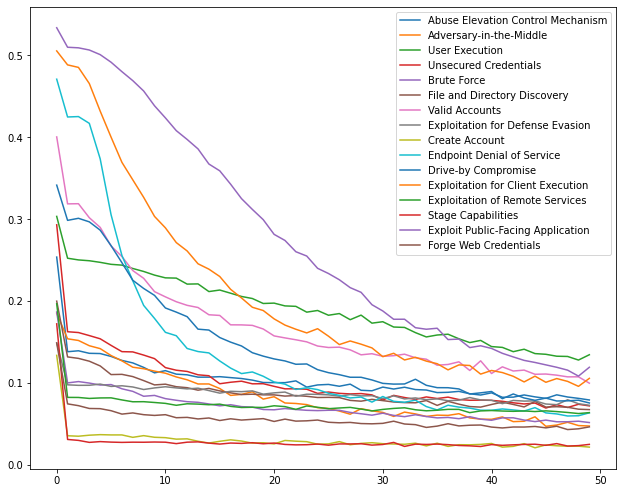

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(15, 31):
  plt.plot(values[i])
plt.legend(legend[15:], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 8.5)
plt.show()

## Train Extended

In [ ]:
#######################################
### --------- Setup BERT ---------- ###

# Name of the BERT model to use
model_name = 'bert-base-uncased'

# Max length of tokens
max_length = 350

# Load transformers config and set output_hidden_states to False
config = BertConfig.from_pretrained(model_name)
config.output_hidden_states = False

# Load BERT tokenizer
tokenizer = BertTokenizerFast.from_pretrained(pretrained_model_name_or_path = model_name, config = config)

# Load the Transformers BERT model
transformer_model = TFBertModel.from_pretrained(model_name, config = config)






Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/511M [00:00<?, ?B/s]

Some layers from the model checkpoint at bert-base-uncased were not used when initializing TFBertModel: ['nsp___cls', 'mlm___cls']
- This IS expected if you are initializing TFBertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFBertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
All the layers of TFBertModel were initialized from the model checkpoint at bert-base-uncased.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFBertModel for predictions without further training.


In [ ]:
#######################################
### ------- Build the model ------- ###

# TF Keras documentation: https://www.tensorflow.org/api_docs/python/tf/keras/Model

# Load the MainLayer
bert = transformer_model.layers[0]

# Build your model input
input_ids = Input(shape=(max_length,), name='input_ids', dtype='int32')
# attention_mask = Input(shape=(max_length,), name='attention_mask', dtype='int32') 
# inputs = {'input_ids': input_ids, 'attention_mask': attention_mask}
inputs = {'input_ids': input_ids}

# Load the Transformers BERT model as a layer in a Keras model
bert_model = bert(inputs)[1]
dropout = Dropout(config.hidden_dropout_prob, name='pooled_output')
pooled_output = dropout(bert_model, training=False)

# Then build your model output
outputs = {}
for col in y_train_extended.columns:
    col_name = col.replace(' ', '')
    new_layer = Dense(units=2, kernel_initializer=TruncatedNormal(stddev=config.initializer_range), name=col_name)(pooled_output)
    outputs[col] = new_layer

# And combine it all in a model object
model = Model(inputs=inputs, outputs=outputs, name='BERT_MultiLabel')

# Take a look at the model
model.summary()






Model: "BERT_MultiLabel"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_ids (InputLayer)         [(None, 350)]        0           []                               
                                                                                                  
 bert (TFBertMainLayer)         TFBaseModelOutputWi  109482240   ['input_ids[0][0]']              
                                thPoolingAndCrossAt                                               
                                tentions(last_hidde                                               
                                n_state=(None, 350,                                               
                                 768),                                                            
                                 pooler_output=(Non                                 

In [ ]:
#######################################
### ------- Train the model ------- ###

# Set an optimizer
optimizer = Adam(
    learning_rate=6e-05,
    epsilon=1e-07,
    decay=0.01,
    clipnorm=1.0)

# Set loss and metrics
loss = {}
metric = {}
for col in y_train_extended.columns:
    loss[col] = CategoricalCrossentropy(from_logits = True)
    metric[col] = CategoricalAccuracy ('accuracy')

# Compile the model
model.compile(
    optimizer = optimizer,
    loss = loss, 
    metrics = metric)

y = {}
for col in y_train_extended.columns:
    y[col] = to_categorical(y_train_extended[col].values)

# Tokenize the input (takes some time)
x = tokenizer(
    text=X_train_extended['Text'].to_list(),
    add_special_tokens=True,
    max_length=max_length,
    truncation=True,
    padding=True, 
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = True,
    verbose = True)

# Fit the model
history = model.fit(
    # x={'input_ids': x['input_ids'], 'attention_mask': x['attention_mask']},
    x={'input_ids': x['input_ids']},
    y=y,
    validation_split=0.2,
    batch_size=16,
    epochs=50)




Epoch 1/50
181/181 [==============================] - 179s 847ms/step - loss: 5.9919 - AbuseElevationControlMechanism_loss: 0.2526 - AccessTokenManipulation_loss: 0.0878 - Adversary-in-the-Middle_loss: 0.2970 - ArchiveCollectedData_loss: 0.0918 - BrowserSessionHijacking_loss: 0.1704 - BruteForce_loss: 0.1650 - CommandandScriptingInterpreter_loss: 0.3108 - CreateAccount_loss: 0.0671 - DataDestruction_loss: 0.2077 - DataManipulation_loss: 0.2372 - DatafromLocalSystem_loss: 0.3200 - Drive-byCompromise_loss: 0.2707 - EndpointDenialofService_loss: 0.2956 - ExploitPublic-FacingApplication_loss: 0.3033 - ExploitationforClientExecution_loss: 0.3035 - ExploitationforCredentialAccess_loss: 0.0689 - ExploitationforDefenseEvasion_loss: 0.0920 - ExploitationforPrivilegeEscalation_loss: 0.2703 - ExploitationofRemoteServices_loss: 0.0843 - ExternalRemoteServices_loss: 0.1389 - FileandDirectoryDiscovery_loss: 0.1713 - ForgeWebCredentials_loss: 0.0613 - HijackExecutionFlow_loss: 0.3033 - NetworkSniffin

In [ ]:
#######################################
### ----- Evaluate the model ------ ###

import numpy as np
test_x = tokenizer(
    text=X_test['Text'].to_list(),
    add_special_tokens=True,
    pad_to_max_length=True,
    max_length=max_length,
    truncation=True,
    return_tensors='tf',
    return_token_type_ids = False,
    return_attention_mask = False,
    verbose = True)

# Run evaluation
model_eval = model.predict(
    x={'input_ids':test_x['input_ids']},
)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
predicted_y = pd.DataFrame(columns=y_train_extended.columns)
for col in model_eval:
  result = []
  for el in model_eval[col]:
    if el[0] > el[1]:
      result.append(0)
    else:
      result.append(1)
  predicted_y[col] = result

## Test Extended

In [ ]:
print(accuracy_score(y_test.values, predicted_y))

0.14511041009463724


In [ ]:
print("F1 Score")
compute_metrics(predicted_y, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Adversary-in-the-Middle,Unsecured Credentials,Data from Local System,Data Manipulation,Brute Force,Drive-by Compromise,Exploitation for Client Execution,Exploit Public-Facing Application,Data Destruction,User Execution,File and Directory Discovery,Browser Session Hijacking,Hijack Execution Flow,Valid Accounts,Phishing,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.75,0.645833,0.597015,0.538462,0.518519,0.517241,0.5,0.4,0.4,0.395062,0.333333,0.333333,0.318182,0.307692,0.3,0.292683,0.217391,0.153846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(predicted_y, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Unsecured Credentials,Data from Local System,Adversary-in-the-Middle,Data Manipulation,Drive-by Compromise,Brute Force,Browser Session Hijacking,Exploitation for Client Execution,Exploit Public-Facing Application,Data Destruction,User Execution,Hijack Execution Flow,File and Directory Discovery,Valid Accounts,Phishing,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.722222,0.655738,0.62,0.583333,0.517241,0.4375,0.411765,0.37037,0.285714,0.272727,0.262295,0.261538,0.25,0.233333,0.222222,0.222222,0.151515,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(predicted_y, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Exploitation for Client Execution,Endpoint Denial of Service,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Brute Force,Data Manipulation,Command and Scripting Interpreter,Data from Local System,File and Directory Discovery,Phishing,Data Destruction,User Execution,Unsecured Credentials,Exploit Public-Facing Application,Drive-by Compromise,Hijack Execution Flow,Valid Accounts,Browser Session Hijacking,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.8,0.78,0.7,0.673913,0.666667,0.636364,0.547945,0.517241,0.5,0.5,0.5,0.5,0.466667,0.459459,0.434783,0.428571,0.384615,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, predicted_y, average='weighted'))

0.39666004556119394


In [ ]:
print(recall_score(y_test.values, predicted_y, average='weighted'))

0.3557377049180328


In [ ]:
print(precision_score(y_test.values, predicted_y, average='weighted'))

0.49813042036566957


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


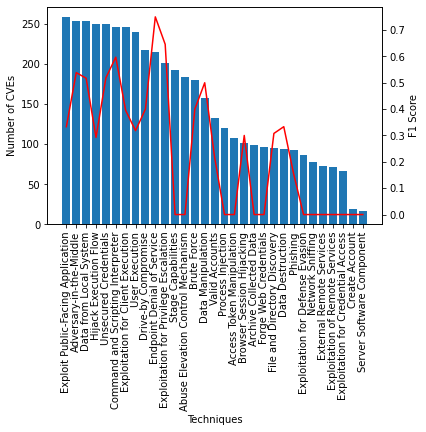

In [ ]:
print_F1_based_on_distribution(y_test.values, predicted_y, y_train,  y_test.columns)

Process Injection


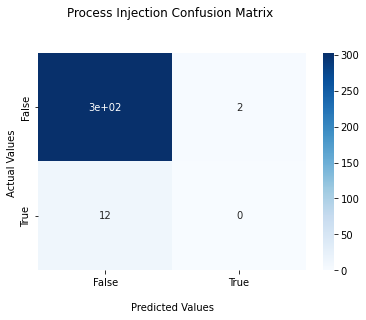

Access Token Manipulation


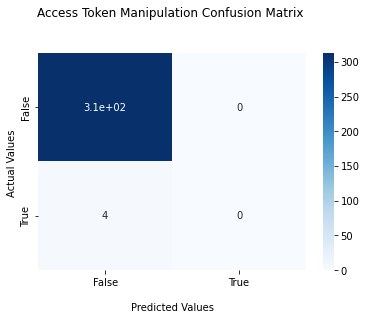

Hijack Execution Flow


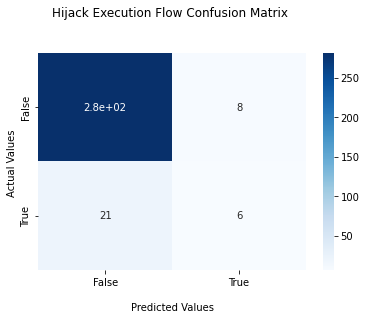

Data from Local System


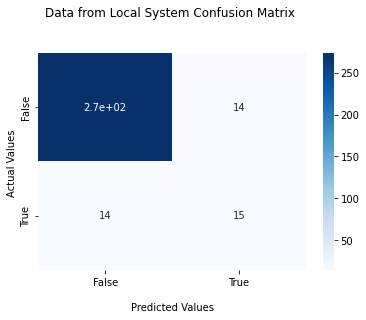

External Remote Services


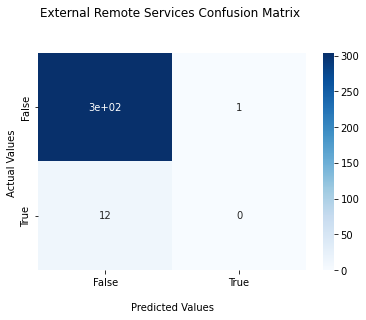

Data Manipulation


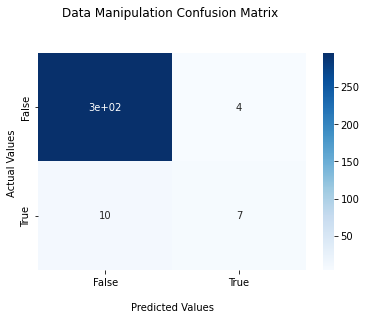

Network Sniffing


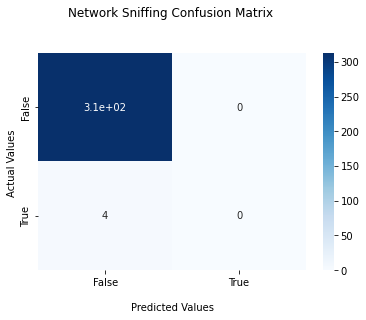

Exploitation for Privilege Escalation


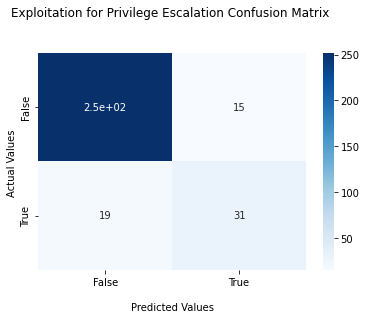

Command and Scripting Interpreter


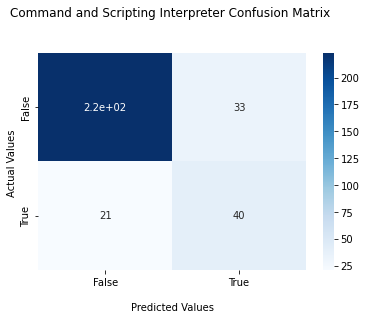

Phishing


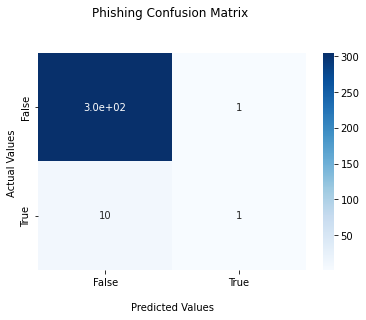

Server Software Component


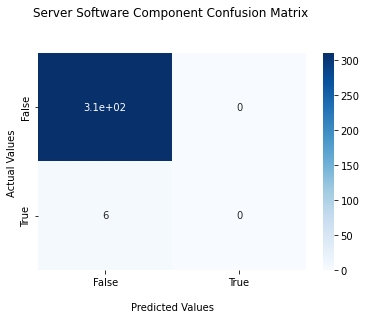

Archive Collected Data


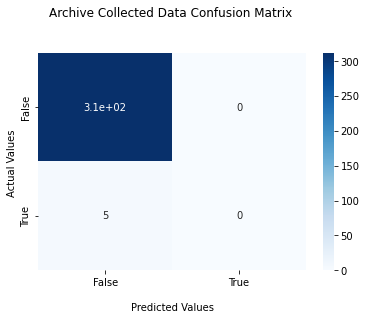

Data Destruction


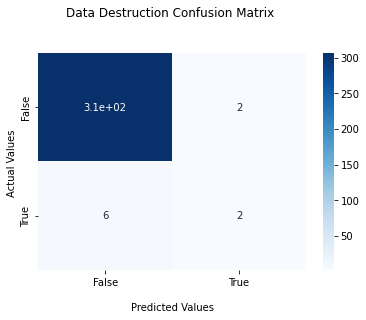

Browser Session Hijacking


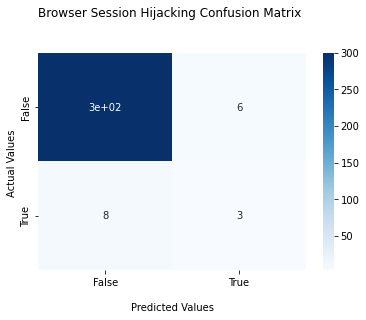

Exploitation for Credential Access


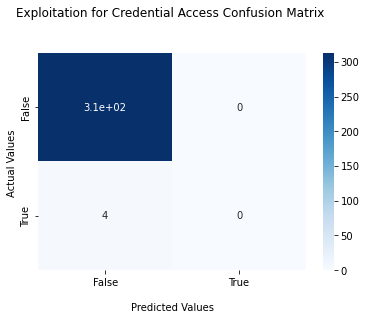

Abuse Elevation Control Mechanism


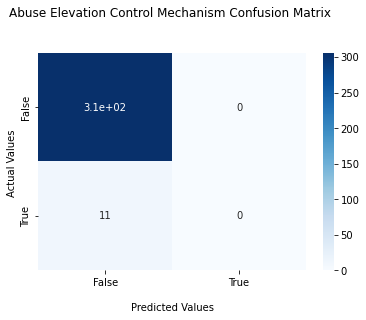

Adversary-in-the-Middle


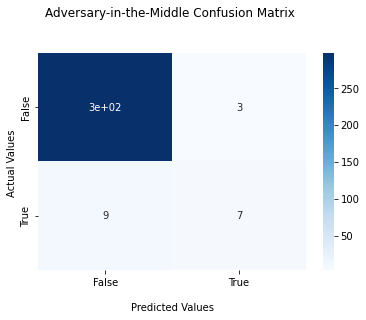

User Execution


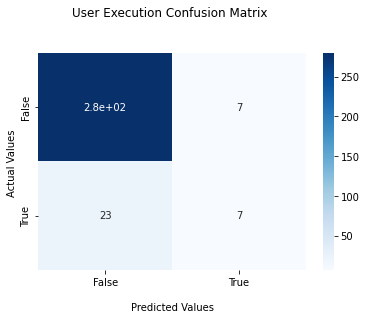

Unsecured Credentials


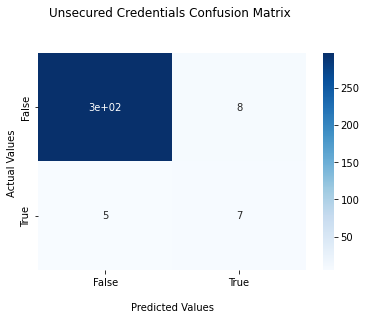

Brute Force


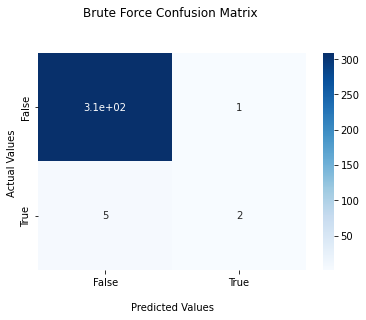

File and Directory Discovery


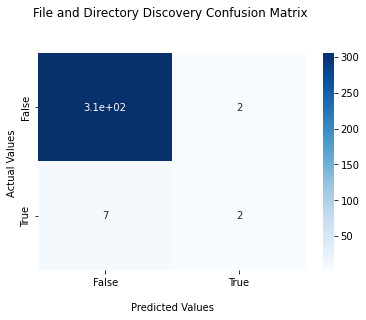

Valid Accounts


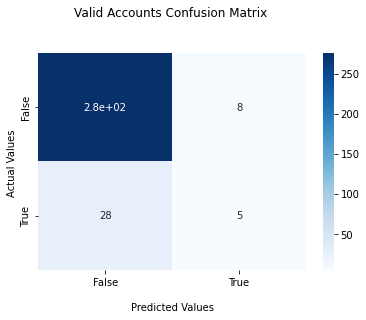

Exploitation for Defense Evasion


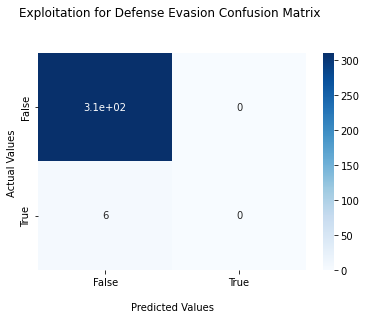

Create Account


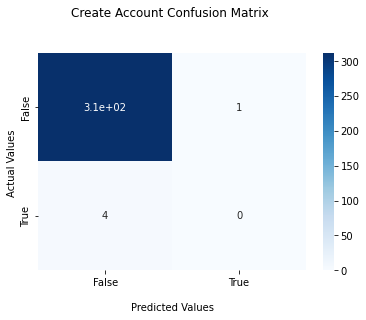

Endpoint Denial of Service


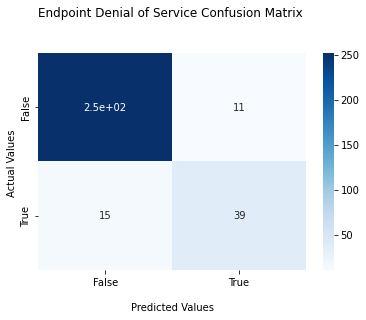

Drive-by Compromise


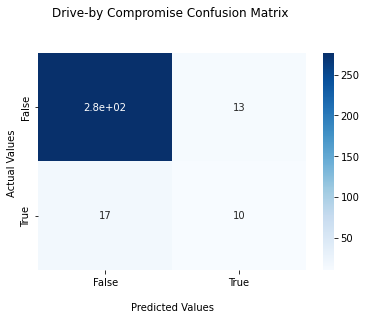

Exploitation for Client Execution


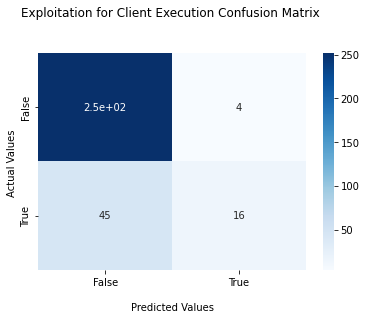

Exploitation of Remote Services


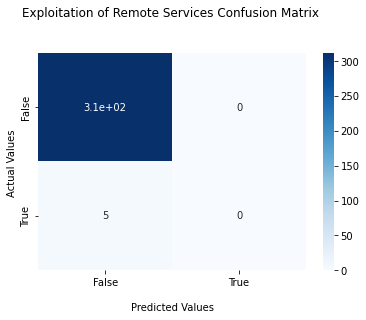

Stage Capabilities


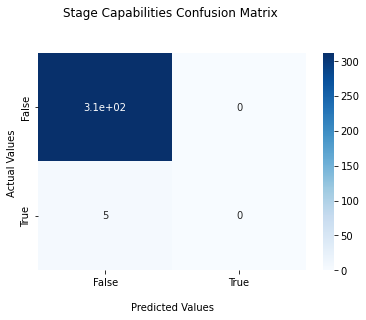

Exploit Public-Facing Application


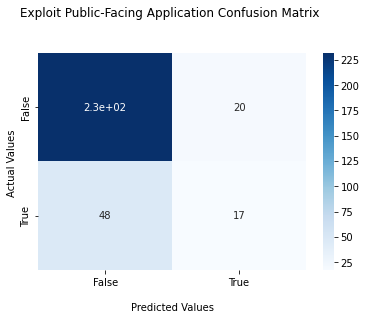

Forge Web Credentials


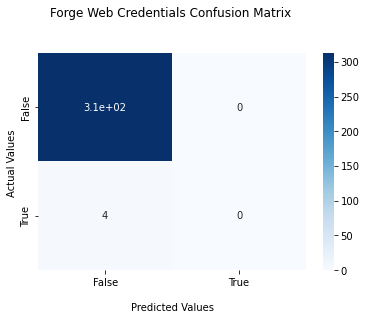

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, predicted_y)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

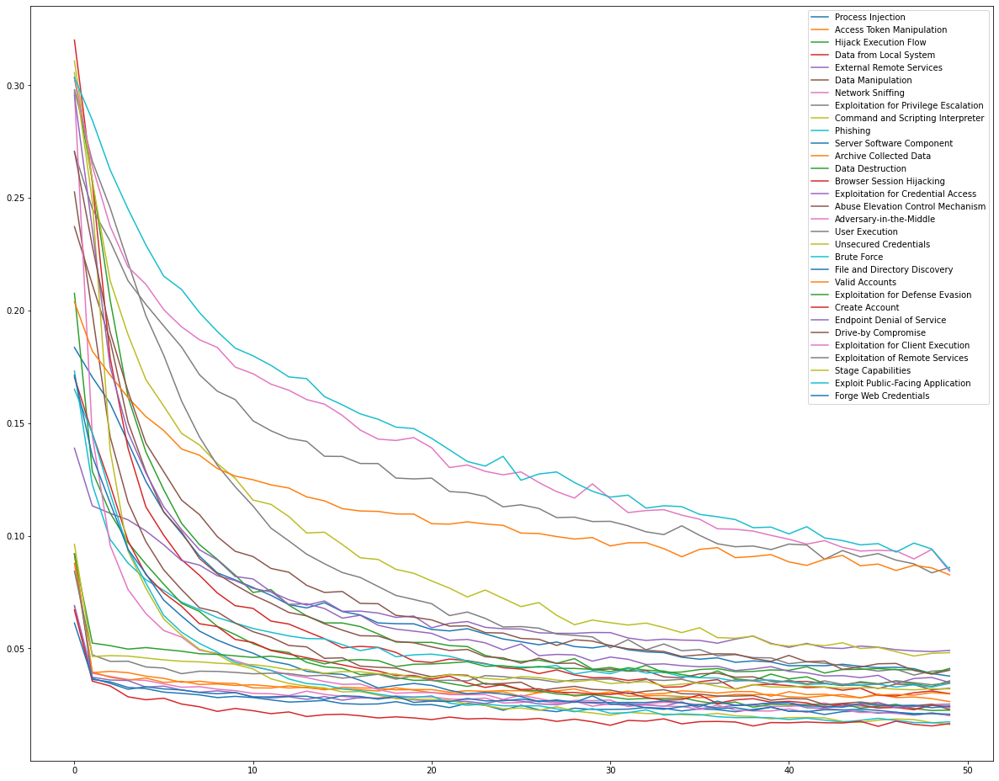

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.show()

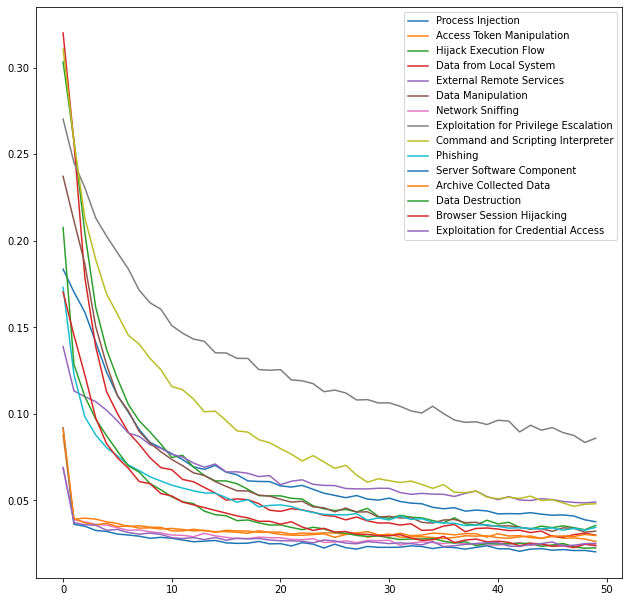

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(0, 15):
  plt.plot(values[i])
plt.legend(legend[:15], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 10.5)
plt.show()

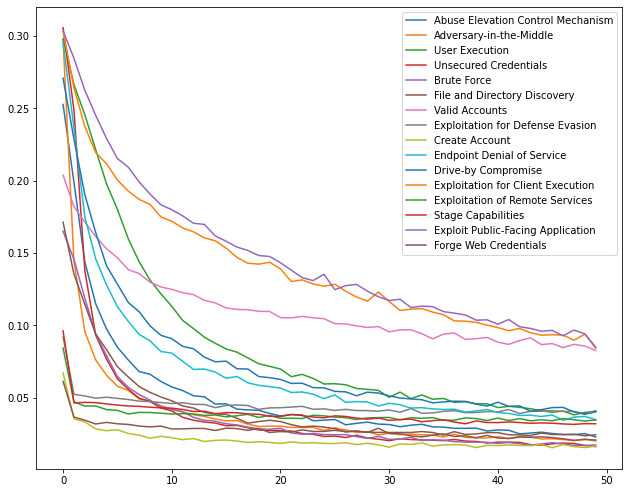

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    values.append(history.history[col_name + '_loss'])

for i in range(15, 31):
  plt.plot(values[i])
plt.legend(legend[15:], loc='upper right')

fig = plt.gcf()
fig.set_size_inches(10.5, 8.5)
plt.show()

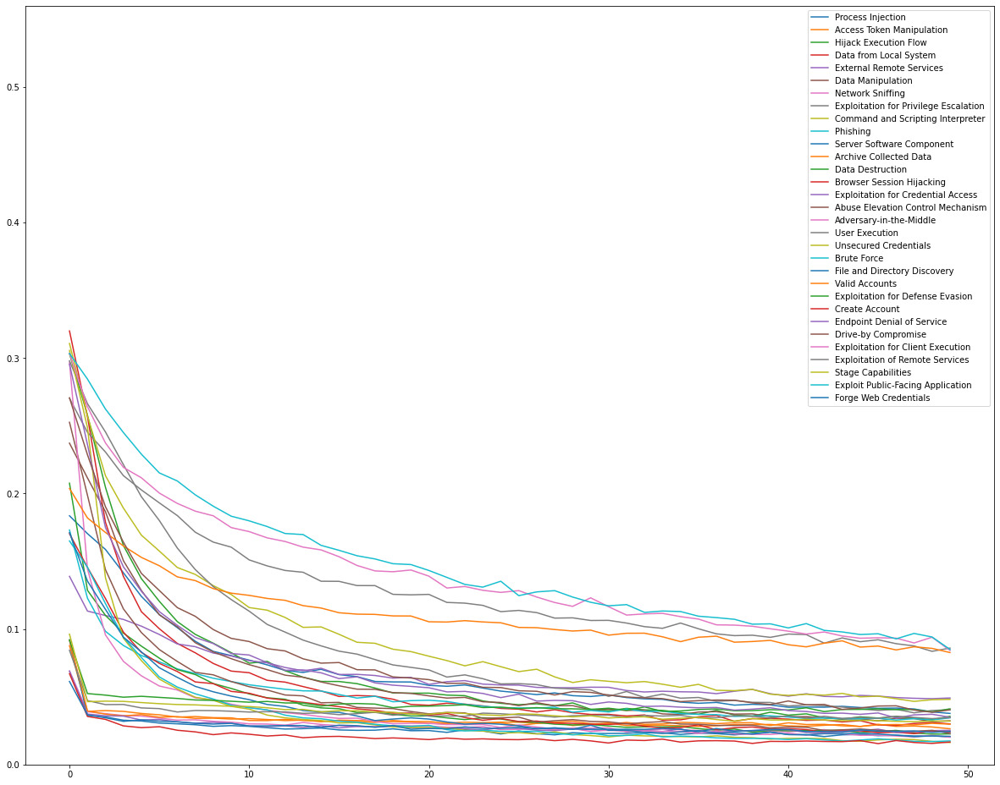

In [ ]:
values = []
legend = []
for col in y_train.columns:
    col_name = col.replace(' ', '')
    legend.append(col)
    plt.plot(history.history[col_name + '_loss'])
plt.legend(legend, loc='upper right')

fig = plt.gcf()
fig.set_size_inches(20.5, 16.5)
plt.ylim(0, 0.56)
plt.show()

In [ ]:
model.save('extended_bert_binomial')

INFO:tensorflow:Assets written to: extended_bert_binomial/assets


INFO:tensorflow:Assets written to: extended_bert_binomial/assets


In [ ]:
!zip -r  extended_bert_binomial.zip extended_bert_binomial

  adding: extended_bert_binomial/ (stored 0%)
  adding: extended_bert_binomial/variables/ (stored 0%)
  adding: extended_bert_binomial/variables/variables.data-00000-of-00001 (deflated 18%)
  adding: extended_bert_binomial/variables/variables.index (deflated 82%)
  adding: extended_bert_binomial/keras_metadata.pb (deflated 95%)
  adding: extended_bert_binomial/assets/ (stored 0%)
  adding: extended_bert_binomial/saved_model.pb (deflated 92%)


# Multi-label BERT

## Imports

In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer
pd.set_option('display.max_columns', None)

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train, y_train) = load_data_from_file('X_train.csv', 'y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')

## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

## Model Configuration

In [ ]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'bert-base-uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 520
    self.BATCH_SIZE = 32
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/570 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

In [ ]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        pad_to_max_length=True,
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [ ]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([32, 320])
attention_mask shape: torch.Size([32, 320])
labels shape: torch.Size([32, 31])


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.3)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [ ]:
device = config.DEVICE
device

device(type='cuda')

In [ ]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [ ]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


## Train

In [ ]:
model = Model()
model.to(device);

Downloading:   0%|          | 0.00/420M [00:00<?, ?B/s]

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.seq_relationship.bias', 'cls.seq_relationship.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.46845947206020355
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.15445859872611467


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.36021422445774076
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.30058481693267824
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.4509465347888858


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.30058481693267824
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2656077712774277
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.24564388990402222
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.23492038398981094
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.26300173963225165


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23492038398981094
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2262670561671257
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2207234114408493
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.21749647557735444
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.22303244298280672


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21749647557735444
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2146352231502533
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.21256930977106095
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.21099939346313476
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21135014572808908


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21099939346313476
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 3/50: F1 Score 0.0


Epoch 4:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2103222593665123
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2090712755918503
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2085709124803543
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20553310250127038


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2085709124803543
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 4/50: F1 Score 0.0


Epoch 5:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2082742765545845
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2075064942240715
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.20709726959466934
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20394672072210976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20709726959466934
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 5/50: F1 Score 0.0


Epoch 6:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2067793384194374
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.20582535564899446
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2058660238981247
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20099103831967643


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2058660238981247
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 6/50: F1 Score 0.0


Epoch 7:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20575415790081025
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2035068079829216
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.20783067643642425
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.19921656715315442


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20783067643642425
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 7/50: F1 Score 0.0


Epoch 8:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20434704869985582
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.20160296708345413
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.20792247354984283
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.19624943130238112


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20792247354984283
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 8/50: F1 Score 0.0


Epoch 9:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.2022364541888237
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1992566853761673
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.20154373198747635
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.19439546555973763


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20154373198747635
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 9/50: F1 Score 0.0


Epoch 10:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.19844384491443634
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19775548726320266
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.19731588363647462
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.18935266414354013


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19731588363647462
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 10/50: F1 Score 0.0


Epoch 11:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.19362135082483292
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.016181229773462785


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19528748244047164
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1970435708761215
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.18570910186268563


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1970435708761215
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 11/50: F1 Score 0.0


Epoch 12:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1915578305721283
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.11890243902439024


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1908320367336273
Eval Val accuracy: 0.00946372239747634
Eval Val micro f1 score: 0.016233766233766236


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.19117484539747237
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0256
Training loss: 0.18052247305249058


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19117484539747237
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0256
Epoch 12/50: F1 Score 0.0256
--- Best Model. Val loss: 0.0 -> 0.0256


Epoch 13:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18781441301107407
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.17914831130690162


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1861296609044075
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.14903129657228018


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.18751552999019622
Eval Val accuracy: 0.006309148264984227
Eval Val micro f1 score: 0.05362776025236593
Training loss: 0.17353472217570903


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18751552999019622
Eval Val accuracy: 0.006309148264984227
Eval Val micro f1 score: 0.05362776025236593
Epoch 13/50: F1 Score 0.05362776025236593
--- Best Model. Val loss: 0.0256 -> 0.05362776025236593


Epoch 14:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18586369454860688
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.23611111111111108


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1836908847093582
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.19075144508670522


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.18303180783987044
Eval Val accuracy: 0.015772870662460567
Eval Val micro f1 score: 0.11836115326251896
Training loss: 0.16771724612213845


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18303180783987044
Eval Val accuracy: 0.015772870662460567
Eval Val micro f1 score: 0.11836115326251896
Epoch 14/50: F1 Score 0.11836115326251896
--- Best Model. Val loss: 0.05362776025236593 -> 0.11836115326251896


Epoch 15:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18132970929145814
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.25885558583106266


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18055085390806197
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.15859030837004406


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17994148582220076
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.18023255813953487
Training loss: 0.161092710529649


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17994148582220076
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.18023255813953487
Epoch 15/50: F1 Score 0.18023255813953487
--- Best Model. Val loss: 0.11836115326251896 -> 0.18023255813953487


Epoch 16:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1785973682999611
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.26287262872628725


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17902663499116897
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.20343839541547276


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1779300794005394
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.21598877980364659
Training loss: 0.15616822121448296


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1779300794005394
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.21598877980364659
Epoch 16/50: F1 Score 0.21598877980364659
--- Best Model. Val loss: 0.18023255813953487 -> 0.21598877980364659


Epoch 17:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1769677683711052
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.24898511502029771


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17691431790590287
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.2834437086092715


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17567408978939056
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.19456366237482117
Training loss: 0.14992721829303476


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17567408978939056
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.19456366237482117
Epoch 17/50: F1 Score 0.19456366237482117


Epoch 18:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17367182075977325
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2857142857142857


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17476226836442948
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.29287598944591037


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17479132264852523
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.21787709497206703
Training loss: 0.14453885669625083


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17479132264852523
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.21787709497206703
Epoch 18/50: F1 Score 0.21787709497206703
--- Best Model. Val loss: 0.21598877980364659 -> 0.21787709497206703


Epoch 19:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17295796424150467
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.26502732240437155


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17657031565904618
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.2834850455136541


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17356890439987183
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2916129032258064
Training loss: 0.14122179098600565


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17356890439987183
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.2916129032258064
Epoch 19/50: F1 Score 0.2916129032258064
--- Best Model. Val loss: 0.21787709497206703 -> 0.2916129032258064


Epoch 20:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17119826674461364
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.29947916666666663


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17526862323284148
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.30788804071246817


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17414994686841964
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.33743842364532023
Training loss: 0.13533331280530886


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17414994686841964
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.33743842364532023
Epoch 20/50: F1 Score 0.33743842364532023
--- Best Model. Val loss: 0.2916129032258064 -> 0.33743842364532023


Epoch 21:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17514005899429322
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.29343629343629346


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17562946379184724
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.2838370565045992


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17259059846401215
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3291139240506329
Training loss: 0.1336143214342206


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17259059846401215
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3291139240506329
Epoch 21/50: F1 Score 0.3291139240506329


Epoch 22:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17195222824811934
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.27851458885941643


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17238137125968933
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.37647058823529417


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17045664191246032
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.2992125984251969
Training loss: 0.1290841608546501


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17045664191246032
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.2992125984251969
Epoch 22/50: F1 Score 0.2992125984251969


Epoch 23:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17003067582845688
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.2935064935064935


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1722960963845253
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3701067615658363


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17223365902900695
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2418478260869565
Training loss: 0.12440248093632765


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17223365902900695
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2418478260869565
Epoch 23/50: F1 Score 0.2418478260869565


Epoch 24:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17103169858455658
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3566265060240964


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1709782138466835
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.34057971014492755


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1703461229801178
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.2819843342036553
Training loss: 0.11978265591139017


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1703461229801178
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.2819843342036553
Epoch 24/50: F1 Score 0.2819843342036553


Epoch 25:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17121020555496216
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.36897767332549947


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1709042638540268
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3374083129584352


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17052353769540787
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3220125786163522
Training loss: 0.11545772209416988


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17052353769540787
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3220125786163522
Epoch 25/50: F1 Score 0.3220125786163522


Epoch 26:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17111156284809112
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3474065138721351


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17011499404907227
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3590963139120095


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16883383244276046
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.32790988735919896
Training loss: 0.11227005217657533


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16883383244276046
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.32790988735919896
Epoch 26/50: F1 Score 0.32790988735919896


Epoch 27:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17067471742630005
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3523809523809524


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1719601884484291
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.38029782359679265


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17024167776107788
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3153846153846153
Training loss: 0.1090350485471792


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17024167776107788
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3153846153846153
Epoch 27/50: F1 Score 0.3153846153846153


Epoch 28:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1698378011584282
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.36908881199538635


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1700463518500328
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.38029782359679265


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16923433691263198
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3470661672908864
Training loss: 0.10615662156149398


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16923433691263198
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3470661672908864
Epoch 28/50: F1 Score 0.3470661672908864
--- Best Model. Val loss: 0.33743842364532023 -> 0.3470661672908864


Epoch 29:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17049721777439117
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37800687285223367


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1696262165904045
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3674418604651163


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1690386027097702
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3383084577114428
Training loss: 0.10402102725103844


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1690386027097702
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3383084577114428
Epoch 29/50: F1 Score 0.3383084577114428


Epoch 30:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1708976522088051
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.38870056497175137


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16913006603717803
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.3725714285714286


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16878670379519461
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.341047503045067
Training loss: 0.10089576712181401


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16878670379519461
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.341047503045067
Epoch 30/50: F1 Score 0.341047503045067


Epoch 31:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17338091135025024
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.38283062645011606


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16978144645690918
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.3836549375709421


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17024950310587883
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3418803418803419
Training loss: 0.09924597102542256


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17024950310587883
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3418803418803419
Epoch 31/50: F1 Score 0.3418803418803419


Epoch 32:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.173984856903553
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.3848797250859107


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16773058772087096
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16997742354869844
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3509615384615385
Training loss: 0.09740974061017812


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16997742354869844
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3509615384615385
Epoch 32/50: F1 Score 0.3509615384615385
--- Best Model. Val loss: 0.3470661672908864 -> 0.3509615384615385


Epoch 33:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1720092177391052
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3818393480791618


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16724631637334825
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4101995565410199


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.170665742456913
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3590963139120095
Training loss: 0.09504637416712074


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.170665742456913
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3590963139120095
Epoch 33/50: F1 Score 0.3590963139120095
--- Best Model. Val loss: 0.3509615384615385 -> 0.3590963139120095


Epoch 34:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17043079435825348
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3810623556581987


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16926407516002656
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.41048034934497823


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17068929597735405
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.36299765807962525
Training loss: 0.09331117310496263


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17068929597735405
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.36299765807962525
Epoch 34/50: F1 Score 0.36299765807962525
--- Best Model. Val loss: 0.3590963139120095 -> 0.36299765807962525


Epoch 35:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17009057849645615
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.4009009009009009


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17054273039102555
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.4086486486486486


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1709423191845417
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3748544819557625
Training loss: 0.09226877892086673


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1709423191845417
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3748544819557625
Epoch 35/50: F1 Score 0.3748544819557625
--- Best Model. Val loss: 0.36299765807962525 -> 0.3748544819557625


Epoch 36:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16776540279388427
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3878504672897196


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17189114093780516
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.41259500542888167


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16940533816814424
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3760092272202999
Training loss: 0.09077611894801606


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16940533816814424
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3760092272202999
Epoch 36/50: F1 Score 0.3760092272202999
--- Best Model. Val loss: 0.3748544819557625 -> 0.3760092272202999


Epoch 37:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16761309951543807
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.38095238095238093


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17269531786441802
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.42978723404255315


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16751689687371255
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3912543153049482
Training loss: 0.08943889082171196


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16751689687371255
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3912543153049482
Epoch 37/50: F1 Score 0.3912543153049482
--- Best Model. Val loss: 0.3760092272202999 -> 0.3912543153049482


Epoch 38:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1677621677517891
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.37971698113207547


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17075204402208327
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.42307692307692313


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16837989985942842
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.3866513233601841
Training loss: 0.08740893205584482


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16837989985942842
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.3866513233601841
Epoch 38/50: F1 Score 0.3866513233601841


Epoch 39:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1683473229408264
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.380281690140845


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16901568323373795
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.41657579062159217


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16823097318410873
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4
Training loss: 0.08566997494808463


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16823097318410873
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4
Epoch 39/50: F1 Score 0.4
--- Best Model. Val loss: 0.3912543153049482 -> 0.4


Epoch 40:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.168422120064497
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3857988165680474


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1688982218503952
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4088397790055248


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1688591718673706
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4044444444444445
Training loss: 0.08410954873922259


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1688591718673706
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4044444444444445
Epoch 40/50: F1 Score 0.4044444444444445
--- Best Model. Val loss: 0.4 -> 0.4044444444444445


Epoch 41:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16811060532927513
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3854289071680376


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1683882936835289
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4115044247787611


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16833249777555465
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.40401785714285715
Training loss: 0.08243849267100178


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16833249777555465
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.40401785714285715
Epoch 41/50: F1 Score 0.40401785714285715


Epoch 42:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16839214712381362
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.38497652582159625


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16817852333188058
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40449438202247195


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16864699572324754
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4172185430463575
Training loss: 0.08144866675138474


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16864699572324754
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4172185430463575
Epoch 42/50: F1 Score 0.4172185430463575
--- Best Model. Val loss: 0.4044444444444445 -> 0.4172185430463575


Epoch 43:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1683102697134018
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.3976878612716763


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16810566931962967
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4108967082860386


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16836865097284318
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4076147816349385
Training loss: 0.08073387277680774


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16836865097284318
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.4076147816349385
Epoch 43/50: F1 Score 0.4076147816349385


Epoch 44:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16854968145489693
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.38985005767012687


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1682895079255104
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.38940092165898615


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16815429776906968
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4190687361419069
Training loss: 0.080014132223157


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16815429776906968
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4190687361419069
Epoch 44/50: F1 Score 0.4190687361419069
--- Best Model. Val loss: 0.4172185430463575 -> 0.4190687361419069


Epoch 45:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16840923503041266
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3940774487471526


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16853558495640755
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3903002309468822


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16837505027651786
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40857787810383744
Training loss: 0.07910742220837017


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16837505027651786
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.40857787810383744
Epoch 45/50: F1 Score 0.40857787810383744


Epoch 46:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16827702522277832
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40090600226500567


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16835055574774743
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.39359267734553777


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16818469166755676
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.414027149321267
Training loss: 0.0782231921546681


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16818469166755676
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.414027149321267
Epoch 46/50: F1 Score 0.414027149321267


Epoch 47:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16837175637483598
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.40990990990990994


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16852164044976234
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.39588100686498856


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16841262057423592
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4009111617312073
Training loss: 0.0778132563586845


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16841262057423592
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4009111617312073
Epoch 47/50: F1 Score 0.4009111617312073


Epoch 48:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16834861561655998
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40318906605922555


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16838089376688004
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4027303754266212


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1683877721428871
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4022727272727272
Training loss: 0.07753420872397201


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1683877721428871
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4022727272727272
Epoch 48/50: F1 Score 0.4022727272727272


Epoch 49:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16841601580381393
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40181611804767314


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16843254566192628
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4022727272727272


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16843629106879235
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4022727272727272
Training loss: 0.07772286244949629


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16843629106879235
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4022727272727272
Epoch 49/50: F1 Score 0.4022727272727272


## Test

In [ ]:

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


In [ ]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [ ]:
test_pred = predict(best_model)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [ ]:
print(accuracy_score(y_test.values, test_pred))

0.12618296529968454


In [ ]:
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Data from Local System,User Execution,Exploitation for Client Execution,Hijack Execution Flow,Exploit Public-Facing Application,Drive-by Compromise,Data Manipulation,Unsecured Credentials,Valid Accounts,File and Directory Discovery,Phishing,Browser Session Hijacking,Exploitation for Defense Evasion,Process Injection,Create Account,Stage Capabilities,Exploitation of Remote Services,Abuse Elevation Control Mechanism,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.769231,0.615385,0.595745,0.571429,0.444444,0.4,0.395349,0.378378,0.336634,0.333333,0.285714,0.285714,0.266667,0.181818,0.166667,0.153846,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Adversary-in-the-Middle,Data from Local System,Exploitation for Client Execution,User Execution,Exploit Public-Facing Application,Hijack Execution Flow,Drive-by Compromise,Valid Accounts,Data Manipulation,Unsecured Credentials,File and Directory Discovery,Phishing,Browser Session Hijacking,Exploitation for Defense Evasion,Process Injection,Create Account,Stage Capabilities,Exploitation of Remote Services,Abuse Elevation Control Mechanism,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.740741,0.56,0.557377,0.5,0.344828,0.278689,0.266667,0.261538,0.259259,0.222222,0.181818,0.176471,0.166667,0.111111,0.090909,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Unsecured Credentials,Phishing,Adversary-in-the-Middle,Endpoint Denial of Service,User Execution,Data Manipulation,Hijack Execution Flow,Exploitation for Client Execution,Drive-by Compromise,Exploitation for Privilege Escalation,Data from Local System,Command and Scripting Interpreter,Valid Accounts,Browser Session Hijacking,File and Directory Discovery,Exploit Public-Facing Application,Exploitation for Defense Evasion,Process Injection,Create Account,Stage Capabilities,Exploitation of Remote Services,Abuse Elevation Control Mechanism,Brute Force,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,1.0,1.0,0.8,0.8,0.8,0.75,0.7,0.68,0.666667,0.636364,0.625,0.586207,0.5,0.5,0.5,0.472222,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.3743922680749423


In [ ]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.30983606557377047


In [ ]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5525020441840679


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


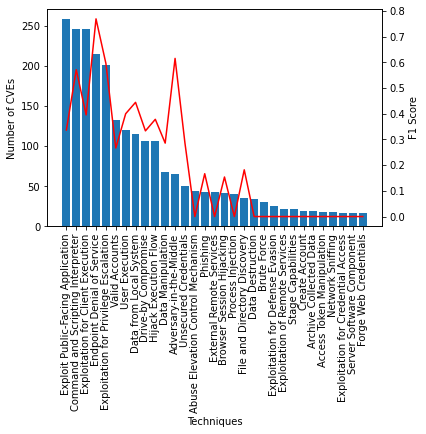

In [ ]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


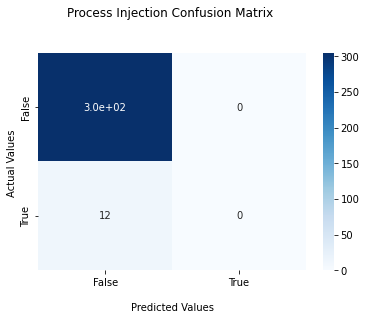

Access Token Manipulation


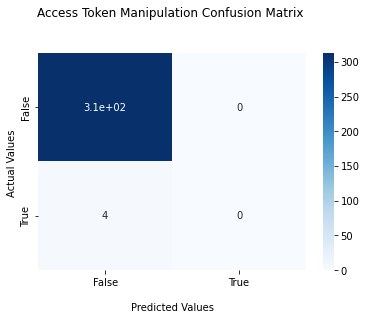

Hijack Execution Flow


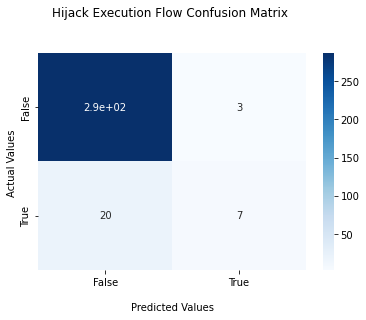

Data from Local System


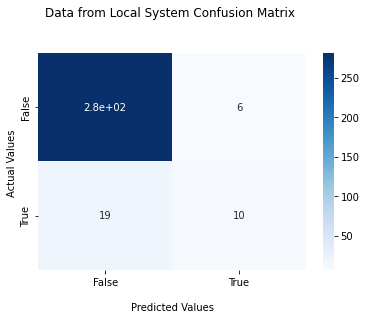

External Remote Services


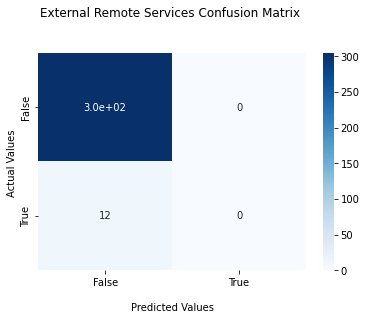

Data Manipulation


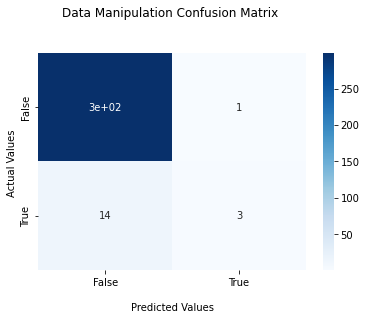

Network Sniffing


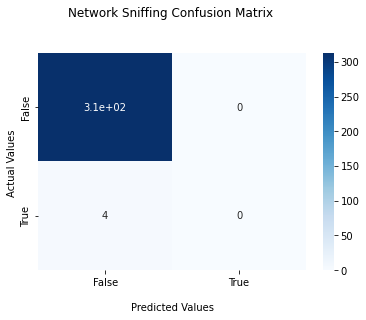

Exploitation for Privilege Escalation


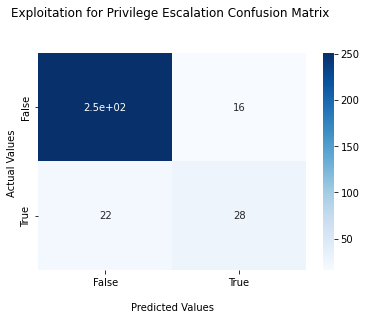

Command and Scripting Interpreter


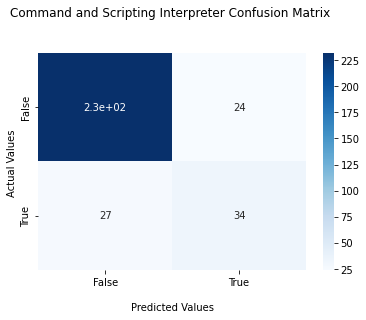

Phishing


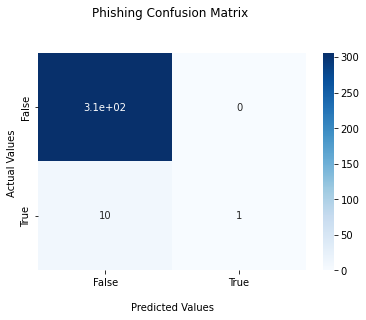

Server Software Component


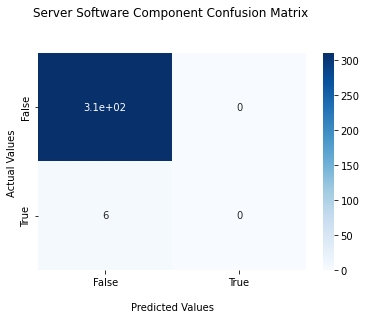

Archive Collected Data


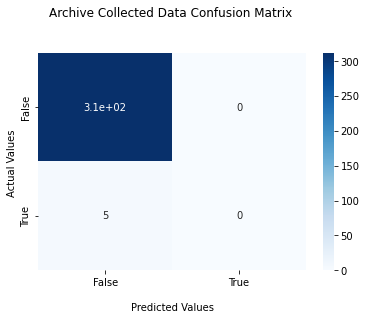

Data Destruction


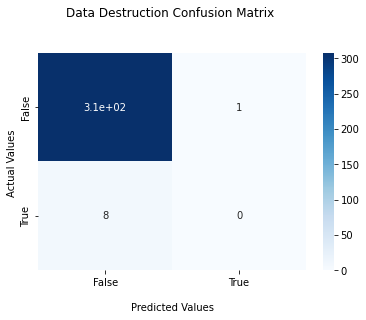

Browser Session Hijacking


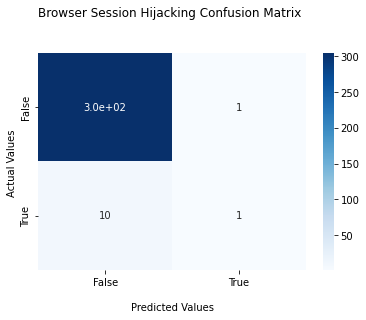

Exploitation for Credential Access


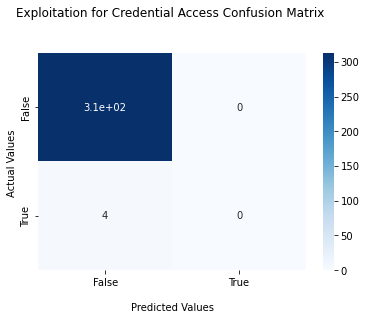

Abuse Elevation Control Mechanism


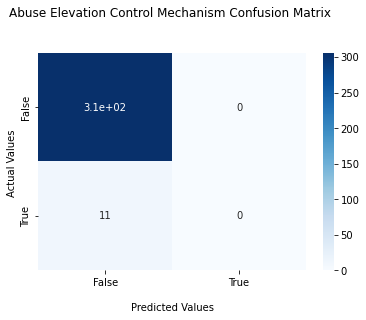

Adversary-in-the-Middle


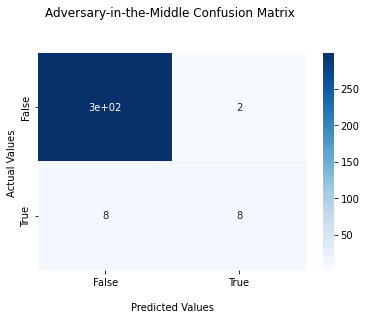

User Execution


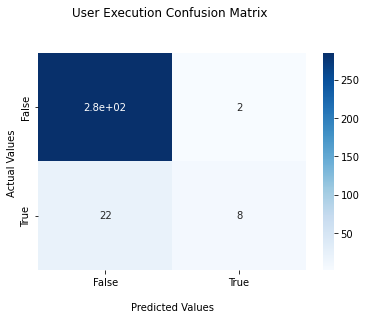

Unsecured Credentials


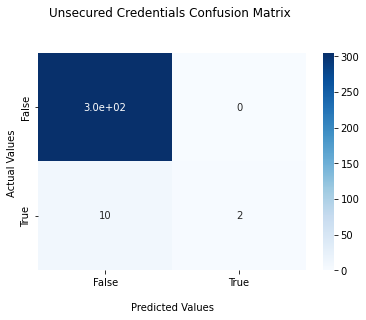

Brute Force


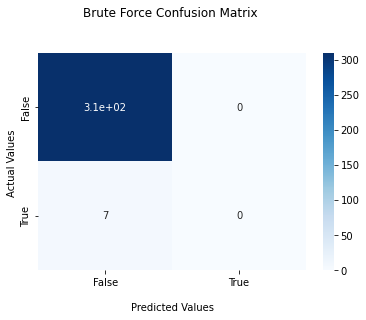

File and Directory Discovery


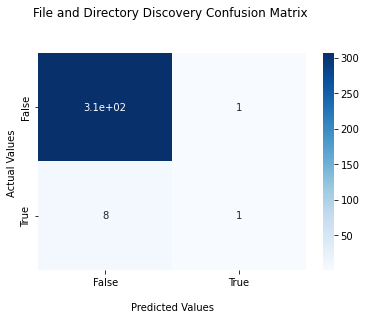

Valid Accounts


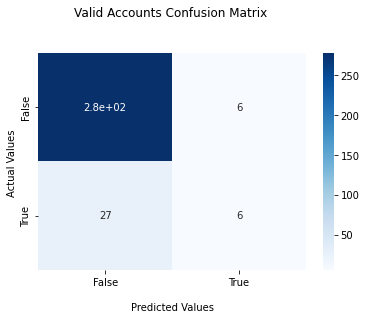

Exploitation for Defense Evasion


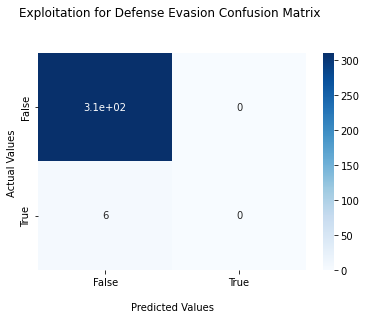

Create Account


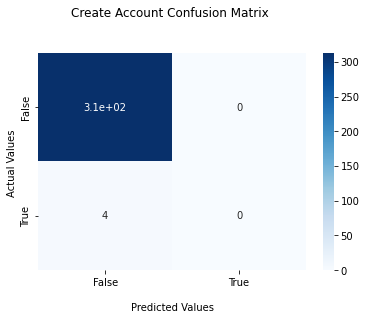

Endpoint Denial of Service


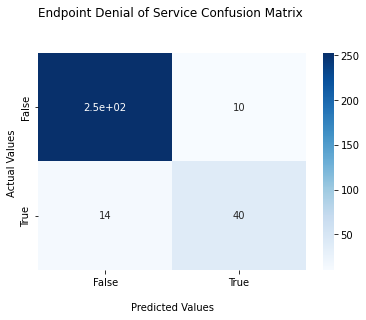

Drive-by Compromise


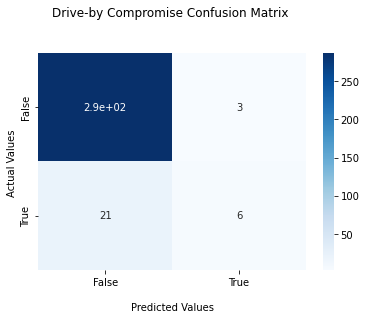

Exploitation for Client Execution


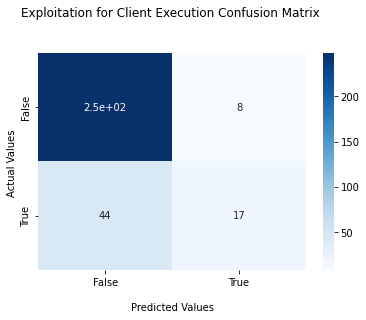

Exploitation of Remote Services


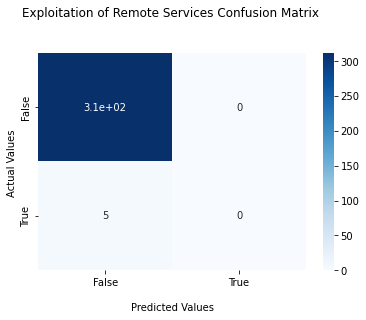

Stage Capabilities


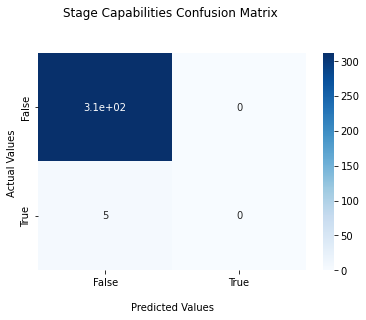

Exploit Public-Facing Application


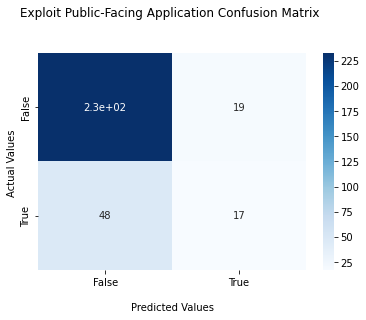

Forge Web Credentials


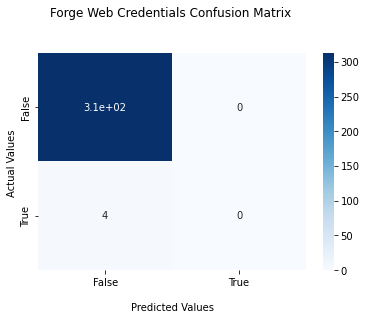

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

# Multi-label SecBERT


## Imports

In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train, y_train) = load_data_from_file('X_train.csv', 'y_train.csv')
(X_train_extended, y_train_extended) = load_data_from_file('final_extended_X_train.csv', 'final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')

## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

## Model Configuration

In [ ]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'jackaduma/SecBERT'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 320
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

Downloading:   0%|          | 0.00/467 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/369k [00:00<?, ?B/s]

In [ ]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        pad_to_max_length=True,
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [ ]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 320])
attention_mask shape: torch.Size([16, 320])
labels shape: torch.Size([16, 31])


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [ ]:
device = config.DEVICE
device

device(type='cuda')

In [ ]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [ ]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


## Train

In [ ]:
model = Model()
model.to(device);

Downloading:   0%|          | 0.00/321M [00:00<?, ?B/s]

Some weights of the model checkpoint at jackaduma/SecBERT were not used when initializing BertModel: ['cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.transform.dense.bias', 'cls.predictions.decoder.bias', 'cls.predictions.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2793704614043236
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.23495170772075652
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.21860277876257897
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.3051795366932364


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21860277876257897
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.21260227710008622
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.21031044349074363
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.20821138918399812
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21126791554338792


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20821138918399812
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.20675774291157722
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.20473742559552194
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.20015054792165757
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.2034187665757011


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20015054792165757
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19579999670386314
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.016260162601626018


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1945718690752983
Eval Val accuracy: 0.00946372239747634
Eval Val micro f1 score: 0.0565149136577708


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18832157477736472
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.10703363914373089
Training loss: 0.1939293664167909


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18832157477736472
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.10703363914373089
Epoch 3/50: F1 Score 0.10703363914373089
--- Best Model. Val loss: 0.0 -> 0.10703363914373089


Epoch 4:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18694935664534568
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.13595166163141992


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18781304582953454
Eval Val accuracy: 0.022082018927444796
Eval Val micro f1 score: 0.10510510510510511


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17963878065347672
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.19770773638968478
Training loss: 0.1809800896574469


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17963878065347672
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.19770773638968478
Epoch 4/50: F1 Score 0.19770773638968478
--- Best Model. Val loss: 0.10703363914373089 -> 0.19770773638968478


Epoch 5:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1794101871550083
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.19860139860139858


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1836439073085785
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.17110799438990182


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17498949654400348
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.22809457579972184
Training loss: 0.16586001445265378


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17498949654400348
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.22809457579972184
Epoch 5/50: F1 Score 0.22809457579972184
--- Best Model. Val loss: 0.19770773638968478 -> 0.22809457579972184


Epoch 6:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17335254587233068
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.20786516853932582


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18156736046075822
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.21304926764314247


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17279779575765133
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2520107238605898
Training loss: 0.1511430196902331


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17279779575765133
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.2520107238605898
Epoch 6/50: F1 Score 0.2520107238605898
--- Best Model. Val loss: 0.22809457579972184 -> 0.2520107238605898


Epoch 7:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17133815959095955
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2377049180327869


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17861699424684047
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.28117359413202936


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1718173250555992
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.267379679144385
Training loss: 0.13779450392021853


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1718173250555992
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.267379679144385
Epoch 7/50: F1 Score 0.267379679144385
--- Best Model. Val loss: 0.2520107238605898 -> 0.267379679144385


Epoch 8:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1691279463469982
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.2691790040376851


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17642840258777143
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3287037037037037


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1713624570518732
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.29781771501925547
Training loss: 0.12450896545368083


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1713624570518732
Eval Val accuracy: 0.08201892744479496
Eval Val micro f1 score: 0.29781771501925547
Epoch 8/50: F1 Score 0.29781771501925547
--- Best Model. Val loss: 0.267379679144385 -> 0.29781771501925547


Epoch 9:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16727701500058173
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3234916559691913


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1729444157332182
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3673469387755102


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17048333510756492
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3422330097087379
Training loss: 0.1146492529879598


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17048333510756492
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3422330097087379
Epoch 9/50: F1 Score 0.3422330097087379
--- Best Model. Val loss: 0.29781771501925547 -> 0.3422330097087379


Epoch 10:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16800192631781102
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3462469733656175


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1770751591771841
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3854389721627409


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17068765945732595
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.34549878345498786
Training loss: 0.1068064223317539


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17068765945732595
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.34549878345498786
Epoch 10/50: F1 Score 0.34549878345498786
--- Best Model. Val loss: 0.3422330097087379 -> 0.34549878345498786


Epoch 11:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1681713480502367
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3986486486486487


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17142247408628464
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4043010752688172


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1737360291182995
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.3301204819277108
Training loss: 0.09788892317344161


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1737360291182995
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.3301204819277108
Epoch 11/50: F1 Score 0.3301204819277108


Epoch 12:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1687533225864172
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3889528193325662


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.174660399928689
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4060475161987041


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17156649865210055
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3841676367869616
Training loss: 0.08798740173087401


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17156649865210055
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3841676367869616
Epoch 12/50: F1 Score 0.3841676367869616
--- Best Model. Val loss: 0.34549878345498786 -> 0.3841676367869616


Epoch 13:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1686260599642992
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.40674157303370784


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17794540524482727
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4084210526315789


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17342755161225795
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.38162544169611307
Training loss: 0.0800711353912073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17342755161225795
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.38162544169611307
Epoch 13/50: F1 Score 0.38162544169611307


Epoch 14:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16838362962007522
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.42744656917885265


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17548945993185044
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.40807651434643993


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17461783885955812
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3806146572104019
Training loss: 0.0731200200450771


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17461783885955812
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.3806146572104019
Epoch 14/50: F1 Score 0.3806146572104019


Epoch 15:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17012004666030406
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4318936877076412


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17342529483139515
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44000000000000006


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1744463212788105
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.3962485345838218
Training loss: 0.06778968890361926


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1744463212788105
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.3962485345838218
Epoch 15/50: F1 Score 0.3962485345838218
--- Best Model. Val loss: 0.3841676367869616 -> 0.3962485345838218


Epoch 16:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1688742496073246
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4280936454849498


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17339455895125866
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4261241970021413


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17608835734426975
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4
Training loss: 0.062448387176674953


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17608835734426975
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4
Epoch 16/50: F1 Score 0.4
--- Best Model. Val loss: 0.3962485345838218 -> 0.4


Epoch 17:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17037105113267897
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.44278074866310163


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17401532121002675
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4336569579288026


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1743761695921421
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4276018099547511
Training loss: 0.058711913469083166


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1743761695921421
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4276018099547511
Epoch 17/50: F1 Score 0.4276018099547511
--- Best Model. Val loss: 0.4 -> 0.4276018099547511


Epoch 18:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17191633358597755
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.43595505617977526


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17482971474528314
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4310722100656455


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17601167373359203
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4078341013824885
Training loss: 0.05422221593120519


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17601167373359203
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.4078341013824885
Epoch 18/50: F1 Score 0.4078341013824885


Epoch 19:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17267176359891892
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.43392070484581496


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1781027030199766
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.44206008583690987


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17576157860457897
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.429050279329609
Training loss: 0.05141751823179862


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17576157860457897
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.429050279329609
Epoch 19/50: F1 Score 0.429050279329609
--- Best Model. Val loss: 0.4276018099547511 -> 0.429050279329609


Epoch 20:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17413961552083493
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4345945945945946


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1818392988294363
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4451345755693582


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17731057703495026
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4224719101123595
Training loss: 0.047787895404240666


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17731057703495026
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4224719101123595
Epoch 20/50: F1 Score 0.4224719101123595


Epoch 21:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17634222023189067
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4240437158469945


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18349740989506244
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.43350785340314135


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17835694402456284
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.43001119820828676
Training loss: 0.04485819702420164


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17835694402456284
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.43001119820828676
Epoch 21/50: F1 Score 0.43001119820828676
--- Best Model. Val loss: 0.429050279329609 -> 0.43001119820828676


Epoch 22:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17664244771003723
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44178454842219805


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18085797727108002
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.44491525423728817


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.17916030250489712
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4166666666666667
Training loss: 0.04211436290951336


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17916030250489712
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4166666666666667
Epoch 22/50: F1 Score 0.4166666666666667


Epoch 23:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17843943759799002
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.43219404630650493


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18053460940718652
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4525547445255475


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18117307908833027
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.429050279329609
Training loss: 0.04037688984809553


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18117307908833027
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.429050279329609
Epoch 23/50: F1 Score 0.429050279329609


Epoch 24:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1794654581695795
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.439344262295082


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17952981889247893
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4461045891141943


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1838100202381611
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4239733629300777
Training loss: 0.038451026040403284


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1838100202381611
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4239733629300777
Epoch 24/50: F1 Score 0.4239733629300777


Epoch 25:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18184634372591973
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4375690607734806


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.17944700121879578
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.454828660436137


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1850648332387209
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.43468715697036225
Training loss: 0.036332433506408156


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1850648332387209
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.43468715697036225
Epoch 25/50: F1 Score 0.43468715697036225
--- Best Model. Val loss: 0.43001119820828676 -> 0.43468715697036225


Epoch 26:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1834570664912462
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4272930648769575


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18111850693821907
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4502617801047121


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18883162401616574
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.440567066521265
Training loss: 0.03454027013743625


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18883162401616574
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.440567066521265
Epoch 26/50: F1 Score 0.440567066521265
--- Best Model. Val loss: 0.43468715697036225 -> 0.440567066521265


Epoch 27:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18447756133973597
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4301552106430155


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18182591050863267
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.46201232032854206


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1895048577338457
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44178454842219805
Training loss: 0.033246994160992256


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1895048577338457
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44178454842219805
Epoch 27/50: F1 Score 0.44178454842219805
--- Best Model. Val loss: 0.440567066521265 -> 0.44178454842219805


Epoch 28:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18574693761765956
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.42681564245810055


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18232188187539577
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.46025104602510464


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18960621617734433
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4336283185840708
Training loss: 0.0315403085311546


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18960621617734433
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4336283185840708
Epoch 28/50: F1 Score 0.4336283185840708


Epoch 29:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18564270436763763
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.43468715697036225


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1830762129276991
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45052631578947366


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1891802776604891
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45385450597176985
Training loss: 0.030571266603382195


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1891802776604891
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45385450597176985
Epoch 29/50: F1 Score 0.45385450597176985
--- Best Model. Val loss: 0.44178454842219805 -> 0.45385450597176985


Epoch 30:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1861829124391079
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4385964912280702


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18442548327147962
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44420600858369097


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18827720545232296
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45209903121636164
Training loss: 0.029689479356302933


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18827720545232296
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45209903121636164
Epoch 30/50: F1 Score 0.45209903121636164


Epoch 31:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1877538964152336
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4338153503893215


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18651749305427073
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4372294372294372


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19040708616375923
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4437229437229437
Training loss: 0.02799430835772963


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19040708616375923
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4437229437229437
Epoch 31/50: F1 Score 0.4437229437229437


Epoch 32:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19097842425107955
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4332210998877666


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18724844679236413
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4477611940298507


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1902582034468651
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.45048966267682267
Training loss: 0.027275352054001653


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1902582034468651
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.45048966267682267
Epoch 32/50: F1 Score 0.45048966267682267


Epoch 33:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1903349280357361
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44518272425249167


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18758811019361019
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44420600858369097


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.18979983702301978
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4429824561403508
Training loss: 0.02621515485293725


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18979983702301978
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4429824561403508
Epoch 33/50: F1 Score 0.4429824561403508


Epoch 34:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19352099858224392
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4271186440677966


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.18991105929017066
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4425531914893617


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19056091755628585
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4412733260153678
Training loss: 0.02570546770139652


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19056091755628585
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4412733260153678
Epoch 34/50: F1 Score 0.4412733260153678


Epoch 35:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19222257025539874
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4407530454042082


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19029534049332142
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4420828905419766


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19231482371687889
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44078947368421056
Training loss: 0.0247153123785906


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19231482371687889
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44078947368421056
Epoch 35/50: F1 Score 0.44078947368421056


Epoch 36:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.194207563996315
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.43624161073825507


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19159080982208251
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44086021505376344


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19025199934840203
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44946236559139785
Training loss: 0.02404720126377309


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19025199934840203
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44946236559139785
Epoch 36/50: F1 Score 0.44946236559139785


Epoch 37:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19420580342411994
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4346846846846847


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19215507991611958
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.442286947141316


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19105781875550748
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4520255863539446
Training loss: 0.023380987691309522


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19105781875550748
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4520255863539446
Epoch 37/50: F1 Score 0.4520255863539446


Epoch 38:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19570187143981457
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.43194600674915634


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19246132113039494
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45016077170418006


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19103894755244255
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4549356223175966
Training loss: 0.023123401726650842


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19103894755244255
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4549356223175966
Epoch 38/50: F1 Score 0.4549356223175966
--- Best Model. Val loss: 0.45385450597176985 -> 0.4549356223175966


Epoch 39:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19496383816003798
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44124168514412415


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.1934256862848997
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4504310344827586


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1924556665122509
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4610458911419424
Training loss: 0.02220272793270209


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1924556665122509
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4610458911419424
Epoch 39/50: F1 Score 0.4610458911419424
--- Best Model. Val loss: 0.4549356223175966 -> 0.4610458911419424


Epoch 40:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1962243016809225
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4429678848283499


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19461385868489742
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4490238611713665


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19313861131668092
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4564755838641189
Training loss: 0.021932594828745898


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19313861131668092
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4564755838641189
Epoch 40/50: F1 Score 0.4564755838641189


Epoch 41:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1965981088578701
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4377777777777778


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19647573865950108
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44542447629547954


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1932682178914547
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4541577825159914
Training loss: 0.021510065922184903


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1932682178914547
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4541577825159914
Epoch 41/50: F1 Score 0.4541577825159914


Epoch 42:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19614842385053635
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4388092613009923


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19649868756532668
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4461538461538462


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19458633810281753
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45806451612903226
Training loss: 0.021202593170763815


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19458633810281753
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45806451612903226
Epoch 42/50: F1 Score 0.45806451612903226


Epoch 43:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1959036637097597
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44808743169398907


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19775852076709272
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.44419889502762433


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19614739306271076
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4521739130434782
Training loss: 0.020547962752992616


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19614739306271076
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4521739130434782
Epoch 43/50: F1 Score 0.4521739130434782


Epoch 44:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19626820608973503
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4451754385964912


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19772184193134307
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4368070953436807


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1965342838317156
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44468784227820374
Training loss: 0.020385598062592394


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1965342838317156
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44468784227820374
Epoch 44/50: F1 Score 0.44468784227820374


Epoch 45:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19700678624212742
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4519650655021834


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19832371100783347
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4419889502762431


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19697823226451874
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45385450597176985
Training loss: 0.019947384358109797


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19697823226451874
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45385450597176985
Epoch 45/50: F1 Score 0.45385450597176985


Epoch 46:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1966483522206545
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4543478260869565


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19770403690636157
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44808743169398907


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1972055159509182
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4516829533116178
Training loss: 0.01994097998694462


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1972055159509182
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4516829533116178
Epoch 46/50: F1 Score 0.4516829533116178


Epoch 47:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1970339123159647
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.457204767063922


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19739246368408203
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.44759825327510916


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.1975594662129879
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44929116684841874
Training loss: 0.019861518881995888


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1975594662129879
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44929116684841874
Epoch 47/50: F1 Score 0.44929116684841874


Epoch 48:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1973999220877886
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45027322404371584


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.19771692752838135
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.44566410537870477


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19772830568253993
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4473684210526316
Training loss: 0.019680138633531682


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19772830568253993
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4473684210526316
Epoch 48/50: F1 Score 0.4473684210526316


Epoch 49:   0%|          | 0/85 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19768038690090178
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.450765864332604


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 56
Eval Val loss: 0.197740700468421
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.450765864332604


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 84
Eval Val loss: 0.19775193445384504
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45245901639344266
Training loss: 0.01960702324286103


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19775193445384504
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45245901639344266
Epoch 49/50: F1 Score 0.45245901639344266


## Test

In [ ]:

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


In [ ]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [ ]:
test_pred = predict(best_model)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [ ]:
print(accuracy_score(y_test.values, test_pred))

0.17350157728706625


In [ ]:
pd.set_option('display.max_columns', None)
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Adversary-in-the-Middle,Unsecured Credentials,Exploitation for Privilege Escalation,Drive-by Compromise,Exploitation for Client Execution,Command and Scripting Interpreter,Data from Local System,User Execution,File and Directory Discovery,Hijack Execution Flow,Exploit Public-Facing Application,Archive Collected Data,Valid Accounts,Phishing,Data Manipulation,Brute Force,Browser Session Hijacking,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.823529,0.615385,0.6,0.595745,0.571429,0.568627,0.535714,0.454545,0.4,0.363636,0.35,0.346154,0.333333,0.326531,0.307692,0.272727,0.25,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Unsecured Credentials,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,Drive-by Compromise,Data from Local System,Exploit Public-Facing Application,User Execution,Hijack Execution Flow,Valid Accounts,File and Directory Discovery,Archive Collected Data,Phishing,Data Manipulation,Brute Force,Browser Session Hijacking,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.777778,0.56,0.5,0.5,0.491803,0.47541,0.444444,0.344828,0.276923,0.266667,0.259259,0.242424,0.222222,0.2,0.181818,0.176471,0.142857,0.090909,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Archive Collected Data,File and Directory Discovery,Brute Force,Phishing,Endpoint Denial of Service,User Execution,Adversary-in-the-Middle,Drive-by Compromise,Unsecured Credentials,Exploitation for Client Execution,Data from Local System,Exploitation for Privilege Escalation,Data Manipulation,Command and Scripting Interpreter,Hijack Execution Flow,Valid Accounts,Exploit Public-Facing Application,Browser Session Hijacking,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Exploitation for Defense Evasion,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,1.0,1.0,1.0,1.0,0.875,0.8,0.8,0.8,0.75,0.707317,0.666667,0.636364,0.6,0.588235,0.538462,0.5,0.461538,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.42342053017811365


In [ ]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.3540983606557377


In [ ]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5766153078053023


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


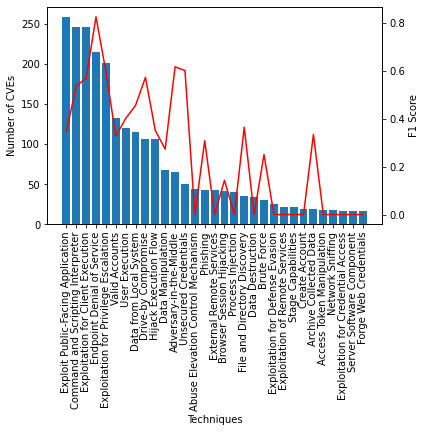

In [ ]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


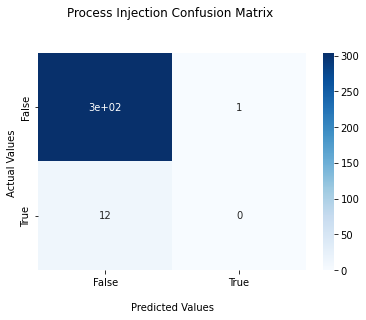

Access Token Manipulation


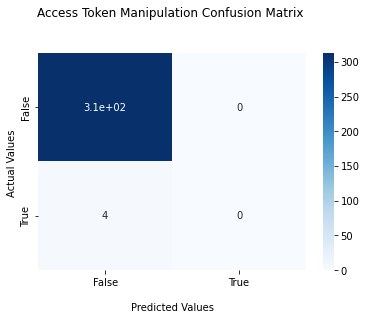

Hijack Execution Flow


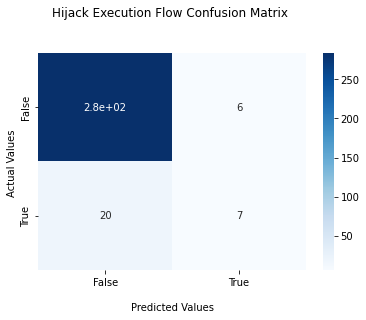

Data from Local System


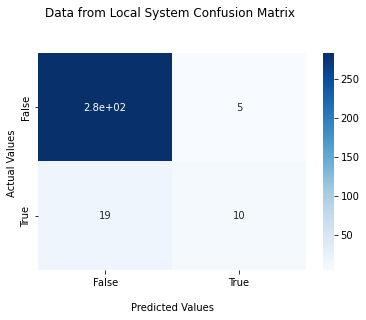

External Remote Services


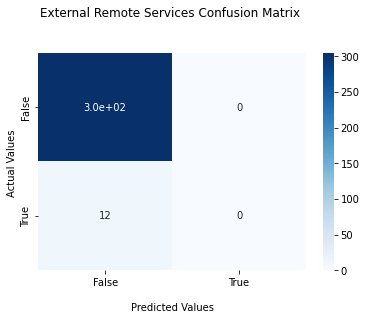

Data Manipulation


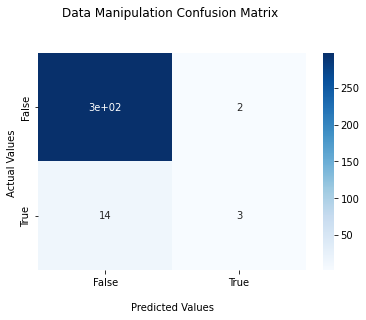

Network Sniffing


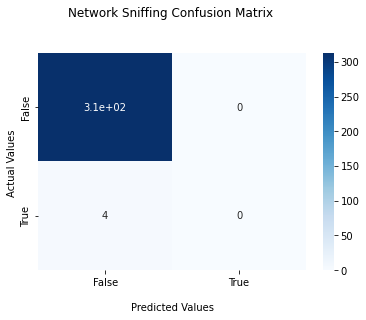

Exploitation for Privilege Escalation


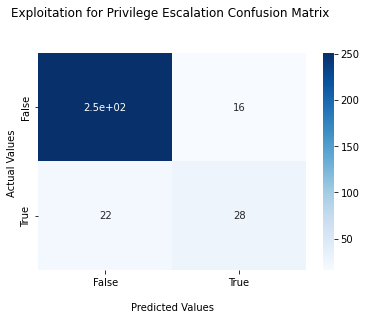

Command and Scripting Interpreter


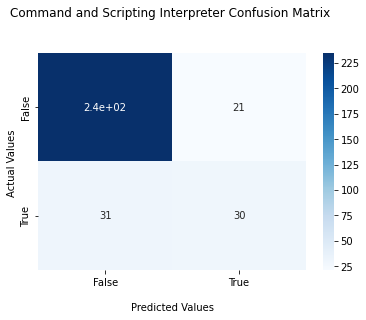

Phishing


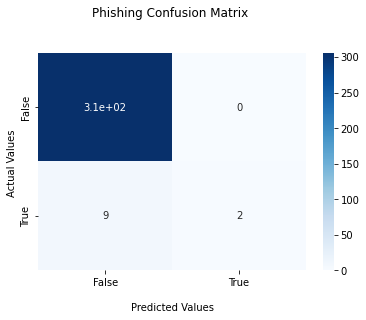

Server Software Component


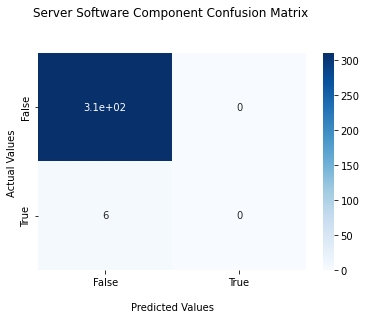

Archive Collected Data


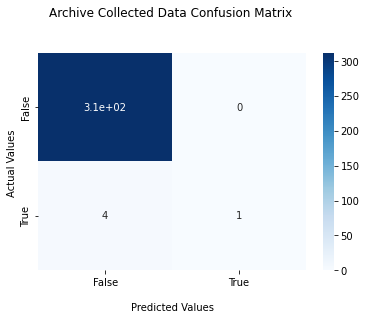

Data Destruction


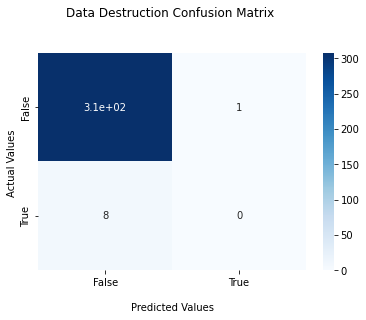

Browser Session Hijacking


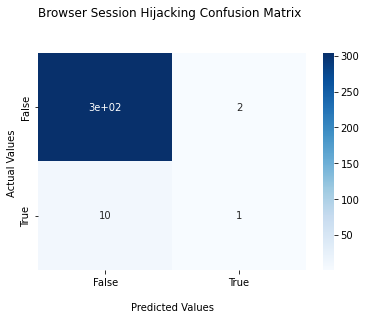

Exploitation for Credential Access


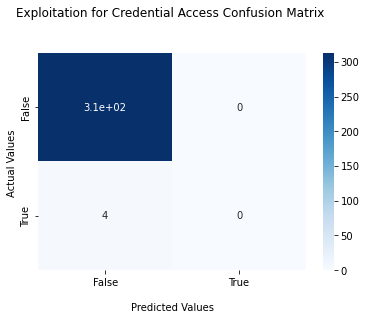

Abuse Elevation Control Mechanism


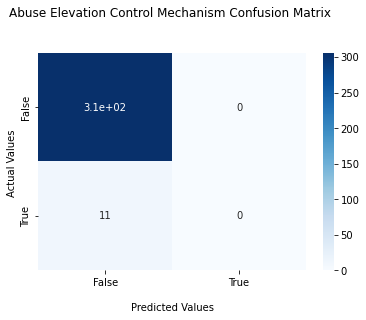

Adversary-in-the-Middle


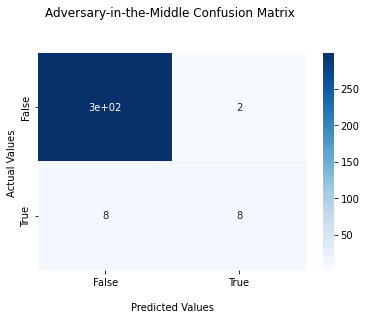

User Execution


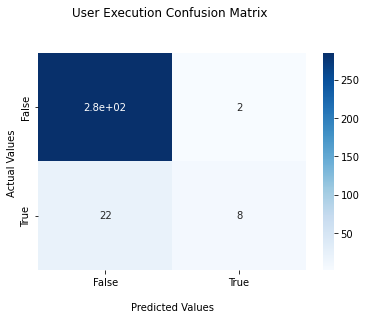

Unsecured Credentials


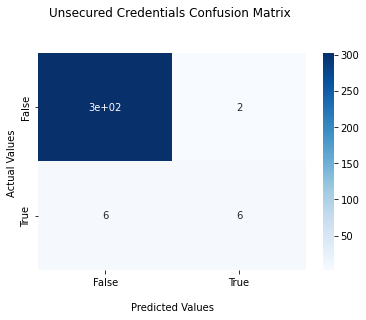

Brute Force


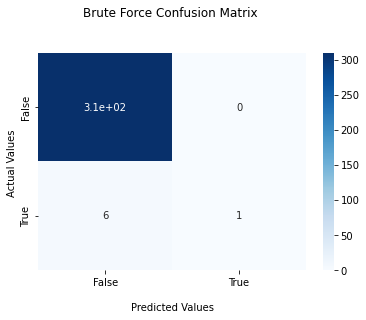

File and Directory Discovery


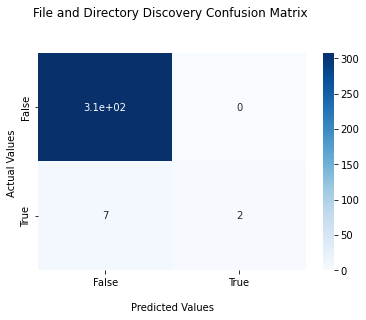

Valid Accounts


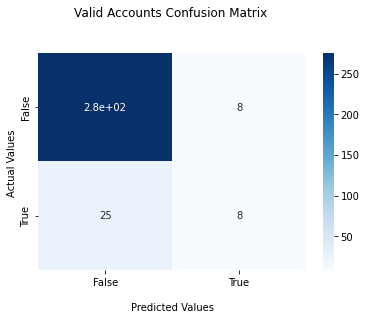

Exploitation for Defense Evasion


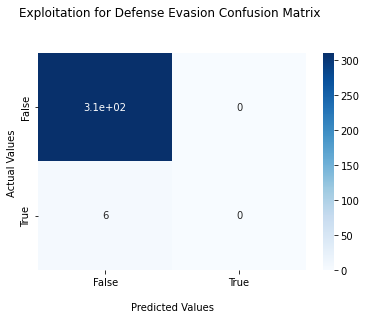

Create Account


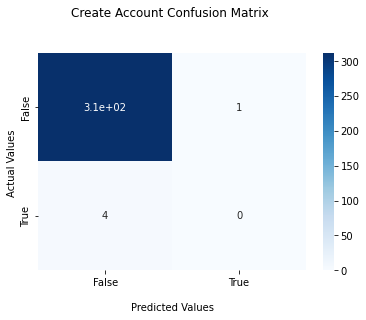

Endpoint Denial of Service


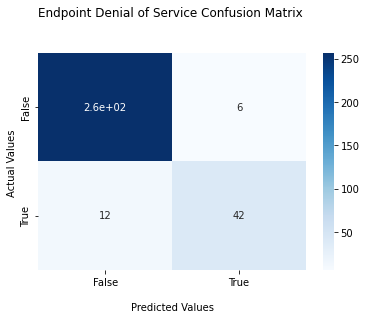

Drive-by Compromise


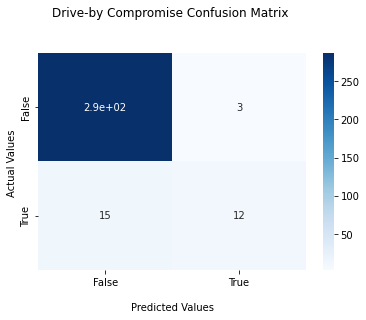

Exploitation for Client Execution


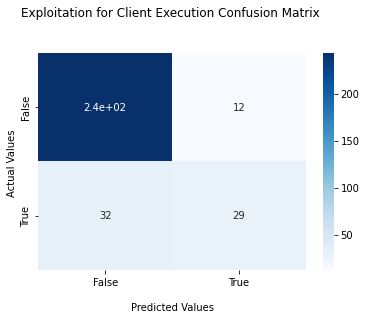

Exploitation of Remote Services


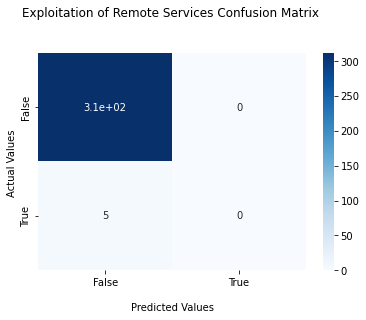

Stage Capabilities


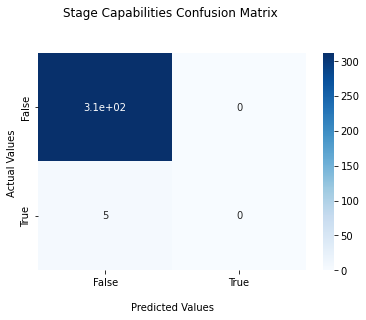

Exploit Public-Facing Application


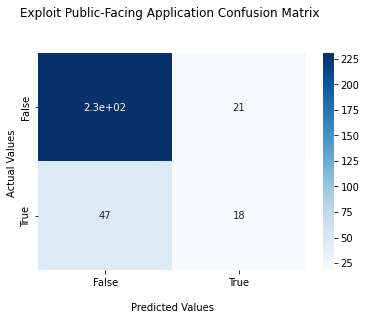

Forge Web Credentials


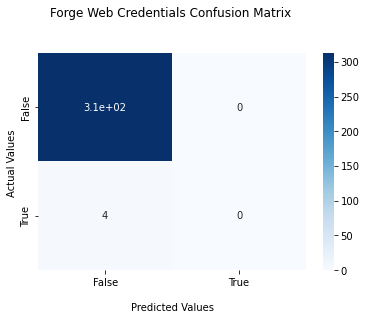

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

# Multi-label SecBERT Extended

## Import

In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train_extended, y_train_extended) = load_data_from_file('final_extended_X_train.csv', 'final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')

from sklearn.model_selection import train_test_split
X_train, dummy_X_test, y_train, dummy_y_test = train_test_split(X_train_extended, y_train_extended, test_size=0.001, random_state=42)

## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

## Model Configuration

In [ ]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'jackaduma/SecBERT'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 512
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 100

config = Config()

Downloading:   0%|          | 0.00/467 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/369k [00:00<?, ?B/s]

In [ ]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        pad_to_max_length=True,
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [ ]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 512])
attention_mask shape: torch.Size([16, 512])
labels shape: torch.Size([16, 31])


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.3)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [ ]:
device = config.DEVICE
device

device(type='cuda')

In [ ]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [ ]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


## Train

In [ ]:
model = Model()
model.to(device);

Downloading:   0%|          | 0.00/321M [00:00<?, ?B/s]

Some weights of the model checkpoint at jackaduma/SecBERT were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.bias', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22952690720558167
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22462119311094284
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2193801611661911
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.2094200795466921


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2193801611661911
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/100: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20244452878832817
Eval Val accuracy: 0.0031545741324921135
Eval Val micro f1 score: 0.016233766233766236


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19311583638191224
Eval Val accuracy: 0.00946372239747634
Eval Val micro f1 score: 0.022690437601296593


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18182353898882866
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.13455657492354742
Training loss: 0.14164791694652717


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18182353898882866
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.13455657492354742
Epoch 1/100: F1 Score 0.13455657492354742
--- Best Model. Val loss: 0.0 -> 0.13455657492354742


Epoch 2:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17527333386242389
Eval Val accuracy: 0.050473186119873815
Eval Val micro f1 score: 0.2215909090909091


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17153230421245097
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.28112449799196787


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1673834901303053
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.3132832080200501
Training loss: 0.09269936842662571


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1673834901303053
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.3132832080200501
Epoch 2/100: F1 Score 0.3132832080200501
--- Best Model. Val loss: 0.13455657492354742 -> 0.3132832080200501


Epoch 3:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.16787984929978847
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.35714285714285715


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.16691426672041415
Eval Val accuracy: 0.06624605678233439
Eval Val micro f1 score: 0.32540675844806005


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1681307390332222
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.3931428571428571
Training loss: 0.06463963102417446


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1681307390332222
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.3931428571428571
Epoch 3/100: F1 Score 0.3931428571428571
--- Best Model. Val loss: 0.3132832080200501 -> 0.3931428571428571


Epoch 4:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.16577207967638968
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4088397790055248


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17014935314655305
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3848797250859107


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1710514184087515
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4344262295081967
Training loss: 0.04752542052945468


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1710514184087515
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4344262295081967
Epoch 4/100: F1 Score 0.4344262295081967
--- Best Model. Val loss: 0.3931428571428571 -> 0.4344262295081967


Epoch 5:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1738892938941717
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.375886524822695


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.1768660694360733
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3609195402298851


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1731766276061535
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.430540827147402
Training loss: 0.03650941844386733


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1731766276061535
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.430540827147402
Epoch 5/100: F1 Score 0.430540827147402


Epoch 6:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1776206474751234
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.42105263157894735


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.1785275187343359
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.4173913043478261


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.175937457382679
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4257112750263435
Training loss: 0.02812920570109798


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.175937457382679
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4257112750263435
Epoch 6/100: F1 Score 0.4257112750263435


Epoch 7:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.178742153942585
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4332281808622503


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17984814420342446
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.438974358974359


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18128437884151935
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4522613065326634
Training loss: 0.022367628472568714


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18128437884151935
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4522613065326634
Epoch 7/100: F1 Score 0.4522613065326634
--- Best Model. Val loss: 0.4344262295081967 -> 0.4522613065326634


Epoch 8:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.18209865279495716
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45010183299389


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18319578357040883
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4523560209424084


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18656223751604556
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4435146443514645
Training loss: 0.018529529015706703


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18656223751604556
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4435146443514645
Epoch 8/100: F1 Score 0.4435146443514645


Epoch 9:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.18510597944259644
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45194274028629855


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18942135907709598
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4460732984293193


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19186312668025493
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.44350580781415
Training loss: 0.015306890771139116


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19186312668025493
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.44350580781415
Epoch 9/100: F1 Score 0.44350580781415


Epoch 10:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19139952771365643
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.45397489539748953


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19480656534433366
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.45512820512820507


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19848502837121487
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42947368421052634
Training loss: 0.012942399419596897


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19848502837121487
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.42947368421052634
Epoch 10/100: F1 Score 0.42947368421052634


Epoch 11:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19934110939502717
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4582043343653251


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19946056976914406
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.44515441959531415


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1981185831129551
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.446961894953656
Training loss: 0.011424488519870601


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1981185831129551
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.446961894953656
Epoch 11/100: F1 Score 0.446961894953656


Epoch 12:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1979449149221182
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.449438202247191


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20219052247703076
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45127118644067793


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.20207410752773286
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47023208879919276
Training loss: 0.009736638046405484


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20207410752773286
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47023208879919276
Epoch 12/100: F1 Score 0.47023208879919276
--- Best Model. Val loss: 0.4522613065326634 -> 0.47023208879919276


Epoch 13:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2055681325495243
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4477611940298507


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20980804786086082
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4518201284796574


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2060939844697714
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.44969199178644764
Training loss: 0.008545833860268503


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2060939844697714
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.44969199178644764
Epoch 13/100: F1 Score 0.44969199178644764


Epoch 14:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20638519674539565
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.466


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21023396626114846
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4421272158498436


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.20985141918063163
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4472573839662447
Training loss: 0.007553209529044024


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20985141918063163
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4472573839662447
Epoch 14/100: F1 Score 0.4472573839662447


Epoch 15:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21135252043604852
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.46265560165975106


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21282162219285966
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.45035823950870013


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21383032016456127
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44927536231884063
Training loss: 0.006903299773359193


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21383032016456127
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44927536231884063
Epoch 15/100: F1 Score 0.44927536231884063


Epoch 16:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21503807418048382
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.45748987854251005


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21391277387738228
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4563206577595067


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2150802120566368
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44893832153690605
Training loss: 0.006264741590197107


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2150802120566368
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44893832153690605
Epoch 16/100: F1 Score 0.44893832153690605


Epoch 17:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2129313737154007
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4676113360323887


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21893958896398544
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4654471544715447


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21931906677782537
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4639175257731959
Training loss: 0.005500836162395215


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21931906677782537
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4639175257731959
Epoch 17/100: F1 Score 0.4639175257731959


Epoch 18:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21937104910612107
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46561886051080553


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22156768590211867
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4544524053224156


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22052388042211532
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46122448979591835
Training loss: 0.00503841640769743


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22052388042211532
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46122448979591835
Epoch 18/100: F1 Score 0.46122448979591835


Epoch 19:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22408584579825402
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.481335952848723


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22455767914652824
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4599375650364204


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22644968330860138
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4648760330578512
Training loss: 0.004731991830018176


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22644968330860138
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4648760330578512
Epoch 19/100: F1 Score 0.4648760330578512


Epoch 20:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22317513078451157
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48269230769230764


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22979256734251977
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.45511482254697283


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2320844829082489
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.458546571136131
Training loss: 0.004265907155638313


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2320844829082489
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.458546571136131
Epoch 20/100: F1 Score 0.458546571136131


Epoch 21:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22948075085878372
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47279920870425324


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23143487200140953
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4623217922606925


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23807355463504792
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4618599791013584
Training loss: 0.003876946445665759


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23807355463504792
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4618599791013584
Epoch 21/100: F1 Score 0.4618599791013584


Epoch 22:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.23213369771838188
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4743083003952569


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23375666923820973
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4753272910372608


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23018618077039718
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4731800766283525
Training loss: 0.0037188671763153927


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23018618077039718
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4731800766283525
Epoch 22/100: F1 Score 0.4731800766283525
--- Best Model. Val loss: 0.47023208879919276 -> 0.4731800766283525


Epoch 23:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.232453753054142
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4772277227722772


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2343473806977272
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4671385237613752


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2342020034790039
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4837758112094396
Training loss: 0.0033592323896751235


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2342020034790039
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4837758112094396
Epoch 23/100: F1 Score 0.4837758112094396
--- Best Model. Val loss: 0.4731800766283525 -> 0.4837758112094396


Epoch 24:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2322932407259941
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49167482859941236


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23939206451177597
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46406570841889117


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23902495056390763
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4593495934959349
Training loss: 0.003017295500679782


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23902495056390763
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4593495934959349
Epoch 24/100: F1 Score 0.4593495934959349


Epoch 25:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2382991075515747
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4760956175298805


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24341343268752097
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.46435845213849286


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23992370814085007
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4803073967339097
Training loss: 0.0027561004271532976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23992370814085007
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4803073967339097
Epoch 25/100: F1 Score 0.4803073967339097


Epoch 26:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24287868663668633
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4729064039408867


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24228139966726303
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.472


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24386109560728073
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4716417910447761
Training loss: 0.002531608228470751


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24386109560728073
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4716417910447761
Epoch 26/100: F1 Score 0.4716417910447761


Epoch 27:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2447221390902996
Eval Val accuracy: 0.1861198738170347
Eval Val micro f1 score: 0.4746772591857001


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24702031761407853
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4711729622266402


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24337184950709342
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47968285431119917
Training loss: 0.002346430040290167


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24337184950709342
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47968285431119917
Epoch 27/100: F1 Score 0.47968285431119917


Epoch 28:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24404338151216506
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4855491329479769


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.25072199255228045
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.46977205153617446


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24857176840305328
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47859922178988323
Training loss: 0.0021162242505007086


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24857176840305328
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47859922178988323
Epoch 28/100: F1 Score 0.47859922178988323


Epoch 29:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2485552065074444
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4772065955383123


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.25342711731791495
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47337278106508873


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.25803526639938357
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.45589692765113976
Training loss: 0.002189868971482908


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.25803526639938357
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.45589692765113976
Epoch 29/100: F1 Score 0.45589692765113976


Epoch 30:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.25559205189347267
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47230320699708456


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.26007104739546777
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47873392680514343


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.25379782617092134
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4685382381413359
Training loss: 0.002174606731942385


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.25379782617092134
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4685382381413359
Epoch 30/100: F1 Score 0.4685382381413359


Epoch 31:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2538194701075554
Eval Val accuracy: 0.1861198738170347
Eval Val micro f1 score: 0.48166501486620417


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2541697323322296
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4720861900097943


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.25903246328234675
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4826254826254826
Training loss: 0.001923366916207267


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.25903246328234675
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4826254826254826
Epoch 31/100: F1 Score 0.4826254826254826


Epoch 32:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2592595383524895
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.47796278158667976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.25859446078538895
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48695652173913045


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.25969218611717226
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48195121951219516
Training loss: 0.001767828723800006


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.25969218611717226
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48195121951219516
Epoch 32/100: F1 Score 0.48195121951219516


Epoch 33:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.26311262995004653
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4786821705426356


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2679100178182125
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4627606752730884


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.263798351585865
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4868549172346641
Training loss: 0.0015384357240240591


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.263798351585865
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4868549172346641
Epoch 33/100: F1 Score 0.4868549172346641
--- Best Model. Val loss: 0.4837758112094396 -> 0.4868549172346641


Epoch 34:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.26393587663769724
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4775828460038986


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.26810312569141387
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4676113360323887


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.26422868221998214
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47115384615384615
Training loss: 0.0014835906448615384


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.26422868221998214
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47115384615384615
Epoch 34/100: F1 Score 0.47115384615384615


Epoch 35:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.26531981602311133
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4876190476190477


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.27185567691922186
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.461851475076297


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.27019897326827047
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4722753346080306
Training loss: 0.0014500122371055516


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.27019897326827047
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4722753346080306
Epoch 35/100: F1 Score 0.4722753346080306


Epoch 36:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2711349368095398
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4765625


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2710720352828503
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4744094488188976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2711974039673805
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4693069306930693
Training loss: 0.0012834713807426377


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2711974039673805
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4693069306930693
Epoch 36/100: F1 Score 0.4693069306930693


Epoch 37:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2709884189069271
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.47434656340755077


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2765079170465469
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4762845849802371


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2766465924680233
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4701348747591522
Training loss: 0.001217152997264144


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2766465924680233
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4701348747591522
Epoch 37/100: F1 Score 0.4701348747591522


Epoch 38:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.27204466685652734
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4822966507177034


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.27558998540043833
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46989141164856857


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.27961891070008277
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47347740667976423
Training loss: 0.0011768237306721985


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.27961891070008277
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47347740667976423
Epoch 38/100: F1 Score 0.47347740667976423


Epoch 39:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.275883312523365
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48638132295719855


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2784040354192257
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4744094488188976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.27559948712587357
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48530805687203793
Training loss: 0.0010814511310412193


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.27559948712587357
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48530805687203793
Epoch 39/100: F1 Score 0.48530805687203793


Epoch 40:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.27948188185691836
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47394296951819076


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.27858777344226837
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4800777453838679


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.27636873051524163
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48137535816618915
Training loss: 0.0009972033118190392


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.27636873051524163
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48137535816618915
Epoch 40/100: F1 Score 0.48137535816618915


Epoch 41:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2787561133503914
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4686595949855352


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.28023637756705283
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4761904761904762


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.27909171804785726
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4780952380952381
Training loss: 0.0009122362371433147


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.27909171804785726
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4780952380952381
Epoch 41/100: F1 Score 0.4780952380952381


Epoch 42:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.285068304091692
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4728682170542636


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2837796837091446
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4822286263208453


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.28761344999074934
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46712463199214915
Training loss: 0.0009514184083235326


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.28761344999074934
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46712463199214915
Epoch 42/100: F1 Score 0.46712463199214915


Epoch 43:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2872432604432106
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48747591522157996


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2851022407412529
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4760975609756098


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2875499501824379
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4975984630163305
Training loss: 0.0009666637112376223


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2875499501824379
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4975984630163305
Epoch 43/100: F1 Score 0.4975984630163305
--- Best Model. Val loss: 0.4868549172346641 -> 0.4975984630163305


Epoch 44:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2877250798046589
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4836223506743738


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2872842840850353
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4791252485089463


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.284173084795475
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48411214953271026
Training loss: 0.00108307622377225


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.284173084795475
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48411214953271026
Epoch 44/100: F1 Score 0.48411214953271026


Epoch 45:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2902419112622738
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4903100775193799


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2911345027387142
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46893787575150303


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.28649394661188127
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48195121951219516
Training loss: 0.0009722291297857254


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.28649394661188127
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48195121951219516
Epoch 45/100: F1 Score 0.48195121951219516


Epoch 46:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2859697438776493
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.29077741503715515
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47731755424063116


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2906735822558403
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4769230769230769
Training loss: 0.0008992040963829042


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2906735822558403
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4769230769230769
Epoch 46/100: F1 Score 0.4769230769230769


Epoch 47:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.29118441268801687
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.49045801526717553


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.29643395096063613
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4789833822091886


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2958233363926411
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48269230769230764
Training loss: 0.0007426374744746497


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2958233363926411
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48269230769230764
Epoch 47/100: F1 Score 0.48269230769230764


Epoch 48:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.29554179683327675
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.46272991287512105


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2955123268067837
Eval Val accuracy: 0.19242902208201892
Eval Val micro f1 score: 0.48195121951219516


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2962428219616413
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48180924287118976
Training loss: 0.0007723566143159482


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2962428219616413
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48180924287118976
Epoch 48/100: F1 Score 0.48180924287118976


Epoch 49:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2962821342051029
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47766990291262135


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3013062968850136
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4736842105263158


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2940051846206188
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47637415621986495
Training loss: 0.0007809657601956937


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2940051846206188
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47637415621986495
Epoch 49/100: F1 Score 0.47637415621986495


Epoch 50:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2950597949326038
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4946859903381643


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2946013011038303
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48560460652591175


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2950945504009724
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4774688398849472
Training loss: 0.00064269940892185


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2950945504009724
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4774688398849472
Epoch 50/100: F1 Score 0.4774688398849472


Epoch 51:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2994132712483406
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48785228377065115


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2930729016661644
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.49021435228331783


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2948135405778885
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48098859315589354
Training loss: 0.0006130535435755696


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2948135405778885
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48098859315589354
Epoch 51/100: F1 Score 0.48098859315589354


Epoch 52:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.29800843968987467
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48086359175662413


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3020241528749466
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.471057884231537


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3070993185043335
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46913580246913583
Training loss: 0.0007838056395984197


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3070993185043335
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.46913580246913583
Epoch 52/100: F1 Score 0.46913580246913583


Epoch 53:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.30364343523979187
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4695481335952849


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3054559797048569
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4769381746810599


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.307616413384676
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4832214765100672
Training loss: 0.0006332337537631536


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.307616413384676
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4832214765100672
Epoch 53/100: F1 Score 0.4832214765100672


Epoch 54:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.30978535711765287
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4624390243902439


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3087961569428444
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4714003944773176


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.30582729950547216
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48571428571428577
Training loss: 0.0007696457706088926


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.30582729950547216
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.48571428571428577
Epoch 54/100: F1 Score 0.48571428571428577


Epoch 55:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3065281495451927
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.481086323957323


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3076103232800961
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47992164544564153


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.30994961112737657
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47684729064039405
Training loss: 0.0006748107144123858


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.30994961112737657
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47684729064039405
Epoch 55/100: F1 Score 0.47684729064039405


Epoch 56:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3092137537896633
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47992164544564153


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.31223148852586746
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.482421875


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3096091389656067
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4790652385589094
Training loss: 0.0005015865688748447


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3096091389656067
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4790652385589094
Epoch 56/100: F1 Score 0.4790652385589094


Epoch 57:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.30978897735476496
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.486905916585839


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3131439007818699
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4762845849802371


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3201175078749657
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4583723105706267
Training loss: 0.0005865380061976817


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3201175078749657
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4583723105706267
Epoch 57/100: F1 Score 0.4583723105706267


Epoch 58:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3132537953555584
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.475266731328807


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.31667359694838526
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4769381746810599


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.31518121883273126
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4816955684007707
Training loss: 0.0005345297656349109


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.31518121883273126
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4816955684007707
Epoch 58/100: F1 Score 0.4816955684007707


Epoch 59:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.317657021433115
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47358121330724073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.31858822107315066
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47105004906771347


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.31587212681770327
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47434656340755077
Training loss: 0.00045047921513746063


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.31587212681770327
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47434656340755077
Epoch 59/100: F1 Score 0.47434656340755077


Epoch 60:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3164011023938656
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4769230769230769


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.31599702313542366
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46899224806201556


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3169963501393795
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4718446601941747
Training loss: 0.00039312283968732204


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3169963501393795
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4718446601941747
Epoch 60/100: F1 Score 0.4718446601941747


Epoch 61:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.317196449637413
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47536231884057967


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3199876517057419
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.46990291262135925


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.31834028512239454
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4826254826254826
Training loss: 0.0003777283038562823


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.31834028512239454
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4826254826254826
Epoch 61/100: F1 Score 0.4826254826254826


Epoch 62:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3188462406396866
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4831568816169393


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.32040417194366455
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4788177339901477


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.31821479871869085
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47930702598652547
Training loss: 0.0003780414187684202


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.31821479871869085
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47930702598652547
Epoch 62/100: F1 Score 0.47930702598652547


Epoch 63:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3196052432060242
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.48069498069498073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3241260960698128
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47326732673267324


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.31965887919068336
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4784688995215311
Training loss: 0.00037618016793090745


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.31965887919068336
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4784688995215311
Epoch 63/100: F1 Score 0.4784688995215311


Epoch 64:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32233110815286636
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4874274661508704


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.32079056575894355
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.48309178743961356


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.32415522038936617
Eval Val accuracy: 0.1861198738170347
Eval Val micro f1 score: 0.47127555988315484
Training loss: 0.0004307183710251939


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.32415522038936617
Eval Val accuracy: 0.1861198738170347
Eval Val micro f1 score: 0.47127555988315484
Epoch 64/100: F1 Score 0.47127555988315484


Epoch 65:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32074247747659684
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47938638542665385


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3222401782870293
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.46923076923076923


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.32383361980319025
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47398843930635837
Training loss: 0.00037681550020352006


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.32383361980319025
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47398843930635837
Epoch 65/100: F1 Score 0.47398843930635837


Epoch 66:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32401175796985626
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4720616570327553


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3264090701937675
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46862745098039216


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3246565379202366
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4741463414634146
Training loss: 0.00033924952171283436


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3246565379202366
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4741463414634146
Epoch 66/100: F1 Score 0.4741463414634146


Epoch 67:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3214988440275192
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47900763358778625


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3281046852469444
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.46896551724137925


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3248945586383343
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4821092278719397
Training loss: 0.00034192567663197715


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3248945586383343
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4821092278719397
Epoch 67/100: F1 Score 0.4821092278719397


Epoch 68:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32427129298448565
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47182425978987586


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.32586165741086004
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4783027965284474


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.330726969987154
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4598825831702544
Training loss: 0.0003565707161818606


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.330726969987154
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4598825831702544
Epoch 68/100: F1 Score 0.4598825831702544


Epoch 69:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32878282442688944
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4719314938154139


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3305835947394371
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4660936007640879


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.329522942006588
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4682080924855492
Training loss: 0.0003393450540060845


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.329522942006588
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4682080924855492
Epoch 69/100: F1 Score 0.4682080924855492


Epoch 70:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.32849272042512895
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4770114942528736


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.32858907207846644
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47001934235976783


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.32827579900622367
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4770114942528736
Training loss: 0.0003347266014058563


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.32827579900622367
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4770114942528736
Epoch 70/100: F1 Score 0.4770114942528736


Epoch 71:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3277750127017498
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48000000000000004


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.32995975762605667
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.4792270531400966


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3295935720205307
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4806201550387597
Training loss: 0.0002927379862949318


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3295935720205307
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4806201550387597
Epoch 71/100: F1 Score 0.4806201550387597


Epoch 72:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.33277965784072877
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47424684159378033


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.33086395636200905
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47470817120622566


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3338233567774296
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.46841593780369284
Training loss: 0.0002987469154754159


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3338233567774296
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.46841593780369284
Epoch 72/100: F1 Score 0.46841593780369284


Epoch 73:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3327831357717514
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48269230769230764


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3342188932001591
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.471624266144814


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3337177887558937
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4788461538461538
Training loss: 0.0003003313219368167


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3337177887558937
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4788461538461538
Epoch 73/100: F1 Score 0.4788461538461538


Epoch 74:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.33535947650671005
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4701348747591522


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3366071216762066
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4675072744907856


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33642953634262085
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.476280834914611
Training loss: 0.00028613200801719843


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33642953634262085
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.476280834914611
Epoch 74/100: F1 Score 0.476280834914611


Epoch 75:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.336539426445961
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4723809523809524


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3382645696401596
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47444551591128253


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33710977286100385
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4720616570327553
Training loss: 0.00026592890974350554


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33710977286100385
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4720616570327553
Epoch 75/100: F1 Score 0.4720616570327553


Epoch 76:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3390951529145241
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4728682170542636


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34016607627272605
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47358121330724073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33848323971033095
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47388781431334626
Training loss: 0.0002535200620731246


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33848323971033095
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47388781431334626
Epoch 76/100: F1 Score 0.47388781431334626


Epoch 77:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.33776126205921175
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.483349191246432


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3386189453303814
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.481086323957323


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.337732794880867
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47859922178988323
Training loss: 0.00025246657787647564


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.337732794880867
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47859922178988323
Epoch 77/100: F1 Score 0.47859922178988323


Epoch 78:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.33766940981149673
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4803073967339097


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.33822528421878817
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4836223506743738


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33979679420590403
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4803073967339097
Training loss: 0.0002478979683063401


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33979679420590403
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4803073967339097
Epoch 78/100: F1 Score 0.4803073967339097


Epoch 79:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3373122937977314
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4822286263208453


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.33842997848987577
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4773820981713185


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33993807137012483
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47434656340755077
Training loss: 0.00023964282194259619


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33993807137012483
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.47434656340755077
Epoch 79/100: F1 Score 0.47434656340755077


Epoch 80:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3395082764327526
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.48084291187739464


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.33856607526540755
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4780952380952381


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3402914360165596
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.46841593780369284
Training loss: 0.00024567669854665266


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3402914360165596
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.46841593780369284
Epoch 80/100: F1 Score 0.46841593780369284


Epoch 81:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3379685580730438
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4789272030651341


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3381425753235817
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4768339768339768


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.33865448012948035
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47876447876447875
Training loss: 0.00024006513885335186


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.33865448012948035
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47876447876447875
Epoch 81/100: F1 Score 0.47876447876447875


Epoch 82:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3416162967681885
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.49092645654250233


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3420513190329075
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47938638542665385


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3390752151608467
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4872037914691943
Training loss: 0.0002717220278559057


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3390752151608467
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4872037914691943
Epoch 82/100: F1 Score 0.4872037914691943


Epoch 83:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3375693611800671
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48571428571428577


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.33971423730254174
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4938967136150235


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34042910039424895
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.483349191246432
Training loss: 0.0002644241636372233


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34042910039424895
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.483349191246432
Epoch 83/100: F1 Score 0.483349191246432


Epoch 84:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3412857450544834
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4880382775119617


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34191224724054337
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4846743295019157


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3427578695118427
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48101265822784817
Training loss: 0.0002306227326328481


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3427578695118427
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48101265822784817
Epoch 84/100: F1 Score 0.48101265822784817


Epoch 85:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3424860365688801
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4800777453838679


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3413568466901779
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.47572815533980584


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34331459626555444
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.478134110787172
Training loss: 0.00023225818568363115


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34331459626555444
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.478134110787172
Epoch 85/100: F1 Score 0.478134110787172


Epoch 86:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34235368147492407
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4850818094321463


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3432637147605419
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4835589941972921


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34278943985700605
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4836852207293666
Training loss: 0.00023166313710448896


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34278943985700605
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4836852207293666
Epoch 86/100: F1 Score 0.4836852207293666


Epoch 87:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.343948719650507
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4797687861271676


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3436640381813049
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4846743295019157


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3425993397831917
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48565965583174
Training loss: 0.00022181385994589562


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3425993397831917
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48565965583174
Epoch 87/100: F1 Score 0.48565965583174


Epoch 88:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34235058501362803
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49092645654250233


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3438090316951275
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48995215311004775


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3430325359106064
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4847328244274809
Training loss: 0.00021269199080647803


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3430325359106064
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4847328244274809
Epoch 88/100: F1 Score 0.4847328244274809


Epoch 89:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34480881989002227
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4836223506743738


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34507484585046766
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.47930702598652547


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34425563663244246
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48612440191387557
Training loss: 0.00021518610870304407


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34425563663244246
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48612440191387557
Epoch 89/100: F1 Score 0.48612440191387557


Epoch 90:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3453419074416161
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49132947976878616


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3458361759781837
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48888888888888893


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3455661483108997
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49136276391554695
Training loss: 0.00019836220240276574


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3455661483108997
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49136276391554695
Epoch 90/100: F1 Score 0.49136276391554695


Epoch 91:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3465870305895805
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4840887174541948


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34672508388757706
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4811594202898551


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34627159386873246
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4807692307692308
Training loss: 0.0001973408101210515


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34627159386873246
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4807692307692308
Epoch 91/100: F1 Score 0.4807692307692308


Epoch 92:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34544358775019646
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4876190476190477


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3464301198720932
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4836223506743738


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3461658231914043
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48659003831417624
Training loss: 0.00020732862420085987


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3461658231914043
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48659003831417624
Epoch 92/100: F1 Score 0.48659003831417624


Epoch 93:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3466428279876709
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4831568816169393


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34598519653081894
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4822286263208453


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3455065190792084
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48374760994263866
Training loss: 0.0001858186015022962


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3455065190792084
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48374760994263866
Epoch 93/100: F1 Score 0.48374760994263866


Epoch 94:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.346207619458437
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48565965583174


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3472127512097359
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4860710854947166


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34703419059515
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4846743295019157
Training loss: 0.00018943649077871958


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34703419059515
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4846743295019157
Epoch 94/100: F1 Score 0.4846743295019157


Epoch 95:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3466777250170708
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48659003831417624


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3475411616265774
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4875717017208413


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3476218104362488
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4870565675934803
Training loss: 0.00019011716644894703


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3476218104362488
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4870565675934803
Epoch 95/100: F1 Score 0.4870565675934803


Epoch 96:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34748619645833967
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.484149855907781


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34688167050480845
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.34680773317813873
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48565965583174
Training loss: 0.00020011060233281997


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.34680773317813873
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48565965583174
Epoch 96/100: F1 Score 0.48565965583174


Epoch 97:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.3468563862144947
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4890162368672398


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34779845997691156
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48659003831417624


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3480016805231571
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48897411313518707
Training loss: 0.00018584356363875632


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3480016805231571
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48897411313518707
Epoch 97/100: F1 Score 0.48897411313518707


Epoch 98:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.34794624969363214
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48897411313518707


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.3483590312302113
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48752399232245675


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3484715215861797
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4879923150816522
Training loss: 0.0001816657532855922


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3484715215861797
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4879923150816522
Epoch 98/100: F1 Score 0.4879923150816522


Epoch 99:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.348451816290617
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.34841366186738015
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.3484023526310921
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803
Training loss: 0.00018037295102763022


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.3484023526310921
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4870565675934803
Epoch 99/100: F1 Score 0.4870565675934803


## Test

In [ ]:

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


In [ ]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [ ]:
test_pred = predict(best_model)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 1., 0., 0., 0., 0.],
      dtype=float32)

In [ ]:
print(accuracy_score(y_test.values, test_pred))

0.1829652996845426


In [ ]:
pd.set_option('display.max_columns', None)
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Drive-by Compromise,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,User Execution,Unsecured Credentials,Data Manipulation,Server Software Component,Hijack Execution Flow,File and Directory Discovery,Exploit Public-Facing Application,Phishing,Archive Collected Data,Access Token Manipulation,Valid Accounts,Data from Local System,Browser Session Hijacking,Exploitation for Defense Evasion
0,0.807339,0.68,0.612245,0.592593,0.585366,0.581818,0.545455,0.526316,0.454545,0.444444,0.428571,0.428571,0.409836,0.4,0.333333,0.333333,0.326531,0.326531,0.3,0.25


In [ ]:
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 25)

,Endpoint Denial of Service,Exploitation for Privilege Escalation,Drive-by Compromise,Adversary-in-the-Middle,Command and Scripting Interpreter,Exploitation for Client Execution,User Execution,Unsecured Credentials,Data Manipulation,Server Software Component,Hijack Execution Flow,File and Directory Discovery,Exploit Public-Facing Application,Phishing,Archive Collected Data,Access Token Manipulation,Valid Accounts,Data from Local System,Browser Session Hijacking,Exploitation for Defense Evasion,Brute Force,Process Injection,Stage Capabilities,Exploitation of Remote Services,Abuse Elevation Control Mechanism
0,0.807339,0.68,0.612245,0.592593,0.585366,0.581818,0.545455,0.526316,0.454545,0.444444,0.428571,0.428571,0.409836,0.4,0.333333,0.333333,0.326531,0.326531,0.3,0.25,0.222222,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Endpoint Denial of Service,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Drive-by Compromise,Exploitation for Client Execution,User Execution,Adversary-in-the-Middle,Unsecured Credentials,Exploit Public-Facing Application,Server Software Component,Hijack Execution Flow,File and Directory Discovery,Data Manipulation,Data from Local System,Phishing,Browser Session Hijacking,Access Token Manipulation,Valid Accounts,Archive Collected Data,Exploitation for Defense Evasion
0,0.814815,0.68,0.590164,0.555556,0.52459,0.5,0.5,0.416667,0.384615,0.333333,0.333333,0.333333,0.294118,0.275862,0.272727,0.272727,0.25,0.242424,0.2,0.166667


In [ ]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Data Manipulation,Archive Collected Data,Endpoint Denial of Service,Phishing,Adversary-in-the-Middle,Unsecured Credentials,Drive-by Compromise,Exploitation for Privilege Escalation,Server Software Component,Exploitation for Client Execution,User Execution,Hijack Execution Flow,File and Directory Discovery,Command and Scripting Interpreter,Valid Accounts,Exploitation for Defense Evasion,Access Token Manipulation,Brute Force,Exploit Public-Facing Application,Data from Local System
0,1.0,1.0,0.8,0.75,0.727273,0.714286,0.681818,0.68,0.666667,0.653061,0.6,0.6,0.6,0.580645,0.5,0.5,0.5,0.5,0.438596,0.4


In [ ]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.4654891550861546


In [ ]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.4245901639344262


In [ ]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5470465758130516


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


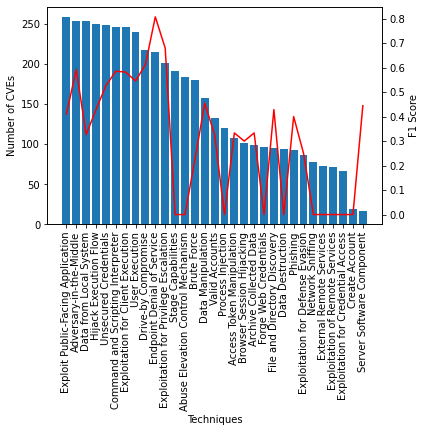

In [ ]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


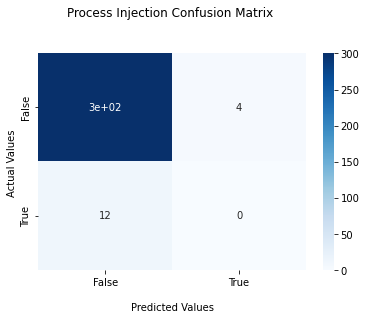

Access Token Manipulation


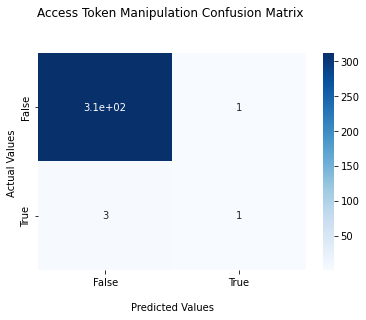

Hijack Execution Flow


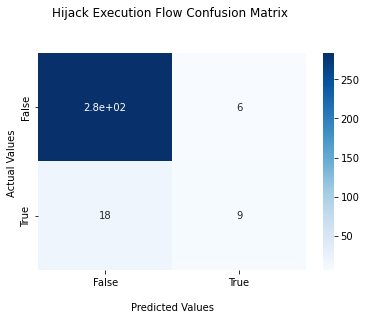

Data from Local System


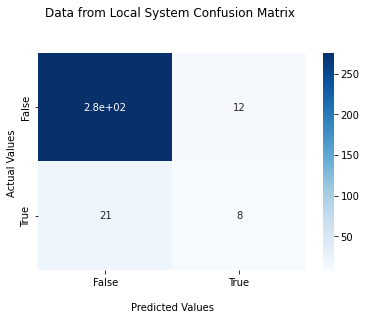

External Remote Services


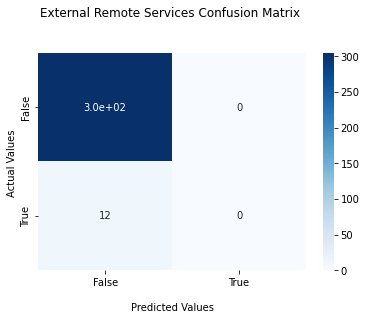

Data Manipulation


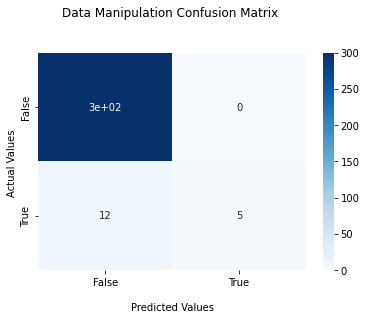

Network Sniffing


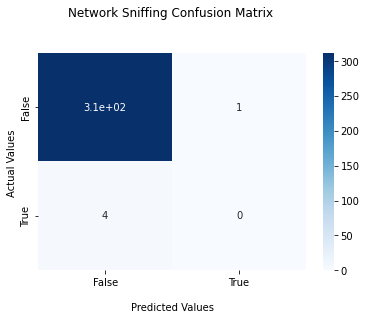

Exploitation for Privilege Escalation


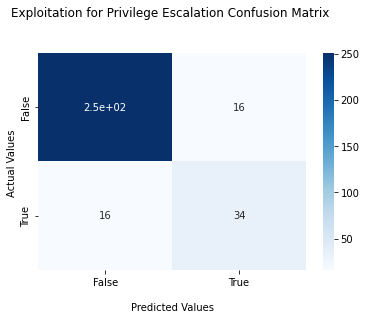

Command and Scripting Interpreter


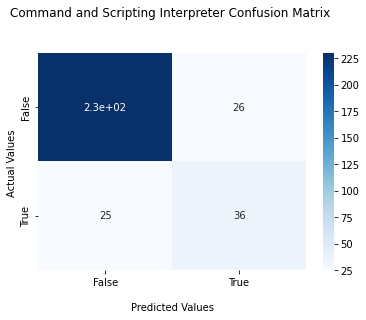

Phishing


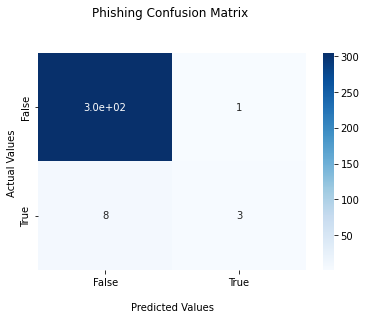

Server Software Component


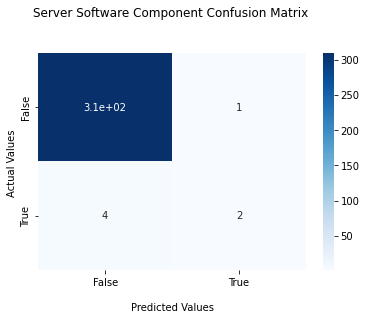

Archive Collected Data


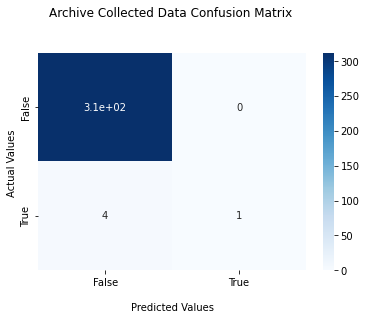

Data Destruction


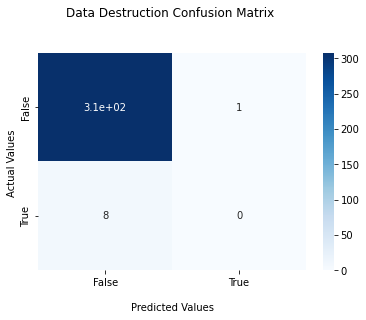

Browser Session Hijacking


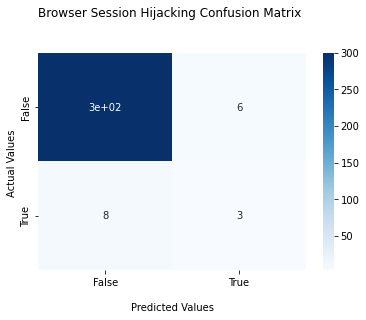

Exploitation for Credential Access


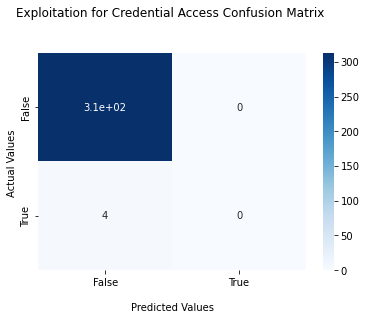

Abuse Elevation Control Mechanism


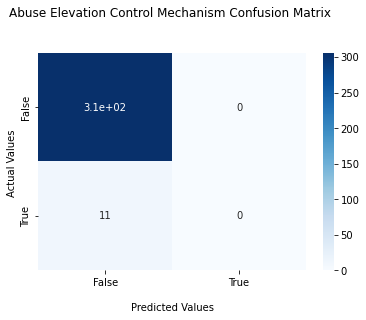

Adversary-in-the-Middle


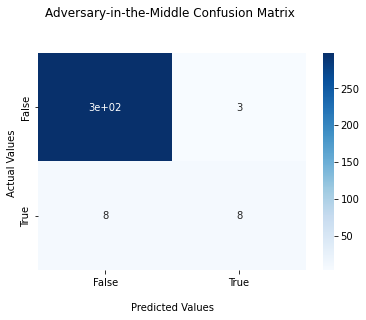

User Execution


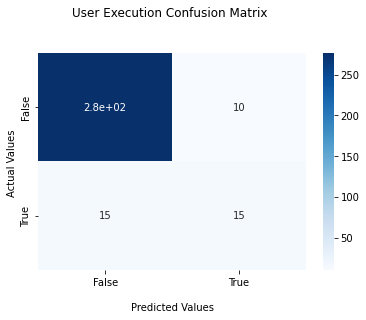

Unsecured Credentials


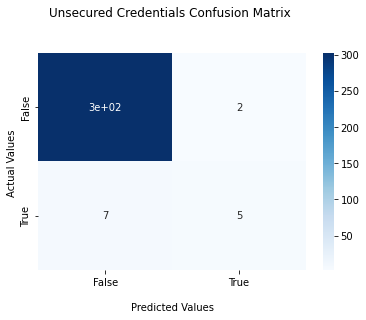

Brute Force


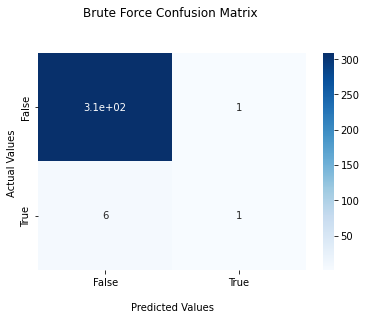

File and Directory Discovery


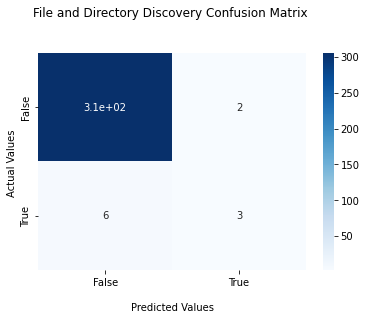

Valid Accounts


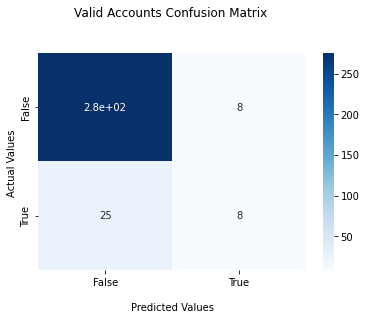

Exploitation for Defense Evasion


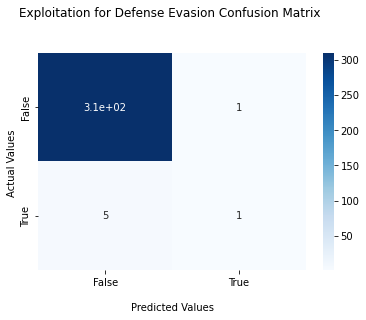

Create Account


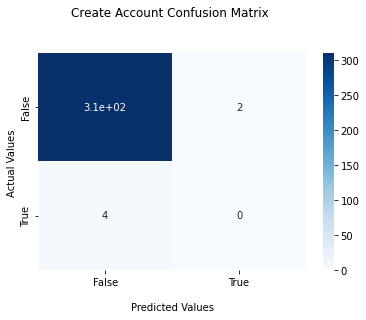

Endpoint Denial of Service


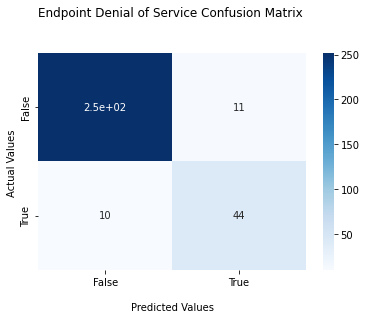

Drive-by Compromise


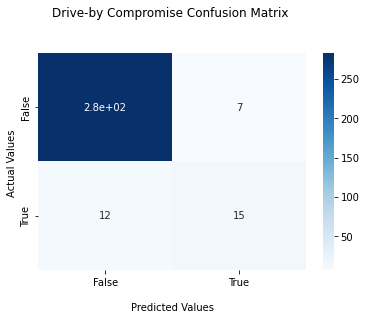

Exploitation for Client Execution


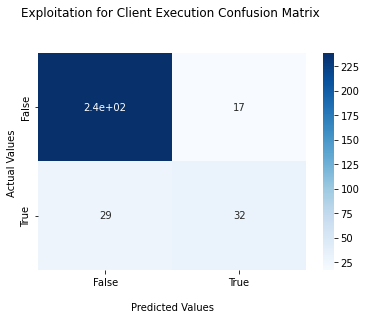

Exploitation of Remote Services


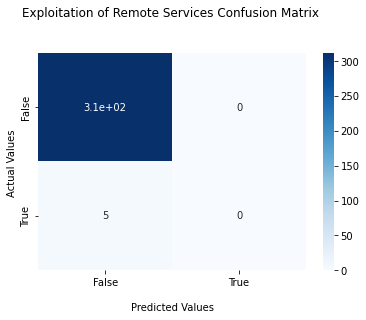

Stage Capabilities


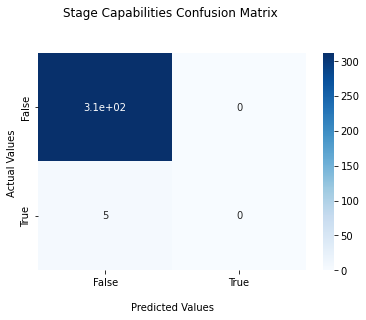

Exploit Public-Facing Application


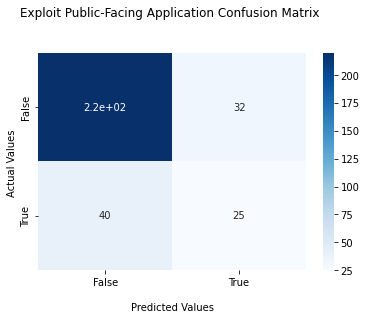

Forge Web Credentials


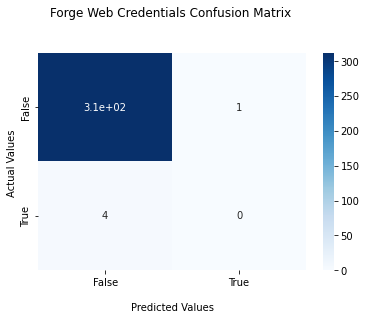

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

# Multi-label SciBERT

## Imports

In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train, y_train) = load_data_from_file('X_train.csv', 'y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')



## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

## Model Configuration

In [ ]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'allenai/scibert_scivocab_uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 320
    self.BATCH_SIZE = 32
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

Downloading:   0%|          | 0.00/385 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/223k [00:00<?, ?B/s]

In [ ]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        pad_to_max_length=True,
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [ ]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([32, 320])
attention_mask shape: torch.Size([32, 320])
labels shape: torch.Size([32, 31])


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [ ]:
device = config.DEVICE
device

device(type='cuda')

In [ ]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [ ]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


## Train

In [ ]:
model = Model()
model.to(device);

Downloading:   0%|          | 0.00/422M [00:00<?, ?B/s]

Some weights of the model checkpoint at allenai/scibert_scivocab_uncased were not used when initializing BertModel: ['cls.predictions.bias', 'cls.predictions.decoder.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.bias', 'cls.predictions.decoder.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.3623142182826996
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.28648974895477297
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.25519861429929735
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.3772957227950872


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.25519861429929735
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.23480092287063598
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.22547174096107483
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2189068853855133
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.23803691392721132


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2189068853855133
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 1/50: F1 Score 0.0


Epoch 2:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.21551762223243714
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.212785741686821
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.21192208528518677
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21632145171941713


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21192208528518677
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 2/50: F1 Score 0.0


Epoch 3:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20993794798851012
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2089607834815979
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.20795270204544067
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.2100537218326746


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20795270204544067
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 3/50: F1 Score 0.0


Epoch 4:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20756054371595384
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.2069128632545471
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2063232809305191
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20603410345177317


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2063232809305191
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 4/50: F1 Score 0.0


Epoch 5:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20591841638088226
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.20457765311002732
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2062458500266075
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.20244482090306837


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2062458500266075
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 5/50: F1 Score 0.0


Epoch 6:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.20276088267564774
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.20220700055360794
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.2000965431332588
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.19985209682653116


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2000965431332588
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 6/50: F1 Score 0.0


Epoch 7:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.19718618243932723
Eval Val accuracy: 0.00946372239747634
Eval Val micro f1 score: 0.05678233438485805


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.19796185493469237
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.19587795734405516
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.003257328990228013
Training loss: 0.19276643457800843


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19587795734405516
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.003257328990228013
Epoch 7/50: F1 Score 0.003257328990228013
--- Best Model. Val loss: 0.0 -> 0.003257328990228013


Epoch 8:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.19297178089618683
Eval Val accuracy: 0.028391167192429023
Eval Val micro f1 score: 0.1187214611872146


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1937033548951149
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0032733224222585926


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.19157745987176894
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.025477707006369428
Training loss: 0.18771834671497345


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19157745987176894
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.025477707006369428
Epoch 8/50: F1 Score 0.025477707006369428
--- Best Model. Val loss: 0.003257328990228013 -> 0.025477707006369428


Epoch 9:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18948520869016647
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.18759018759018758


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18841533362865448
Eval Val accuracy: 0.031545741324921134
Eval Val micro f1 score: 0.13834586466165413


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1859989881515503
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.16764705882352943
Training loss: 0.1808794539335162


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1859989881515503
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.16764705882352943
Epoch 9/50: F1 Score 0.16764705882352943
--- Best Model. Val loss: 0.025477707006369428 -> 0.16764705882352943


Epoch 10:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18850167989730834
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.21853388658367914


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18460434228181838
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.1956834532374101


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1844392165541649
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.1826086956521739
Training loss: 0.17428210897501126


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1844392165541649
Eval Val accuracy: 0.03785488958990536
Eval Val micro f1 score: 0.1826086956521739
Epoch 10/50: F1 Score 0.1826086956521739
--- Best Model. Val loss: 0.16764705882352943 -> 0.1826086956521739


Epoch 11:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.18243859559297562
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.19714285714285712


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18380103409290313
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.19061166429587484


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.18063707202672957
Eval Val accuracy: 0.050473186119873815
Eval Val micro f1 score: 0.23743016759776536
Training loss: 0.16706606485815936


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18063707202672957
Eval Val accuracy: 0.050473186119873815
Eval Val micro f1 score: 0.23743016759776536
Epoch 11/50: F1 Score 0.23743016759776536
--- Best Model. Val loss: 0.1826086956521739 -> 0.23743016759776536


Epoch 12:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17964771538972854
Eval Val accuracy: 0.04100946372239748
Eval Val micro f1 score: 0.18867924528301885


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1857228845357895
Eval Val accuracy: 0.050473186119873815
Eval Val micro f1 score: 0.20170454545454547


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17855544984340668
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.22777777777777775
Training loss: 0.16316320833771727


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17855544984340668
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.22777777777777775
Epoch 12/50: F1 Score 0.22777777777777775


Epoch 13:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17764935940504073
Eval Val accuracy: 0.05362776025236593
Eval Val micro f1 score: 0.23287671232876714


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.18014603555202485
Eval Val accuracy: 0.0694006309148265
Eval Val micro f1 score: 0.2425876010781671


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.17969142496585847
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.25906735751295334
Training loss: 0.15537872945153436


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17969142496585847
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.25906735751295334
Epoch 13/50: F1 Score 0.25906735751295334
--- Best Model. Val loss: 0.23743016759776536 -> 0.25906735751295334


Epoch 14:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.176005782186985
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.26273458445040215


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.17354635149240494
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2718707940780619


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1717790499329567
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.2815405046480744
Training loss: 0.15137734870577968


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1717790499329567
Eval Val accuracy: 0.06309148264984227
Eval Val micro f1 score: 0.2815405046480744
Epoch 14/50: F1 Score 0.2815405046480744
--- Best Model. Val loss: 0.25906735751295334 -> 0.2815405046480744


Epoch 15:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1711318925023079
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.2554945054945055


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16958275437355042
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.3274111675126904


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16988938450813293
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.27844712182061576
Training loss: 0.14178427534047947


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16988938450813293
Eval Val accuracy: 0.07255520504731862
Eval Val micro f1 score: 0.27844712182061576
Epoch 15/50: F1 Score 0.27844712182061576


Epoch 16:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.17165380120277404
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.2661290322580645


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16828130483627318
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3510506798516687


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16694771200418473
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3010471204188482
Training loss: 0.13330588212539984


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16694771200418473
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3010471204188482
Epoch 16/50: F1 Score 0.3010471204188482
--- Best Model. Val loss: 0.2815405046480744 -> 0.3010471204188482


Epoch 17:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16682456731796264
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.32575757575757575


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16770201176404953
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.34068627450980393


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16600206419825553
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.336283185840708
Training loss: 0.12568363772575245


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16600206419825553
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.336283185840708
Epoch 17/50: F1 Score 0.336283185840708
--- Best Model. Val loss: 0.3010471204188482 -> 0.336283185840708


Epoch 18:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16838645339012145
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.34782608695652173


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.168312905728817
Eval Val accuracy: 0.07886435331230283
Eval Val micro f1 score: 0.3329253365973072


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1683933764696121
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.33251231527093594
Training loss: 0.11925888286773549


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1683933764696121
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.33251231527093594
Epoch 18/50: F1 Score 0.33251231527093594


Epoch 19:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16625256836414337
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.36900369003690037


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.166310815513134
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.351219512195122


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16622257009148597
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.33082706766917297
Training loss: 0.11412378729775895


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16622257009148597
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.33082706766917297
Epoch 19/50: F1 Score 0.33082706766917297


Epoch 20:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16870315968990326
Eval Val accuracy: 0.0914826498422713
Eval Val micro f1 score: 0.3892145369284877


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16801023930311204
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3655413271245635


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16688700690865516
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.35092024539877303
Training loss: 0.11083116763552954


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16688700690865516
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.35092024539877303
Epoch 20/50: F1 Score 0.35092024539877303
--- Best Model. Val loss: 0.336283185840708 -> 0.35092024539877303


Epoch 21:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1673167899250984
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.4123006833712984


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1655778855085373
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.35409035409035405


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16531076207756995
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.36823104693140796
Training loss: 0.10410284666821014


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16531076207756995
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.36823104693140796
Epoch 21/50: F1 Score 0.36823104693140796
--- Best Model. Val loss: 0.35092024539877303 -> 0.36823104693140796


Epoch 22:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16465285420417786
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.4004550625711035


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1657357782125473
Eval Val accuracy: 0.0946372239747634
Eval Val micro f1 score: 0.36077481840193704


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16506656631827354
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.36363636363636365
Training loss: 0.09932806585417238


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16506656631827354
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.36363636363636365
Epoch 22/50: F1 Score 0.36363636363636365


Epoch 23:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16381917744874955
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.4


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16785262227058412
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3727598566308244


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16556061431765556
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.36077481840193704
Training loss: 0.09536162477939628


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16556061431765556
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.36077481840193704
Epoch 23/50: F1 Score 0.36077481840193704


Epoch 24:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16350314840674401
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40877598152424943


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16858416348695754
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.3722025912838634


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16485930904746054
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.380499405469679
Training loss: 0.09093801789852075


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16485930904746054
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.380499405469679
Epoch 24/50: F1 Score 0.380499405469679
--- Best Model. Val loss: 0.36823104693140796 -> 0.380499405469679


Epoch 25:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16532197296619416
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4096109839816934


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1683407112956047
Eval Val accuracy: 0.08832807570977919
Eval Val micro f1 score: 0.38426966292134834


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16527653560042382
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3548387096774194
Training loss: 0.08737450890069784


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16527653560042382
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.3548387096774194
Epoch 25/50: F1 Score 0.3548387096774194


Epoch 26:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16441420391201972
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4153498871331829


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.167859810590744
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.40130861504907306


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16672885343432425
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3705521472392638
Training loss: 0.08369614261873932


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16672885343432425
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.3705521472392638
Epoch 26/50: F1 Score 0.3705521472392638


Epoch 27:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16511169746518134
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4167585446527012


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.168924580514431
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3893805309734514


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1686300218105316
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.33877038895859474
Training loss: 0.08061921241325001


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1686300218105316
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.33877038895859474
Epoch 27/50: F1 Score 0.33877038895859474


Epoch 28:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16442523747682572
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43784378437843785


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16709897369146348
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4170403587443946


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16672986075282098
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37153196622436674
Training loss: 0.07877755433667538


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16672986075282098
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37153196622436674
Epoch 28/50: F1 Score 0.37153196622436674


Epoch 29:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16318167820572854
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.42872928176795577


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16878270357847214
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42116630669546434


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16647445484995843
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37214885954381755
Training loss: 0.07598571999128474


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16647445484995843
Eval Val accuracy: 0.11041009463722397
Eval Val micro f1 score: 0.37214885954381755
Epoch 29/50: F1 Score 0.37214885954381755


Epoch 30:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1636123053729534
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43018018018018017


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16902491599321365
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.4129032258064516


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1654345765709877
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3842482100238664
Training loss: 0.07436270128155864


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1654345765709877
Eval Val accuracy: 0.10094637223974763
Eval Val micro f1 score: 0.3842482100238664
Epoch 30/50: F1 Score 0.3842482100238664
--- Best Model. Val loss: 0.380499405469679 -> 0.3842482100238664


Epoch 31:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16440093964338304
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.41855203619909503


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.171314936876297
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4281217208814271


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1650927521288395
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3967136150234742
Training loss: 0.07239725198163542


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1650927521288395
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.3967136150234742
Epoch 31/50: F1 Score 0.3967136150234742
--- Best Model. Val loss: 0.3842482100238664 -> 0.3967136150234742


Epoch 32:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16485414505004883
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42033898305084744


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1698252722620964
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.448559670781893


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16620897948741914
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3836930455635492
Training loss: 0.0703135033159755


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16620897948741914
Eval Val accuracy: 0.1167192429022082
Eval Val micro f1 score: 0.3836930455635492
Epoch 32/50: F1 Score 0.3836930455635492


Epoch 33:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1636759750545025
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.41552511415525123


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16738396286964416
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4560327198364008


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16542405784130096
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.39859320046893315
Training loss: 0.06806460239512976


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16542405784130096
Eval Val accuracy: 0.10725552050473186
Eval Val micro f1 score: 0.39859320046893315
Epoch 33/50: F1 Score 0.39859320046893315
--- Best Model. Val loss: 0.3967136150234742 -> 0.39859320046893315


Epoch 34:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16315371915698051
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4187643020594966


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16885877400636673
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4524053224155578


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16491056680679322
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.40736478711162255
Training loss: 0.06718683745278868


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16491056680679322
Eval Val accuracy: 0.11356466876971609
Eval Val micro f1 score: 0.40736478711162255
Epoch 34/50: F1 Score 0.40736478711162255
--- Best Model. Val loss: 0.39859320046893315 -> 0.40736478711162255


Epoch 35:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16473650112748145
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.4036697247706423


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16772671788930893
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44999999999999996


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16351815611124038
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.42464246424642466
Training loss: 0.06573795405931251


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16351815611124038
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.42464246424642466
Epoch 35/50: F1 Score 0.42464246424642466
--- Best Model. Val loss: 0.40736478711162255 -> 0.42464246424642466


Epoch 36:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16496059522032738
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.40281030444964877


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16542264223098754
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4556962025316456


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1654929056763649
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4330794341675735
Training loss: 0.06405870677080265


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1654929056763649
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4330794341675735
Epoch 36/50: F1 Score 0.4330794341675735
--- Best Model. Val loss: 0.42464246424642466 -> 0.4330794341675735


Epoch 37:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1648234136402607
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.40792540792540793


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16521372497081757
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.45744680851063835


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16801089197397232
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4403866809881847
Training loss: 0.06191270291631998


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16801089197397232
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4403866809881847
Epoch 37/50: F1 Score 0.4403866809881847
--- Best Model. Val loss: 0.4330794341675735 -> 0.4403866809881847


Epoch 38:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16459113731980324
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.4106113033448674


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16354431435465813
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44346871569703616


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16942978501319886
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4402116402116402
Training loss: 0.06119577240112216


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16942978501319886
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4402116402116402
Epoch 38/50: F1 Score 0.4402116402116402


Epoch 39:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1644860826432705
Eval Val accuracy: 0.12618296529968454
Eval Val micro f1 score: 0.41379310344827586


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16337125450372697
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4390243902439025


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1673082560300827
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.43478260869565216
Training loss: 0.06018682439313378


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1673082560300827
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.43478260869565216
Epoch 39/50: F1 Score 0.43478260869565216


Epoch 40:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16443645283579827
Eval Val accuracy: 0.12933753943217666
Eval Val micro f1 score: 0.42259887005649716


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16340676248073577
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.43303571428571425


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1643837183713913
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4535637149028078
Training loss: 0.05960248982490495


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1643837183713913
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4535637149028078
Epoch 40/50: F1 Score 0.4535637149028078
--- Best Model. Val loss: 0.4403866809881847 -> 0.4535637149028078


Epoch 41:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16469895392656325
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.42491657397107896


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16360585615038872
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4446902654867257


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1641075663268566
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4361233480176212
Training loss: 0.058112566727538444


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1641075663268566
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4361233480176212
Epoch 41/50: F1 Score 0.4361233480176212


Epoch 42:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16590561643242835
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4224719101123595


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16385334208607674
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43729189789123196


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16342665404081344
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.43660418963616315
Training loss: 0.05740906731333843


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16342665404081344
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.43660418963616315
Epoch 42/50: F1 Score 0.43660418963616315


Epoch 43:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.1648937202990055
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4192825112107623


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16326998099684714
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.44124168514412415


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16332069486379625
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4439608269858542
Training loss: 0.05600842595273672


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16332069486379625
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4439608269858542
Epoch 43/50: F1 Score 0.4439608269858542


Epoch 44:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16472218558192253
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.42234636871508374


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16436083987355232
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.42825112107623314


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1634262315928936
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4466230936819172
Training loss: 0.05547650743189246


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1634262315928936
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4466230936819172
Epoch 44/50: F1 Score 0.4466230936819172


Epoch 45:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16401903405785562
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4274640088593577


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16429684013128282
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.42199775533108863


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1636374555528164
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4388092613009923
Training loss: 0.05455411247215992


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1636374555528164
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4388092613009923
Epoch 45/50: F1 Score 0.4388092613009923


Epoch 46:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16385300010442733
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4293659621802002


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16415812596678733
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43128491620111736


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16387124210596085
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4353591160220994
Training loss: 0.054214665146414626


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16387124210596085
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4353591160220994
Epoch 46/50: F1 Score 0.4353591160220994


Epoch 47:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16397247314453126
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4331491712707182


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16415412500500678
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43478260869565216


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.1640816144645214
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4375690607734806
Training loss: 0.054201120120841405


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1640816144645214
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4375690607734806
Epoch 47/50: F1 Score 0.4375690607734806


Epoch 48:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16421497985720634
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4338153503893215


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.1642669826745987
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4365256124721604


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16419142335653306
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4338153503893215
Training loss: 0.053426333854711336


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16419142335653306
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.4338153503893215
Epoch 48/50: F1 Score 0.4338153503893215


Epoch 49:   0%|          | 0/43 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 14
Eval Val loss: 0.16422699987888337
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.43333333333333335


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 28
Eval Val loss: 0.16428967118263244
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43159065628476084


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 42
Eval Val loss: 0.16429100111126899
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43159065628476084
Training loss: 0.05355766216336295


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16429100111126899
Eval Val accuracy: 0.138801261829653
Eval Val micro f1 score: 0.43159065628476084
Epoch 49/50: F1 Score 0.43159065628476084


## Test

In [ ]:

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


In [ ]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [ ]:
test_pred = predict(best_model)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [ ]:
print(accuracy_score(y_test.values, test_pred))

0.1640378548895899


In [ ]:
print("F1 Score")
pd.set_option('display.max_columns', None)
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 31)

F1 Score


,Endpoint Denial of Service,Adversary-in-the-Middle,Command and Scripting Interpreter,User Execution,Exploitation for Privilege Escalation,Exploit Public-Facing Application,Unsecured Credentials,Exploitation for Client Execution,Data from Local System,Valid Accounts,Data Manipulation,Hijack Execution Flow,Drive-by Compromise,File and Directory Discovery,Phishing,Brute Force,Browser Session Hijacking,Exploitation of Remote Services,Exploitation for Defense Evasion,Create Account,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.787879,0.615385,0.589286,0.55814,0.518519,0.492308,0.444444,0.414634,0.409091,0.408163,0.4,0.368421,0.333333,0.333333,0.307692,0.25,0.235294,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 31)

Recall Score


,Endpoint Denial of Service,Command and Scripting Interpreter,Adversary-in-the-Middle,Exploit Public-Facing Application,Exploitation for Privilege Escalation,User Execution,Unsecured Credentials,Data from Local System,Valid Accounts,Data Manipulation,Exploitation for Client Execution,Hijack Execution Flow,Drive-by Compromise,File and Directory Discovery,Browser Session Hijacking,Phishing,Brute Force,Exploitation for Defense Evasion,Exploitation of Remote Services,Create Account,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,0.722222,0.540984,0.5,0.492308,0.42,0.4,0.333333,0.310345,0.30303,0.294118,0.278689,0.259259,0.222222,0.222222,0.181818,0.181818,0.142857,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 31)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Brute Force,Phishing,User Execution,Endpoint Denial of Service,Exploitation for Client Execution,Adversary-in-the-Middle,Exploitation for Privilege Escalation,Drive-by Compromise,File and Directory Discovery,Unsecured Credentials,Command and Scripting Interpreter,Hijack Execution Flow,Valid Accounts,Data Manipulation,Data from Local System,Exploit Public-Facing Application,Browser Session Hijacking,Exploitation for Defense Evasion,Create Account,Exploitation of Remote Services,Stage Capabilities,Process Injection,Abuse Elevation Control Mechanism,Access Token Manipulation,Exploitation for Credential Access,Data Destruction,Archive Collected Data,Server Software Component,Network Sniffing,External Remote Services,Forge Web Credentials
0,1.0,1.0,0.923077,0.866667,0.809524,0.8,0.677419,0.666667,0.666667,0.666667,0.647059,0.636364,0.625,0.625,0.6,0.492308,0.333333,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [ ]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.41874984985928065


In [ ]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.3442622950819672


In [ ]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5926447555720894


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


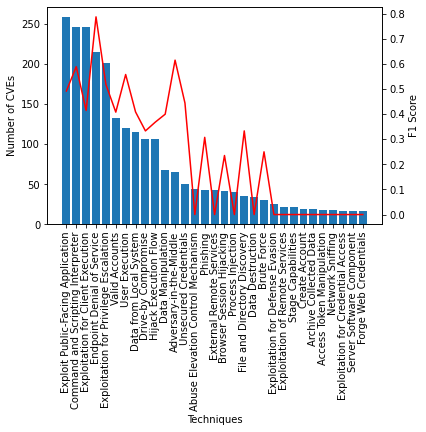

In [ ]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


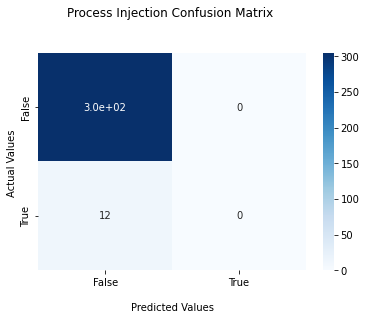

Access Token Manipulation


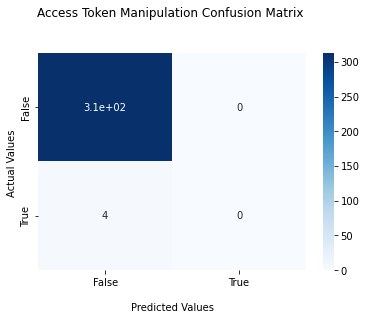

Hijack Execution Flow


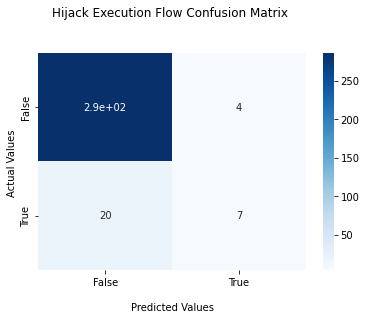

Data from Local System


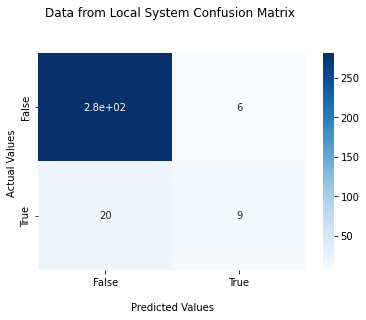

External Remote Services


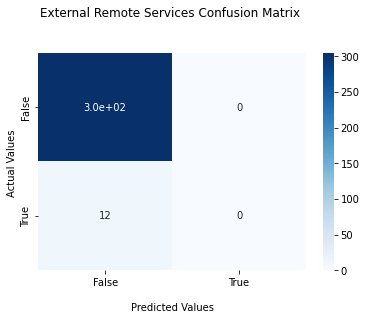

Data Manipulation


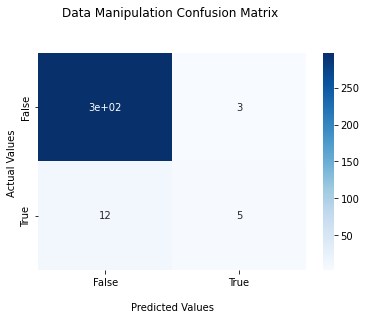

Network Sniffing


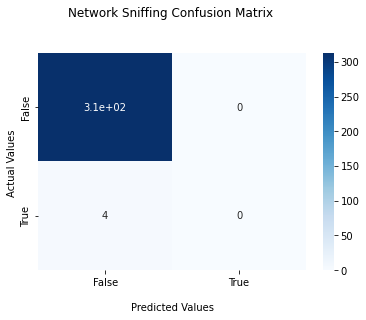

Exploitation for Privilege Escalation


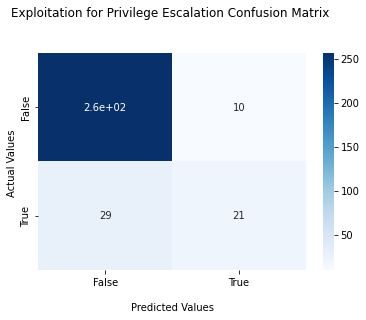

Command and Scripting Interpreter


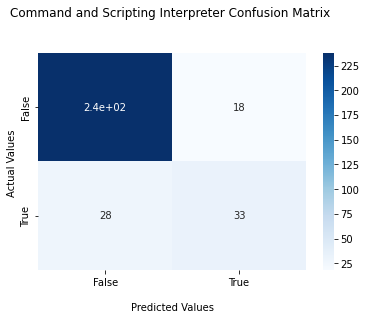

Phishing


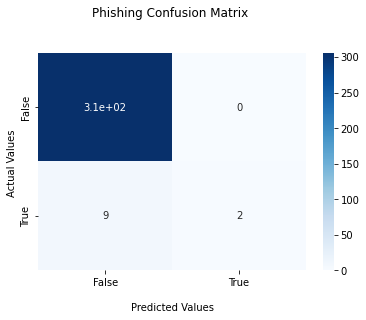

Server Software Component


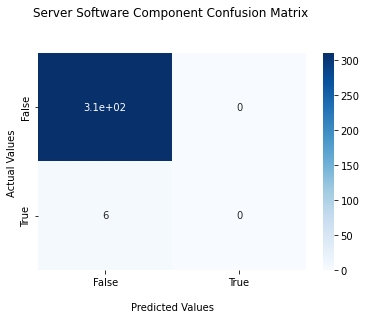

Archive Collected Data


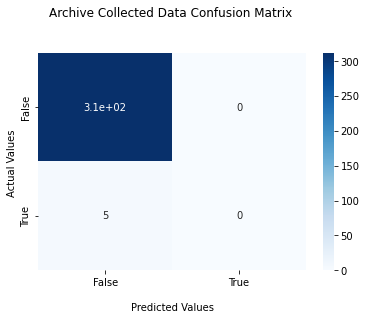

Data Destruction


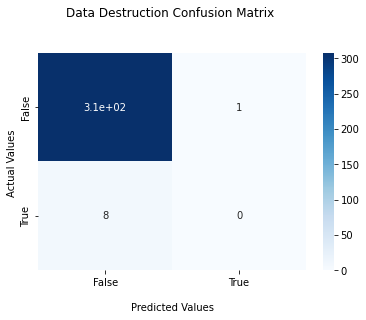

Browser Session Hijacking


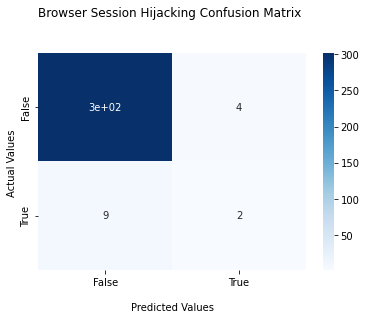

Exploitation for Credential Access


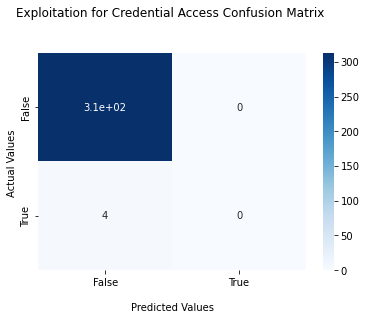

Abuse Elevation Control Mechanism


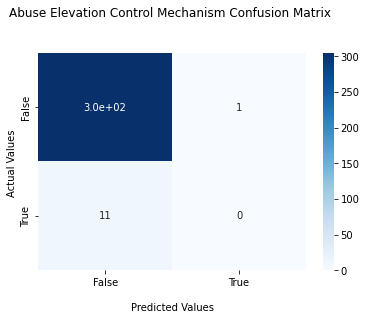

Adversary-in-the-Middle


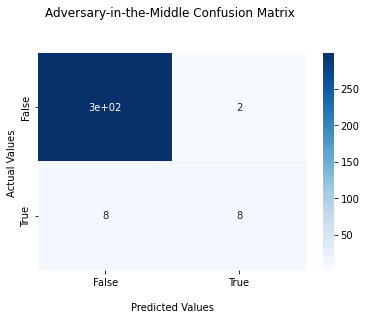

User Execution


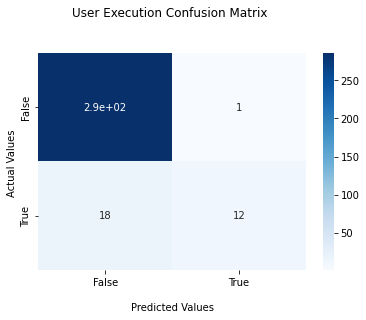

Unsecured Credentials


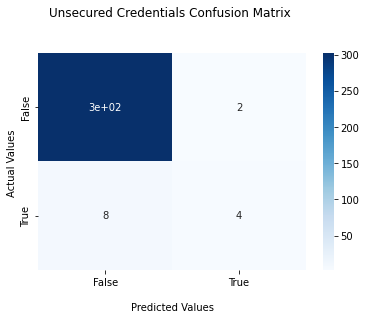

Brute Force


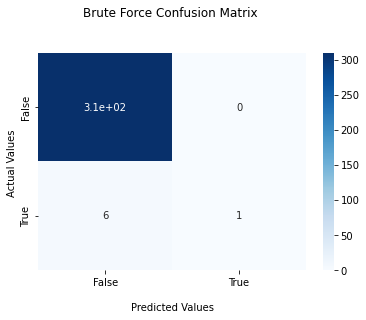

File and Directory Discovery


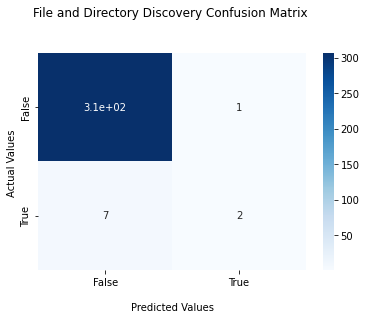

Valid Accounts


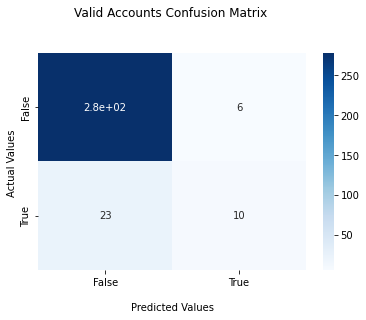

Exploitation for Defense Evasion


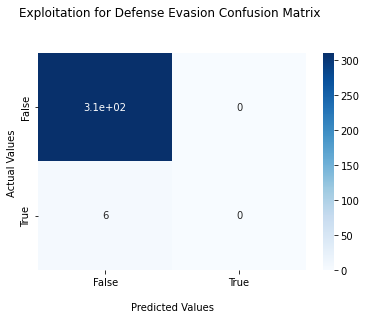

Create Account


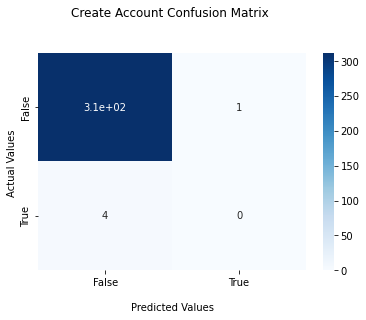

Endpoint Denial of Service


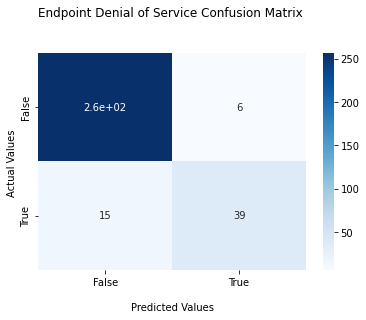

Drive-by Compromise


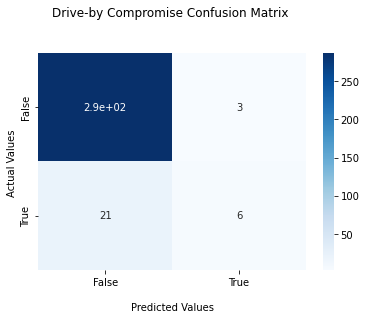

Exploitation for Client Execution


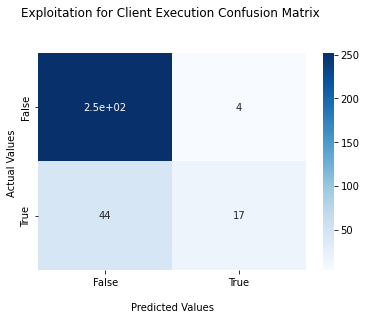

Exploitation of Remote Services


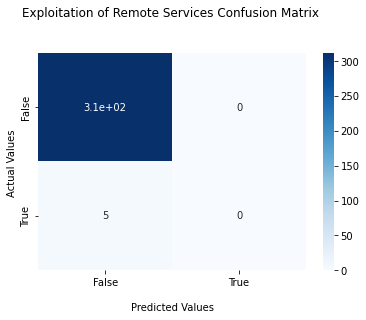

Stage Capabilities


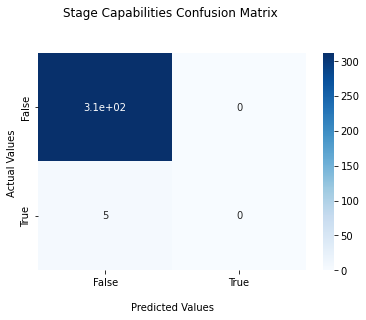

Exploit Public-Facing Application


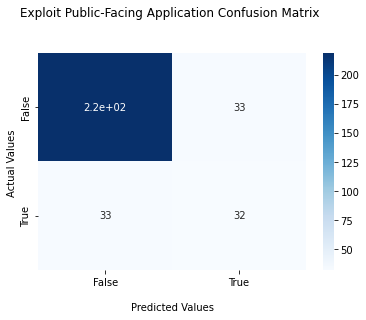

Forge Web Credentials


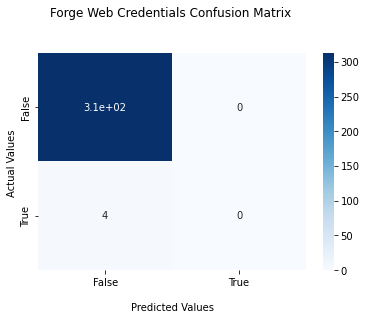

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])

# Multi-label SciBERT Extended

## Imports

In [ ]:
!pip install -q transformers


In [ ]:
import pandas as pd
import numpy as np
import pickle
import matplotlib.pyplot as plt
import seaborn as sns
import re
import copy
from tqdm.notebook import tqdm
import gc

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch import optim
from torch.utils.data import Dataset, DataLoader

from sklearn.metrics import (
    accuracy_score, 
    recall_score,
    precision_score,
    multilabel_confusion_matrix,
    f1_score, 
    classification_report
)

from transformers import (
    AutoTokenizer, 
    AutoModel,
    get_linear_schedule_with_warmup
)

from transformers import BertTokenizer

## Load the data

In [ ]:
def load_data_from_file(X_file, Y_file):
  X = pd.read_csv(X_file)
  Y = pd.read_csv(Y_file)
  
  Y = Y.astype(int)
  return (X, Y)

In [ ]:
(X_train_extended, y_train_extended) = load_data_from_file('final_extended_X_train.csv', 'final_extended_y_train.csv')
(X_test, y_test) = load_data_from_file('X_test.csv', 'y_test.csv')

from sklearn.model_selection import train_test_split
X_train, dummy_X_test, y_train, dummy_y_test = train_test_split(X_train_extended, y_train_extended, test_size=0.001, random_state=42)

## Auxiliary Functions

In [ ]:
def text_processing(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) ]
  return tokens

def text_processing_keep_nouns_verbs(text):
  doc = nlp(text)
  # Extract tokens for the given doc
  tokens = [token.lemma_ for token in doc if not (token.is_punct or token.is_space or token.is_stop) and (token.pos_=='NOUN' or token.pos_=='VERB')]
  return tokens





In [ ]:
def compute_metrics(predicted_y, true_y, metric_function, columns, limit):
  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = metric_function(true_y, predicted_y, average=None)
  sorted_results = results.sort_values(by=0, axis=1, ascending=False)
  return sorted_results.iloc[:, :limit]


In [ ]:
def print_confusion_matrix(cf_matrix, name):
  ax = sns.heatmap(cf_matrix, annot=True, cmap='Blues')

  ax.set_title(name + ' Confusion Matrix \n\n');
  ax.set_xlabel('\nPredicted Values')
  ax.set_ylabel('Actual Values ');

  ## Ticket labels - List must be in alphabetical order
  ax.xaxis.set_ticklabels(['False','True'])
  ax.yaxis.set_ticklabels(['False','True'])

  ## Display the visualization of the Confusion Matrix.
  plt.show()

In [ ]:
def print_F1_based_on_distribution(y_true, y_pred, Y, columns):
  fig,ax = plt.subplots()

  results = pd.DataFrame(columns = columns)
  results.loc[len(results)] = f1_score(y_true, y_pred, average=None)
  
  Y_count = Y.apply(np.sum, axis=0)
  Y_count_sorted = Y_count.sort_values(ascending=False)
  
  ax.bar(Y_count_sorted.index, Y_count_sorted.values)
  ax.set_xlabel("Techniques")
  ax.set_ylabel("Number of CVEs")
  plt.xticks(rotation=90)

  ax2=ax.twinx()
  ax2.plot(Y_count_sorted.index, results[Y_count_sorted.index].iloc[0], color='red')
  ax2.set_ylabel("F1 Score")

  ax = plt.gca()
  plt.show()

## Model Configuration

In [ ]:
class Config:
  def __init__(self):
    super(Config, self).__init__()

    self.SEED = 42
    self.MODEL_PATH = 'allenai/scibert_scivocab_uncased'
    self.NUM_LABELS = 31

    # data
    self.TOKENIZER = AutoTokenizer.from_pretrained(self.MODEL_PATH)
    self.MAX_LENGTH = 512
    self.BATCH_SIZE = 16
    self.VALIDATION_SPLIT = 0.25

     # model
    self.DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    self.FULL_FINETUNING = True
    self.LR = 3e-5
    self.OPTIMIZER = 'AdamW'
    self.CRITERION = 'BCEWithLogitsLoss'
    self.N_VALIDATE_DUR_TRAIN = 3
    self.N_WARMUP = 0
    self.SAVE_BEST_ONLY = True
    self.EPOCHS = 50

config = Config()

In [ ]:
def clean_abstract(text):
    text = text.split()
    text = [x.strip() for x in text]
    text = [x.replace('\n', ' ').replace('\t', ' ') for x in text]
    text = ' '.join(text)
    text = re.sub('([.,!?()])', r' \1 ', text)
    return text

def get_texts(df):
    texts = df.apply(lambda x: clean_abstract(x))
    texts = texts.values.tolist()
    return texts

class TransformerDataset(Dataset):
  def __init__(self, df, labels=None, set_type=None):
    super(TransformerDataset, self).__init__()

    self.texts = get_texts(df)
    
    self.set_type = set_type
    if self.set_type != 'test':
      self.labels = labels
    

    self.tokenizer = config.TOKENIZER
    self.max_length = config.MAX_LENGTH

  def __len__(self):
      return len(self.texts)
    
  def __getitem__(self, index):
    tokenized = self.tokenizer.encode_plus(
        self.texts[index], 
        max_length=self.max_length,
        pad_to_max_length=True,
        truncation=True,
        return_attention_mask=True,
        return_token_type_ids=False,
        return_tensors='pt'
    )
    input_ids = tokenized['input_ids'].squeeze()
    attention_mask = tokenized['attention_mask'].squeeze()

    if self.set_type != 'test':
      return {
          'input_ids': input_ids.long(),
          'attention_mask': attention_mask.long(),
          'labels': torch.Tensor(self.labels[index]).float(),
      }

    return {
        'input_ids': input_ids.long(),
        'attention_mask': attention_mask.long(),
    }


In [ ]:
train_data = TransformerDataset(X_train['Text'], y_train.values)
val_data = TransformerDataset(X_test['Text'], y_test.values)

train_dataloader = DataLoader(train_data, batch_size=config.BATCH_SIZE)
val_dataloader = DataLoader(val_data, batch_size=config.BATCH_SIZE)

b = next(iter(train_dataloader))
for k, v in b.items():
    print(f'{k} shape: {v.shape}')

input_ids shape: torch.Size([16, 512])
attention_mask shape: torch.Size([16, 512])
labels shape: torch.Size([16, 31])


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
class Model(nn.Module):
  def __init__(self):
    super(Model, self).__init__()

    self.transformer_model = AutoModel.from_pretrained(
        config.MODEL_PATH
    )
    self.dropout = nn.Dropout(0.5)
    self.output = nn.Linear(768, config.NUM_LABELS)

  def forward(self, input_ids, attention_mask=None, token_type_ids=None):
    _, o2 = self.transformer_model(
        input_ids=input_ids,
        attention_mask=attention_mask,
        token_type_ids=token_type_ids,
        return_dict=False
    )
    x = self.dropout(o2)
    x = self.output(x)
    
    return x

In [ ]:
device = config.DEVICE
device

device(type='cuda')

In [ ]:
def val(model, val_dataloader, criterion):
    
    val_loss = 0
    true, pred = [], []
    
    # set model.eval() every time during evaluation
    model.eval()
    
    for step, batch in enumerate(val_dataloader):
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # using torch.no_grad() during validation/inference is faster -
        # - since it does not update gradients.
        with torch.no_grad():
            # forward pass
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            
            # calculate loss
            loss = criterion(logits, b_labels)
            val_loss += loss.item()
            # since we're using BCEWithLogitsLoss, to get the predictions -
            # - sigmoid has to be applied on the logits first
            logits = torch.sigmoid(logits)
            
            logits = np.round(logits.cpu().numpy())
            
            labels = b_labels.cpu().numpy()
            
            # the tensors are detached from the gpu and put back on -
            # - the cpu, and then converted to numpy in order to -
            # - use sklearn's metrics.

            pred.extend(logits)
            true.extend(labels)

    avg_val_loss = val_loss / len(val_dataloader)
    print('Eval Val loss:', avg_val_loss)
    print('Eval Val accuracy:', accuracy_score(true, pred))
    
    
    val_micro_f1_score = f1_score(true, pred, average='micro')
    print('Eval Val micro f1 score:', val_micro_f1_score)
    return val_micro_f1_score

def train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch):
    
    # we validate config.N_VALIDATE_DUR_TRAIN times during the training loop
    nv = config.N_VALIDATE_DUR_TRAIN
    temp = len(train_dataloader) // nv
    
    if temp > 100:
      temp = temp - (temp % 100)
    validate_at_steps = [temp * x for x in range(1, nv + 1)]
    
    train_loss = 0
    for step, batch in enumerate(tqdm(train_dataloader, 
                                      desc='Epoch ' + str(epoch))):
        # set model.eval() every time during training
        model.train()
        
        # unpack the batch contents and push them to the device (cuda or cpu).
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)
        b_labels = batch['labels'].to(device)

        # clear accumulated gradients
        optimizer.zero_grad()

        # forward pass
        logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
        
        # calculate loss
        loss = criterion(logits, b_labels)
        train_loss += loss.item()

        # backward pass
        loss.backward()

        # update weights
        optimizer.step()
        
        # update scheduler
        scheduler.step()

        if step in validate_at_steps:
            print(f'-- Step: {step}')
            _ = val(model, val_dataloader, criterion)
    
    avg_train_loss = train_loss / len(train_dataloader)
    print('Training loss:', avg_train_loss)


In [ ]:
def run():
    # setting a seed ensures reproducible results.
    # seed may affect the performance too.
    torch.manual_seed(config.SEED)

    criterion = nn.BCEWithLogitsLoss()
    
    # define the parameters to be optmized -
    # - and add regularization
    if config.FULL_FINETUNING:
        param_optimizer = list(model.named_parameters())
        no_decay = ["bias", "LayerNorm.bias", "LayerNorm.weight"]
        optimizer_parameters = [
            {
                "params": [
                    p for n, p in param_optimizer if not any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.001,
            },
            {
                "params": [
                    p for n, p in param_optimizer if any(nd in n for nd in no_decay)
                ],
                "weight_decay": 0.0,
            },
        ]
        optimizer = optim.AdamW(optimizer_parameters, lr=config.LR)
    
    num_training_steps = len(train_dataloader) * config.EPOCHS
    scheduler = get_linear_schedule_with_warmup(
        optimizer,
        num_warmup_steps=0,
        num_training_steps=num_training_steps
    )
    
    max_val_micro_f1_score = float('-inf')
    for epoch in range(config.EPOCHS):
        train(model, train_dataloader, val_dataloader, criterion, optimizer, scheduler, epoch)
        val_micro_f1_score = val(model, val_dataloader, criterion)
        print("Epoch " + str(epoch) + "/" + str(config.EPOCHS) + ": F1 Score " + str(val_micro_f1_score))
        if config.SAVE_BEST_ONLY:
            if val_micro_f1_score > max_val_micro_f1_score:
                best_model = copy.deepcopy(model)
                best_val_micro_f1_score = val_micro_f1_score

                model_name = 'extended_scibertfft_best_model'
                torch.save(best_model.state_dict(), model_name + '.pt')

                print(f'--- Best Model. Val loss: {max_val_micro_f1_score} -> {val_micro_f1_score}')
                max_val_micro_f1_score = val_micro_f1_score

    return best_model, best_val_micro_f1_score


## Train

In [ ]:
model = Model()
model.to(device);

Downloading:   0%|          | 0.00/422M [00:00<?, ?B/s]

Some weights of the model checkpoint at allenai/scibert_scivocab_uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.predictions.bias', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
best_model, best_val_micro_f1_score = run()

Epoch 0:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.23027530908584595
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2241603761911392
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22313694134354592
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Training loss: 0.21452027526313225


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22313694134354592
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0
Epoch 0/50: F1 Score 0.0
--- Best Model. Val loss: -inf -> 0.0


Epoch 1:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21707965433597565
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20567352548241616
Eval Val accuracy: 0.0
Eval Val micro f1 score: 0.0


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19620534628629685
Eval Val accuracy: 0.012618296529968454
Eval Val micro f1 score: 0.04173354735152488
Training loss: 0.1600741583820993


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19620534628629685
Eval Val accuracy: 0.012618296529968454
Eval Val micro f1 score: 0.04173354735152488
Epoch 1/50: F1 Score 0.04173354735152488
--- Best Model. Val loss: 0.0 -> 0.04173354735152488


Epoch 2:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.18653740510344505
Eval Val accuracy: 0.03470031545741325
Eval Val micro f1 score: 0.14814814814814814


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18193298652768136
Eval Val accuracy: 0.0473186119873817
Eval Val micro f1 score: 0.16320474777448074


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1754160076379776
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2150837988826816
Training loss: 0.11806849766094073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1754160076379776
Eval Val accuracy: 0.056782334384858045
Eval Val micro f1 score: 0.2150837988826816
Epoch 2/50: F1 Score 0.2150837988826816
--- Best Model. Val loss: 0.04173354735152488 -> 0.2150837988826816


Epoch 3:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1716548852622509
Eval Val accuracy: 0.05993690851735016
Eval Val micro f1 score: 0.24


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.16786255575716497
Eval Val accuracy: 0.07570977917981073
Eval Val micro f1 score: 0.29949238578680204


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.16938890665769576
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3538998835855646
Training loss: 0.08468223000522208


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16938890665769576
Eval Val accuracy: 0.08517350157728706
Eval Val micro f1 score: 0.3538998835855646
Epoch 3/50: F1 Score 0.3538998835855646
--- Best Model. Val loss: 0.2150837988826816 -> 0.3538998835855646


Epoch 4:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.16676804125308992
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.3552941176470588


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.16839914545416831
Eval Val accuracy: 0.09779179810725552
Eval Val micro f1 score: 0.32138442521631644


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.17021463438868523
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42553191489361697
Training loss: 0.06466219190145488


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17021463438868523
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.42553191489361697
Epoch 4/50: F1 Score 0.42553191489361697
--- Best Model. Val loss: 0.3538998835855646 -> 0.42553191489361697


Epoch 5:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1671617515385151
Eval Val accuracy: 0.13564668769716087
Eval Val micro f1 score: 0.4096916299559471


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17568595558404923
Eval Val accuracy: 0.10410094637223975
Eval Val micro f1 score: 0.3300248138957817


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.16945114992558957
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.43887775551102204
Training loss: 0.052715393904168


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.16945114992558957
Eval Val accuracy: 0.13249211356466878
Eval Val micro f1 score: 0.43887775551102204
Epoch 5/50: F1 Score 0.43887775551102204
--- Best Model. Val loss: 0.42553191489361697 -> 0.43887775551102204


Epoch 6:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17390803769230842
Eval Val accuracy: 0.11987381703470032
Eval Val micro f1 score: 0.42016806722689076


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17236339263617992
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.4021857923497268


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.17354299761354924
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.41666666666666663
Training loss: 0.04377663518771925


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17354299761354924
Eval Val accuracy: 0.12302839116719243
Eval Val micro f1 score: 0.41666666666666663
Epoch 6/50: F1 Score 0.41666666666666663


Epoch 7:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17230152636766433
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.444672131147541


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17389737255871296
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44758064516129037


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1759657695889473
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4531548757170172
Training loss: 0.037012336528406735


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1759657695889473
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4531548757170172
Epoch 7/50: F1 Score 0.4531548757170172
--- Best Model. Val loss: 0.43887775551102204 -> 0.4531548757170172


Epoch 8:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1740559495985508
Eval Val accuracy: 0.14195583596214512
Eval Val micro f1 score: 0.4349553128103277


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.1752991110086441
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.44696969696969696


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.17882154732942582
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.44061302681992337
Training loss: 0.03150534391633968


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.17882154732942582
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.44061302681992337
Epoch 8/50: F1 Score 0.44061302681992337


Epoch 9:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17699725553393364
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4281345565749235


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17688088081777095
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4500978473581213


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1793137051165104
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4526515151515152
Training loss: 0.027399351350567508


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1793137051165104
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4526515151515152
Epoch 9/50: F1 Score 0.4526515151515152


Epoch 10:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17663459330797196
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.463681592039801


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.17829950004816056
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44926108374384244


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.1821184739470482
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.462890625
Training loss: 0.023428874543612508


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.1821184739470482
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.462890625
Epoch 10/50: F1 Score 0.462890625
--- Best Model. Val loss: 0.4531548757170172 -> 0.462890625


Epoch 11:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.17950907498598098
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4505703422053232


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18610288351774215
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.44547996272134205


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18041039183735846
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4677268475210477
Training loss: 0.0206078961800652


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18041039183735846
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4677268475210477
Epoch 11/50: F1 Score 0.4677268475210477
--- Best Model. Val loss: 0.462890625 -> 0.4677268475210477


Epoch 12:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.18311014771461487
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4758364312267658


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18586282581090927
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.4521224086870681


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18406288772821428
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48219178082191777
Training loss: 0.018234927677013707


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18406288772821428
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48219178082191777
Epoch 12/50: F1 Score 0.48219178082191777
--- Best Model. Val loss: 0.4677268475210477 -> 0.48219178082191777


Epoch 13:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1865097161382437
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4701421800947867


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.18657025843858718
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.45961538461538465


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.18732612133026122
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4681255946717412
Training loss: 0.015783887482207038


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.18732612133026122
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4681255946717412
Epoch 13/50: F1 Score 0.4681255946717412


Epoch 14:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19247045777738095
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.44291338582677164


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.1901750635355711
Eval Val accuracy: 0.14826498422712933
Eval Val micro f1 score: 0.4624390243902439


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19019125476479531
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48000000000000004
Training loss: 0.014236360217601192


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19019125476479531
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.48000000000000004
Epoch 14/50: F1 Score 0.48000000000000004


Epoch 15:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19162462130188943
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4740321057601511


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19585949257016183
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.456071076011846


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19211655519902707
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46507177033492825
Training loss: 0.012711857196223815


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19211655519902707
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46507177033492825
Epoch 15/50: F1 Score 0.46507177033492825


Epoch 16:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19511722773313522
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4723809523809524


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19189202040433884
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4763705103969755


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19724009111523627
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4900181488203267
Training loss: 0.01125634707246734


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19724009111523627
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4900181488203267
Epoch 16/50: F1 Score 0.4900181488203267
--- Best Model. Val loss: 0.48219178082191777 -> 0.4900181488203267


Epoch 17:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.19901565834879875
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.47309833024118736


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.19911884590983392
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4619826756496631


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.19907351955771446
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4658040665434381
Training loss: 0.009951591989297452


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.19907351955771446
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4658040665434381
Epoch 17/50: F1 Score 0.4658040665434381


Epoch 18:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.1991370514035225
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48154981549815495


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20026638135313987
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.47962962962962963


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2030116766691208
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4796380090497737
Training loss: 0.009285350496040047


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2030116766691208
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4796380090497737
Epoch 18/50: F1 Score 0.4796380090497737


Epoch 19:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20465077683329583
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4608294930875576


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2026486538350582
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.46927374301675984


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2084808997809887
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46562786434463793
Training loss: 0.008593956531907341


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2084808997809887
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.46562786434463793
Epoch 19/50: F1 Score 0.46562786434463793


Epoch 20:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20260342806577683
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.47005444646098


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2058243714272976
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48913043478260876


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.20552781745791435
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4868778280542986
Training loss: 0.007789992581047447


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20552781745791435
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4868778280542986
Epoch 20/50: F1 Score 0.4868778280542986


Epoch 21:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20576964393258096
Eval Val accuracy: 0.19242902208201892
Eval Val micro f1 score: 0.49350649350649356


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20611162707209588
Eval Val accuracy: 0.1892744479495268
Eval Val micro f1 score: 0.4916820702402958


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.20893622636795045
Eval Val accuracy: 0.1892744479495268
Eval Val micro f1 score: 0.4786641929499072
Training loss: 0.007301363690171094


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20893622636795045
Eval Val accuracy: 0.1892744479495268
Eval Val micro f1 score: 0.4786641929499072
Epoch 21/50: F1 Score 0.4786641929499072


Epoch 22:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.20728769674897193
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.491103202846975


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.20932915434241295
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48820326678765885


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21013183146715164
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4862888482632541
Training loss: 0.006525810626623905


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21013183146715164
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4862888482632541
Epoch 22/50: F1 Score 0.4862888482632541


Epoch 23:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21299802139401436
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4911347517730497


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21078618839383126
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4788990825688073


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.20995313972234725
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4763670064874884
Training loss: 0.006235288142894222


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.20995313972234725
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4763670064874884
Epoch 23/50: F1 Score 0.4763670064874884


Epoch 24:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21232406944036483
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4855072463768116


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21431263238191606
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48529411764705876


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21854253187775613
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48618784530386744
Training loss: 0.005568624314938598


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21854253187775613
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48618784530386744
Epoch 24/50: F1 Score 0.48618784530386744


Epoch 25:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2168608456850052
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.492831541218638


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.21502387374639512
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4738292011019284


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21847605630755423
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4758364312267658
Training loss: 0.005165457553992592


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21847605630755423
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4758364312267658
Epoch 25/50: F1 Score 0.4758364312267658


Epoch 26:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.21386964991688728
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48667850799289525


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22016207426786422
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4740321057601511


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.21946242973208427
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4895359417652411
Training loss: 0.004973682366822541


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.21946242973208427
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4895359417652411
Epoch 26/50: F1 Score 0.4895359417652411


Epoch 27:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22129423767328263
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4900181488203267


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22260946407914162
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48639157155399476


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22293191775679588
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4813805631244324
Training loss: 0.004430451131615359


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22293191775679588
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4813805631244324
Epoch 27/50: F1 Score 0.4813805631244324


Epoch 28:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22152414545416832
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4923903312444046


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22531725764274596
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4806629834254144


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22530072629451753
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4835164835164836
Training loss: 0.0042958285781118065


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22530072629451753
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4835164835164836
Epoch 28/50: F1 Score 0.4835164835164836


Epoch 29:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22172070667147636
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4859981933152665


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22462182641029357
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4932003626473255


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2232753813266754
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49911190053285964
Training loss: 0.003997741582848758


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2232753813266754
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49911190053285964
Epoch 29/50: F1 Score 0.49911190053285964
--- Best Model. Val loss: 0.4900181488203267 -> 0.49911190053285964


Epoch 30:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22635448202490807
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4868301544050863


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23046368286013602
Eval Val accuracy: 0.1608832807570978
Eval Val micro f1 score: 0.4733395696913003


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2293834686279297
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4700460829493087
Training loss: 0.0037455628904209067


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2293834686279297
Eval Val accuracy: 0.15141955835962145
Eval Val micro f1 score: 0.4700460829493087
Epoch 30/50: F1 Score 0.4700460829493087


Epoch 31:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22598337829113008
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.49551166965888693


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22805873602628707
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4918032786885245


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.22781227752566338
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.491103202846975
Training loss: 0.0035461502827588568


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.22781227752566338
Eval Val accuracy: 0.14511041009463724
Eval Val micro f1 score: 0.491103202846975
Epoch 31/50: F1 Score 0.491103202846975


Epoch 32:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.22628114968538285
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.497704315886134


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.22855523228645325
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4913557779799818


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23275776952505112
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4810360777058279
Training loss: 0.0033570064542881024


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23275776952505112
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.4810360777058279
Epoch 32/50: F1 Score 0.4810360777058279


Epoch 33:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.23198721259832383
Eval Val accuracy: 0.1829652996845426
Eval Val micro f1 score: 0.49183303085299457


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23300630152225493
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4937388193202147


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2362315036356449
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47822057460611683
Training loss: 0.0030827716207214163


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2362315036356449
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.47822057460611683
Epoch 33/50: F1 Score 0.47822057460611683


Epoch 34:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.23441547378897667
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4867337602927722


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23634816631674765
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4864864864864865


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23603277429938316
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4785388127853881
Training loss: 0.0029642569368387842


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23603277429938316
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4785388127853881
Epoch 34/50: F1 Score 0.4785388127853881


Epoch 35:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2355131521821022
Eval Val accuracy: 0.15457413249211358
Eval Val micro f1 score: 0.485947416137806


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.23688644543290138
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4828226555246053


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23792073130607605
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47846012832263973
Training loss: 0.002841603698052334


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23792073130607605
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.47846012832263973
Epoch 35/50: F1 Score 0.47846012832263973


Epoch 36:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.23842387348413469
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4878923766816144


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2380615144968033
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.48618784530386744


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.23693635910749436
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4827586206896552
Training loss: 0.0027337716240744907


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.23693635910749436
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4827586206896552
Epoch 36/50: F1 Score 0.4827586206896552


Epoch 37:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2385239914059639
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.4922515952597995


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2389884904026985
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.486586493987049


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2405274786055088
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4902309058614564
Training loss: 0.0026034590011911746


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2405274786055088
Eval Val accuracy: 0.1640378548895899
Eval Val micro f1 score: 0.4902309058614564
Epoch 37/50: F1 Score 0.4902309058614564


Epoch 38:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2412709340453148
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4896115627822945


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24250804334878923
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4817518248175182


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2430499814450741
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4881474978050922
Training loss: 0.002597624696409989


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2430499814450741
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4881474978050922
Epoch 38/50: F1 Score 0.4881474978050922


Epoch 39:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2421888716518879
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4834558823529412


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2432638168334961
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.48158131176999097


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24235021993517875
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4854545454545454
Training loss: 0.0024265979817940696


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24235021993517875
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4854545454545454
Epoch 39/50: F1 Score 0.4854545454545454


Epoch 40:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24387528523802757
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4895359417652411


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24370930939912797
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49126034958601655


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24561101272702218
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48194945848375453
Training loss: 0.002315316104332183


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24561101272702218
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48194945848375453
Epoch 40/50: F1 Score 0.48194945848375453


Epoch 41:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24366804510354995
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4877606527651858


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24330962002277373
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.49230769230769234


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24418248534202575
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49270072992700725
Training loss: 0.002192739674675204


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24418248534202575
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.49270072992700725
Epoch 41/50: F1 Score 0.49270072992700725


Epoch 42:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2455560967326164
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4954128440366972


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24706169962882996
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4845735027223231


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2458777353167534
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4827586206896552
Training loss: 0.0021309251345867143


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2458777353167534
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4827586206896552
Epoch 42/50: F1 Score 0.4827586206896552


Epoch 43:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.246286853402853
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4936479128856624


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.247139011323452
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4839006439742411


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2477595753967762
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48692515779981965
Training loss: 0.002135202612117988


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2477595753967762
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48692515779981965
Epoch 43/50: F1 Score 0.48692515779981965


Epoch 44:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24839945882558823
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4845735027223231


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24675531014800073
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4891696750902527


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24774730950593948
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49144914491449143
Training loss: 0.0020578786394913244


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24774730950593948
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.49144914491449143
Epoch 44/50: F1 Score 0.49144914491449143


Epoch 45:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.2473070040345192
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.4896489648964896


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24738868102431297
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4885635864592864


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24659224599599838
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4887690925426775
Training loss: 0.001993832617289329


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24659224599599838
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4887690925426775
Epoch 45/50: F1 Score 0.4887690925426775


Epoch 46:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24822158887982368
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.488245931283906


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.24860355108976365
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.48957388939256574


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2492401622235775
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4832579185520362
Training loss: 0.0019429745595589017


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2492401622235775
Eval Val accuracy: 0.15772870662460567
Eval Val micro f1 score: 0.4832579185520362
Epoch 46/50: F1 Score 0.4832579185520362


Epoch 47:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24865347072482108
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4886877828054298


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2488885872066021
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.48771610555050043


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.249138543009758
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4904977375565611
Training loss: 0.001905395714535205


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.249138543009758
Eval Val accuracy: 0.167192429022082
Eval Val micro f1 score: 0.4904977375565611
Epoch 47/50: F1 Score 0.4904977375565611


Epoch 48:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24968369528651238
Eval Val accuracy: 0.17665615141955837
Eval Val micro f1 score: 0.49230769230769234


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2492694541811943
Eval Val accuracy: 0.17981072555205047
Eval Val micro f1 score: 0.48633879781420764


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.2489909641444683
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48540145985401456
Training loss: 0.0018770578224624021


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.2489909641444683
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.48540145985401456
Epoch 48/50: F1 Score 0.48540145985401456


Epoch 49:   0%|          | 0/226 [00:00<?, ?it/s]

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 75
Eval Val loss: 0.24919147938489913
Eval Val accuracy: 0.17350157728706625
Eval Val micro f1 score: 0.4867821330902461


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 150
Eval Val loss: 0.2491676278412342
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4854545454545454


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


-- Step: 225
Eval Val loss: 0.24914852827787398
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4854545454545454
Training loss: 0.0018624182434060273


/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


Eval Val loss: 0.24914852827787398
Eval Val accuracy: 0.17034700315457413
Eval Val micro f1 score: 0.4854545454545454
Epoch 49/50: F1 Score 0.4854545454545454


## Test

In [ ]:
from tensorflow import keras

# MLP for Pima Indians Dataset Serialize to JSON and HDF5
from tensorflow.keras.models import Sequential, model_from_json
from tensorflow.keras.layers import Dense

best_model = Model()
best_model.to(device);
best_model.load_state_dict(torch.load('/content/extended_scibertfft_best_model.pt'))

test_data = TransformerDataset(X_test['Text'], y_test.values, set_type='test')
test_dataloader = DataLoader(test_data, batch_size=config.BATCH_SIZE)


Some weights of the model checkpoint at allenai/scibert_scivocab_uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.predictions.transform.dense.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight', 'cls.predictions.decoder.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.LayerNorm.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [ ]:
def predict(model):
    val_loss = 0
    test_pred = []
    model.eval()
    for step, batch in enumerate(test_dataloader):
        b_input_ids = batch['input_ids'].to(device)
        b_attention_mask = batch['attention_mask'].to(device)

        with torch.no_grad():
            logits = model(input_ids=b_input_ids, attention_mask=b_attention_mask)
            logits = torch.sigmoid(logits)
            logits = np.round(logits.cpu().numpy())
            test_pred.extend(logits)

    test_pred = np.array(test_pred)
    return test_pred

In [ ]:
test_pred = predict(best_model)

/usr/local/lib/python3.7/dist-packages/transformers/tokenization_utils_base.py:2307: FutureWarning: The `pad_to_max_length` argument is deprecated and will be removed in a future version, use `padding=True` or `padding='longest'` to pad to the longest sequence in the batch, or use `padding='max_length'` to pad to a max length. In this case, you can give a specific length with `max_length` (e.g. `max_length=45`) or leave max_length to None to pad to the maximal input size of the model (e.g. 512 for Bert).
  FutureWarning,


In [ ]:
test_pred[5]

array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
      dtype=float32)

In [ ]:
print(accuracy_score(y_test.values, test_pred))

0.17034700315457413


In [ ]:
print("F1 Score")
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 20)

F1 Score


,Endpoint Denial of Service,Forge Web Credentials,Unsecured Credentials,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Brute Force,Exploitation for Client Execution,User Execution,Drive-by Compromise,Data Manipulation,Exploit Public-Facing Application,Hijack Execution Flow,Valid Accounts,Data from Local System,Browser Session Hijacking,Phishing,Archive Collected Data,File and Directory Discovery,Server Software Component
0,0.803571,0.666667,0.666667,0.641221,0.625,0.615385,0.6,0.584906,0.518519,0.5,0.457143,0.455285,0.425532,0.387097,0.377358,0.333333,0.333333,0.285714,0.285714,0.25


In [ ]:
compute_metrics(test_pred, y_test.values, f1_score, y_test.columns, 25)

,Endpoint Denial of Service,Forge Web Credentials,Unsecured Credentials,Command and Scripting Interpreter,Exploitation for Privilege Escalation,Adversary-in-the-Middle,Brute Force,Exploitation for Client Execution,User Execution,Drive-by Compromise,...,Browser Session Hijacking,Phishing,Archive Collected Data,File and Directory Discovery,Server Software Component,External Remote Services,Process Injection,Exploitation for Defense Evasion,Create Account,Access Token Manipulation
0,0.803571,0.666667,0.666667,0.641221,0.625,0.615385,0.6,0.584906,0.518519,0.5,...,0.333333,0.333333,0.285714,0.285714,0.25,0.142857,0.125,0.0,0.0,0.0


In [ ]:
print("Recall Score")
compute_metrics(test_pred, y_test.values, recall_score, y_test.columns, 20)

Recall Score


,Endpoint Denial of Service,Unsecured Credentials,Exploitation for Privilege Escalation,Command and Scripting Interpreter,Exploitation for Client Execution,Forge Web Credentials,Adversary-in-the-Middle,Data Manipulation,User Execution,Exploit Public-Facing Application,Brute Force,Drive-by Compromise,Hijack Execution Flow,Valid Accounts,Data from Local System,Browser Session Hijacking,Phishing,File and Directory Discovery,Archive Collected Data,Server Software Component
0,0.833333,0.75,0.7,0.688525,0.508197,0.5,0.5,0.470588,0.466667,0.430769,0.428571,0.407407,0.37037,0.363636,0.344828,0.272727,0.272727,0.222222,0.2,0.166667


In [ ]:
print("Precision Score")
compute_metrics(test_pred, y_test.values, precision_score, y_test.columns, 20)

Precision Score


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


,Forge Web Credentials,Brute Force,Adversary-in-the-Middle,Endpoint Denial of Service,Exploitation for Client Execution,Drive-by Compromise,Unsecured Credentials,Command and Scripting Interpreter,User Execution,Exploitation for Privilege Escalation,Archive Collected Data,Server Software Component,External Remote Services,Hijack Execution Flow,Exploit Public-Facing Application,Data Manipulation,Browser Session Hijacking,Phishing,Data from Local System,Valid Accounts
0,1.0,1.0,0.8,0.775862,0.688889,0.647059,0.6,0.6,0.583333,0.564516,0.5,0.5,0.5,0.5,0.482759,0.444444,0.428571,0.428571,0.416667,0.413793


In [ ]:
print(f1_score(y_test.values, test_pred, average='weighted'))

0.47840078252784063


In [ ]:
print(precision_score(y_test.values, test_pred, average='weighted'))

0.5252739536218823


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
print(recall_score(y_test.values, test_pred, average='weighted'))

0.45901639344262296


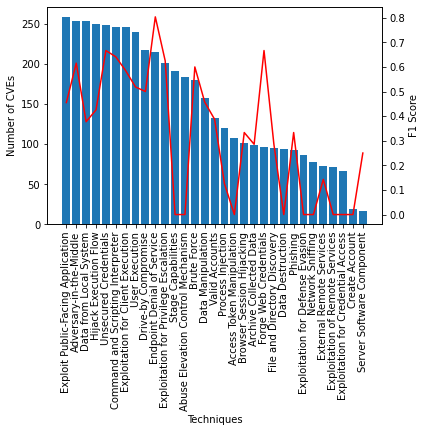

In [ ]:
print_F1_based_on_distribution(y_test.values, test_pred, y_train,  y_test.columns)

Process Injection


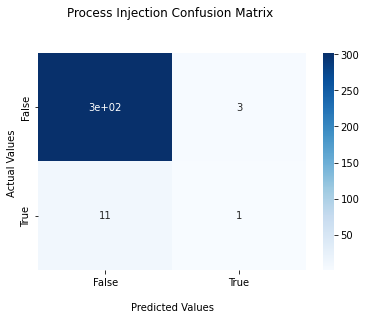

Access Token Manipulation


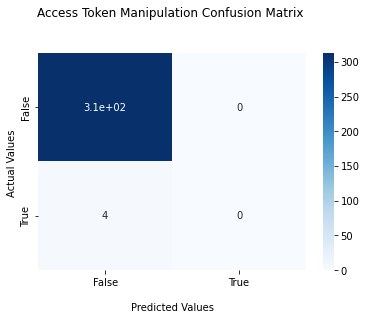

Hijack Execution Flow


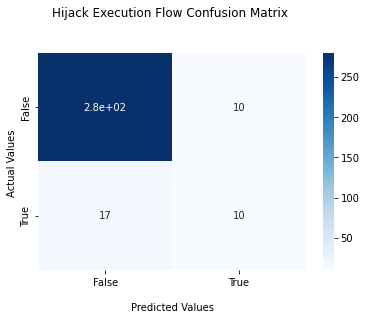

Data from Local System


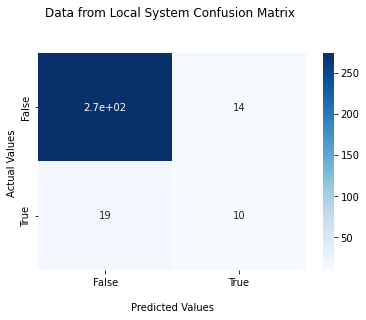

External Remote Services


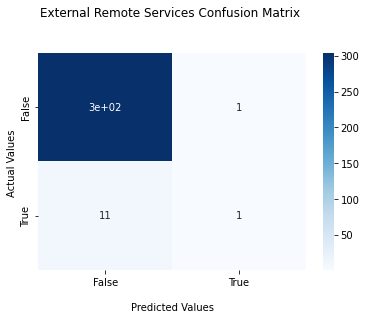

Data Manipulation


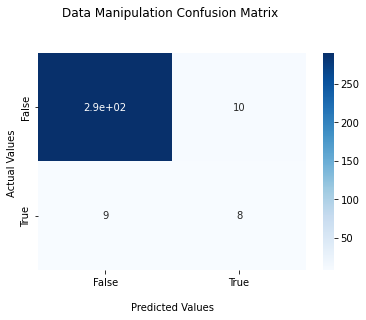

Network Sniffing


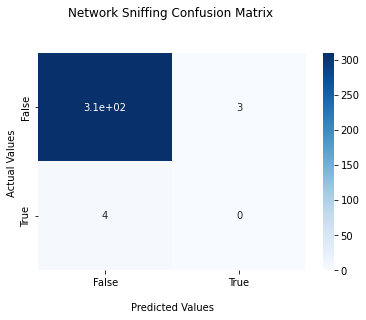

Exploitation for Privilege Escalation


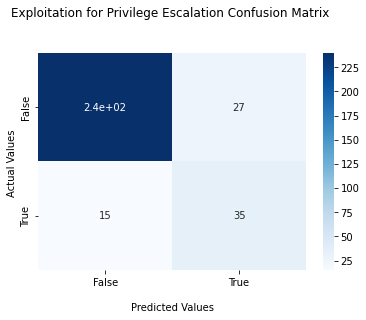

Command and Scripting Interpreter


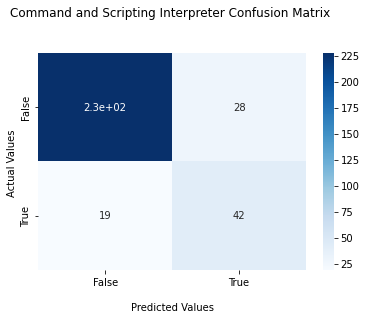

Phishing


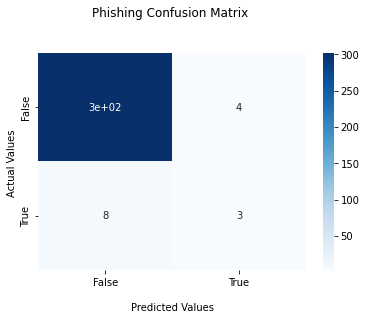

Server Software Component


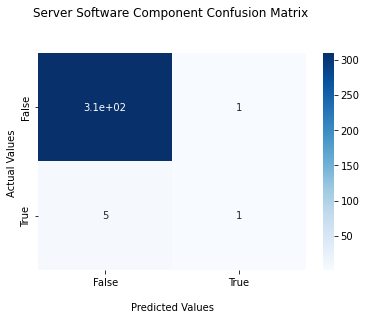

Archive Collected Data


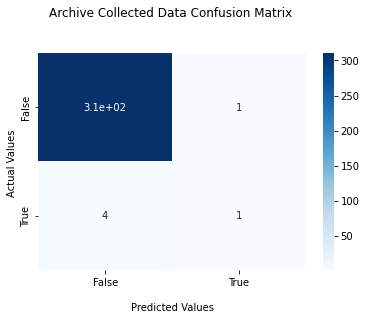

Data Destruction


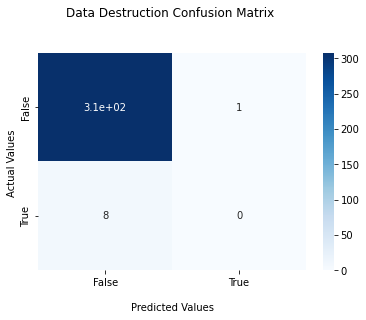

Browser Session Hijacking


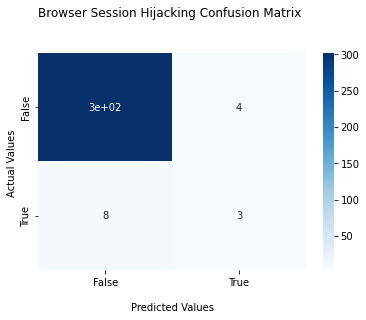

Exploitation for Credential Access


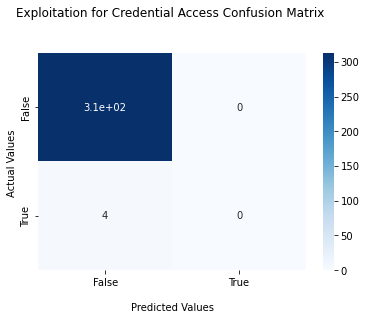

Abuse Elevation Control Mechanism


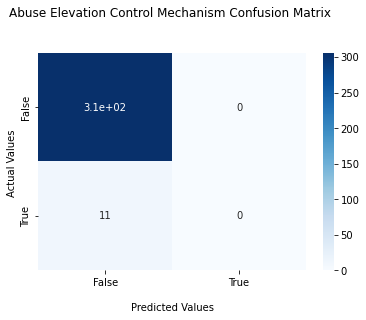

Adversary-in-the-Middle


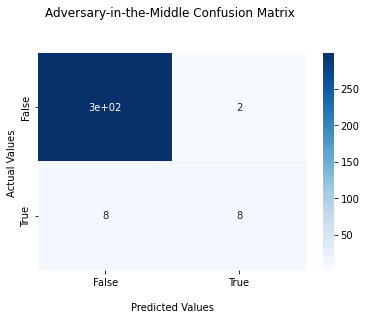

User Execution


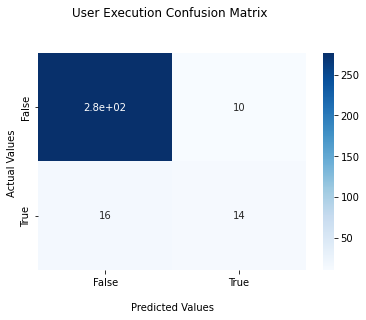

Unsecured Credentials


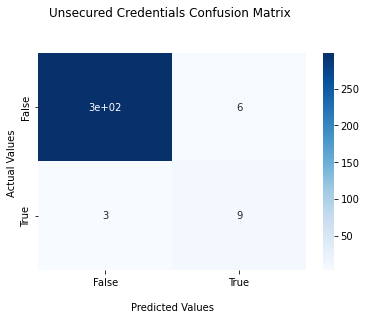

Brute Force


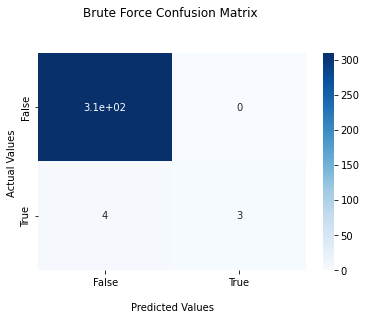

File and Directory Discovery


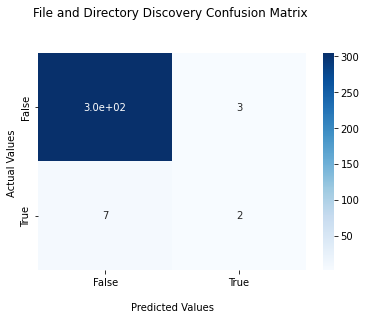

Valid Accounts


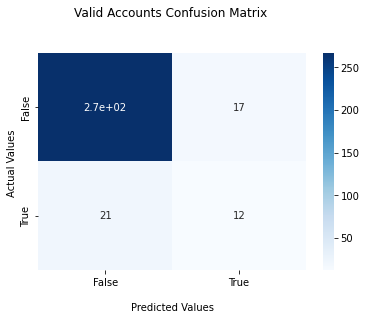

Exploitation for Defense Evasion


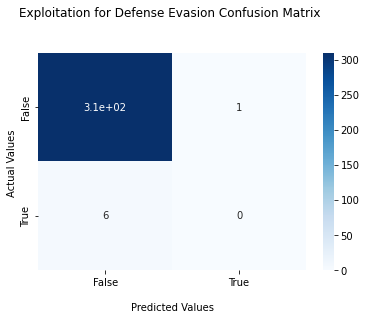

Create Account


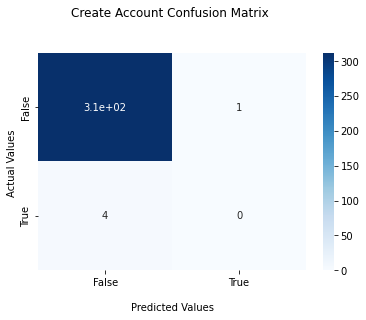

Endpoint Denial of Service


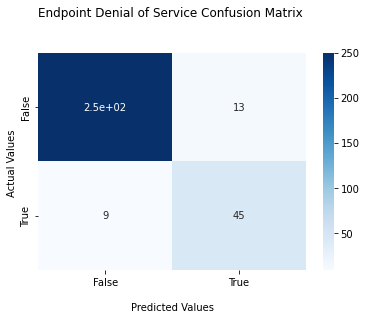

Drive-by Compromise


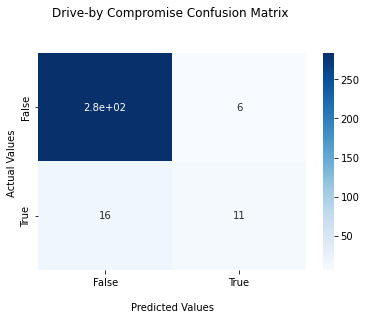

Exploitation for Client Execution


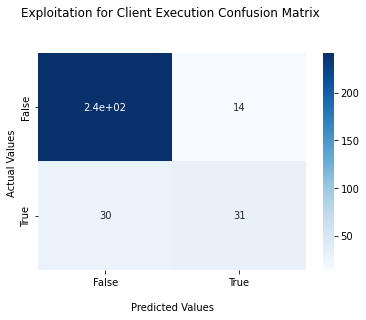

Exploitation of Remote Services


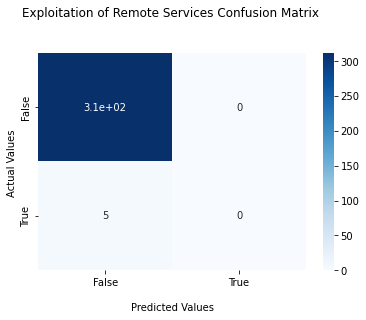

Stage Capabilities


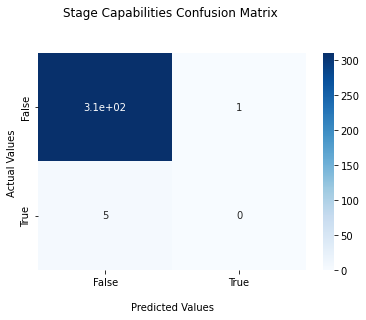

Exploit Public-Facing Application


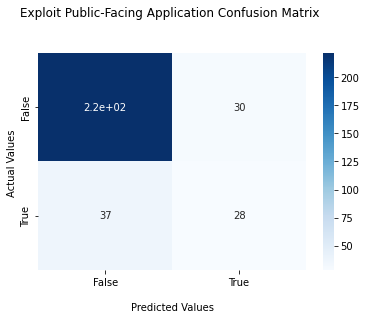

Forge Web Credentials


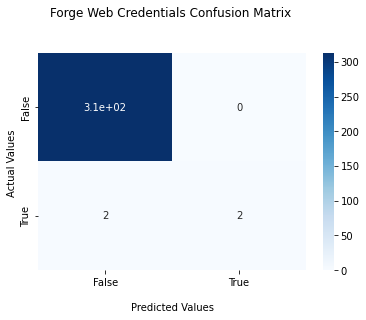

In [ ]:
conf_matrix = multilabel_confusion_matrix(y_test.values, test_pred)
for i in range(31):
  print(y_test.columns[i])
  print_confusion_matrix(conf_matrix[i], y_test.columns[i])